###How to read code:

This code is divided into different subsections to make it easier to read. Almost all results from the final report are located in this notebook, except for the time-series cross validation, which is in the Week 10 notebook. For model performances, there are often multiple runs included to either show training/validation versus testing results, or the feature selection/hyperparameter tuning process. All code generated from ChatGPT is prefanced with a @CITATION, generally at the top of the code block (though in some cases more specific).

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import sklearn
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.preprocessing import OneHotEncoder
import xgboost as xgb

In [ ]:
final_train = pd.read_csv("/content/drive/MyDrive/Fall '24/COS 397 ML IW/FINAL PROJECT/Data Preprocessing/Final Data 12 5 (includes all) /Not standardized/final_train_not_std_no_engineering.csv")
train = pd.read_csv("/content/drive/MyDrive/Fall '24/COS 397 ML IW/FINAL PROJECT/Data Preprocessing/Final Data 12 5 (includes all) /Not standardized/train_encoded_not_std_no_engineering.csv")
val = pd.read_csv("/content/drive/MyDrive/Fall '24/COS 397 ML IW/FINAL PROJECT/Data Preprocessing/Final Data 12 5 (includes all) /Not standardized/val_encoded_not_std_no_engineering.csv")
test = pd.read_csv("/content/drive/MyDrive/Fall '24/COS 397 ML IW/FINAL PROJECT/Data Preprocessing/Final Data 12 5 (includes all) /Not standardized/test_encoded_not_std_no_engineering.csv")


In [ ]:
department_test = test

In [ ]:
train.head()

,month_number,Department,Monthly Quantity Seized (kg),Log Monthly Quantity Seized (kg),Percent Population in Urban Areas,HDI,GDI,Mean International Wealth Index,Infant Deaths per 1000 Live Births,Mean Years Schooling,...,Events of Sexual Crimes,Events of Forced Disappearances,Events of Displacement,Events of Homicide,Events of Personal Physical Injuries,Events of Personal Pyschological Injuries,Events of Mine Explosions,Events of Loss of Estate,Events of Kiddnapping,Events of Torture
0,0,Amazonas,0.149,0.138892,0.376,0.676,0.95,58.3,24.4,7.017,...,3.0,5.0,167.0,10.0,0.0,0.0,0.0,1.0,0.0,0.0
1,1,Amazonas,0.000,0.000000,0.376,0.676,0.95,58.3,24.4,7.017,...,3.0,5.0,167.0,10.0,0.0,0.0,0.0,1.0,0.0,0.0
2,2,Amazonas,0.100,0.095310,0.376,0.676,0.95,58.3,24.4,7.017,...,3.0,5.0,167.0,10.0,0.0,0.0,0.0,1.0,0.0,0.0
3,3,Amazonas,65.161,4.192091,0.376,0.676,0.95,58.3,24.4,7.017,...,3.0,5.0,167.0,10.0,0.0,0.0,0.0,1.0,0.0,0.0
4,4,Amazonas,6.344,1.993884,0.376,0.676,0.95,58.3,24.4,7.017,...,3.0,5.0,167.0,10.0,0.0,0.0,0.0,1.0,0.0,0.0


###Data exploration - quantity seized

In [ ]:
print(final_train['Monthly Quantity Seized (kg)'].describe())


count     3531.000000
mean       652.886029
std       1622.898089
min          0.000000
25%          1.293000
50%         59.500000
75%        538.921500
max      21562.736000
Name: Monthly Quantity Seized (kg), dtype: float64


In [ ]:
print(final_train['Log Monthly Quantity Seized (kg)'].describe())

count    3531.000000
mean        3.815123
std         2.839948
min         0.000000
25%         0.829861
50%         4.102643
75%         6.291423
max         9.978768
Name: Log Monthly Quantity Seized (kg), dtype: float64


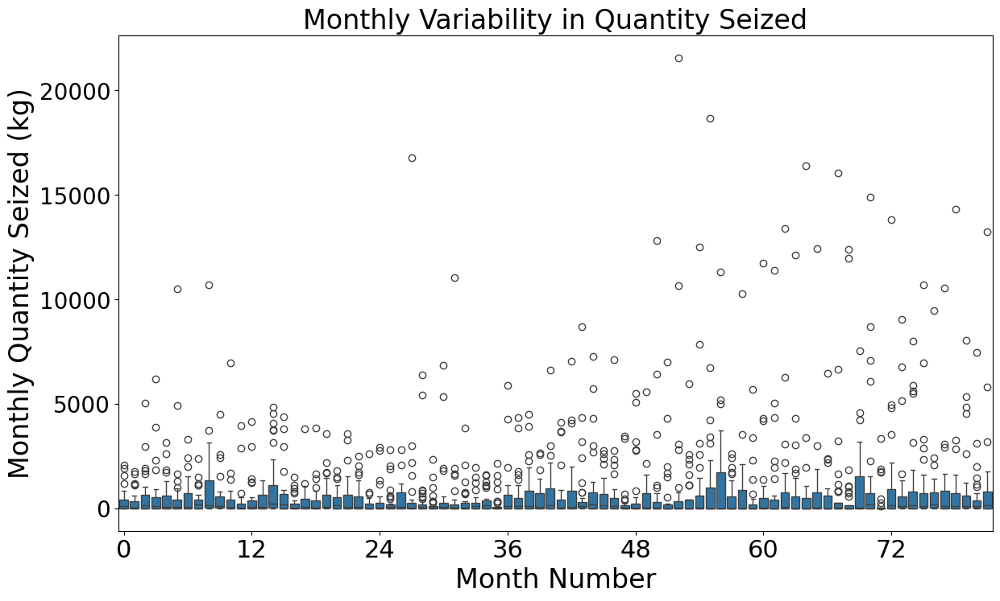

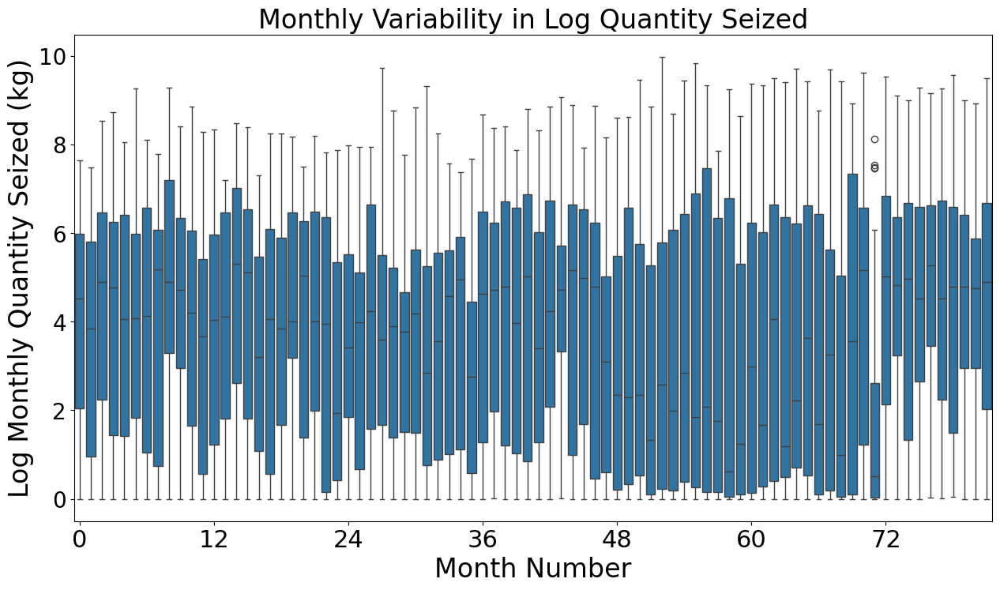

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Monthly variability before log transformation
plt.figure(figsize=(14, 8))
sns.boxplot(x='month_number', y='Monthly Quantity Seized (kg)', data=train)
plt.title("Monthly Variability in Quantity Seized", fontsize=24)
plt.xlabel("Month Number", fontsize=24)
plt.ylabel("Monthly Quantity Seized (kg)", fontsize=24)

# Set x-ticks to show only every 12th month
plt.xticks(ticks=range(0, max(train['month_number']) + 1, 12), fontsize=22)  # Show every 12th month
plt.yticks(fontsize=20)  # Larger y-tick labels

plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.grid(False)
plt.show()

# Monthly variability after log transformation
plt.figure(figsize=(15, 8))
sns.boxplot(x='month_number', y='Log Monthly Quantity Seized (kg)', data=train)
plt.title("Monthly Variability in Log Quantity Seized", fontsize=24)
plt.xlabel("Month Number", fontsize=24)
plt.ylabel("Log Monthly Quantity Seized (kg)", fontsize=24)

# Set x-ticks to show only every 12th month
plt.xticks(ticks=range(0, max(train['month_number']) + 1, 12), fontsize=22)  # Show every 12th month
plt.yticks(fontsize=20)  # Larger y-tick labels

plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.grid(False)
plt.show()


In [ ]:
final_train['Department'].unique()

array(['Amazonas', 'Antioquia', 'Arauca',
       'Archipiélago de San Andrés, Providencia y Santa Catalina',
       'Atlántico', 'Bogotá D.C.', 'Bolívar', 'Boyacá', 'Caldas',
       'Caquetá', 'Casanare', 'Cauca', 'Cesar', 'Chocó', 'Cundinamarca',
       'Córdoba', 'Guainía', 'Guaviare', 'Huila', 'La Guajira',
       'Magdalena', 'Meta', 'Nariño', 'Norte de Santander', 'Putumayo',
       'Quindío', 'Risaralda', 'Santander', 'Sucre', 'Tolima',
       'Valle del Cauca', 'Vaupés', 'Vichada'], dtype=object)

In [ ]:
final_train = final_train.replace('Archipiélago de San Andrés, Providencia y Santa Catalina', 'San Andrés...')
# 1. Monthly Trends
monthly_trends = final_train.groupby('month_number')['Monthly Quantity Seized (kg)'].sum()
plt.figure(figsize=(10, 6))
plt.plot(monthly_trends.index, monthly_trends.values, marker='o')
plt.title('Total Quantity Seized Across All Departments by Month')
plt.xlabel('Month Number')
plt.ylabel('Monthly Quantity Seized (kg)')
plt.grid()
plt.show()

# 2. Department Comparisons
department_comparison = final_train.groupby('Department')['Monthly Quantity Seized (kg)'].sum().sort_values(ascending=False)
plt.figure(figsize=(12, 8))
department_comparison.plot(kind='bar')
plt.title('Total Quantity Seized by Department', fontsize=24)
plt.xlabel('Department', fontsize=24)
plt.ylabel('Total Quantity Seized (kg)', fontsize=24)
plt.xticks(rotation=60, ha='right', fontsize=20)
plt.yticks(fontsize=18)
plt.tight_layout()
plt.show()

# 3. Log-Transformed Values Distribution
plt.figure(figsize=(10, 6))
final_train['Log Monthly Quantity Seized (kg)'].hist(bins=30, edgecolor='black')
plt.title('Distribution of Log Monthly Quantity Seized')
plt.xlabel('Log Monthly Quantity Seized (kg)')
plt.ylabel('Frequency')
plt.grid()
plt.show()

# 4. Seasonal Patterns by Department
departments = final_train['Department'].unique()
plt.figure(figsize=(24, 8))
for department in departments:
    department_data = final_train[final_train['Department'] == department].groupby('month_number')['Monthly Quantity Seized (kg)'].sum()
    plt.plot(department_data.index, department_data.values, label=department)

plt.title('Monthly Seizure Patterns by Department')
plt.xlabel('Month Number')
plt.ylabel('Monthly Quantity Seized (kg)')
plt.legend(loc='upper right', bbox_to_anchor=(1.3, 1))
plt.grid()
plt.tight_layout()
plt.show()

final_train = final_train.replace('San Andrés...', 'Archipiélago de San Andrés, Providencia y Santa Catalina')

KeyError: 'Column not found: Monthly Quantity Seized (kg)'

In [ ]:
zero_count = (final_train['Monthly Quantity Seized (kg)'] == 0).sum()
total_count = len(final_train)
print(f"Percentage of Zeros Monthly Quantity Seized: {zero_count / total_count * 100:.2f}%")


zero_count = (final_train['Log Monthly Quantity Seized (kg)'] == 0).sum()
total_count = len(final_train)
print(f"Percentage of Zeros Log Monthly Quantity Seized: {zero_count / total_count * 100:.2f}%")


print("Summary Statistics for Monthly Quantity Seized (kg):")
print(f"Max: {final_train['Monthly Quantity Seized (kg)'].max()}")
print(f"Min: {final_train['Monthly Quantity Seized (kg)'].min()}")
print(f"Mean: {final_train['Monthly Quantity Seized (kg)'].mean()}")
print(f"Std Dev: {final_train['Monthly Quantity Seized (kg)'].std()}")

print("Summary Statistics for Log Monthly Quantity Seized (kg):")
print(f"Max: {final_train['Log Monthly Quantity Seized (kg)'].max()}")
print(f"Min: {final_train['Log Monthly Quantity Seized (kg)'].min()}")
print(f"Mean: {final_train['Log Monthly Quantity Seized (kg)'].mean()}")
print(f"Std Dev: {final_train['Log Monthly Quantity Seized (kg)'].std()}")



Percentage of Zeros Monthly Quantity Seized: 9.66%
Percentage of Zeros Log Monthly Quantity Seized: 9.66%
Summary Statistics for Monthly Quantity Seized (kg):
Max: 21562.736
Min: 0.0
Mean: 652.8860293684509
Std Dev: 1622.8980889210286
Summary Statistics for Log Monthly Quantity Seized (kg):
Max: 9.97876829387002
Min: 0.0
Mean: 3.815122712737976
Std Dev: 2.8399481488476015


Summary Statistics for Adjusted Log Monthly Quantity Seized (kg):
Max: 9.978722382404289
Min: -4.605170185988091
Mean: 3.0183691559986383
Std Dev: 4.023509083697743
Percentage of Zeros Adjusted Log Quantity: 0.00%


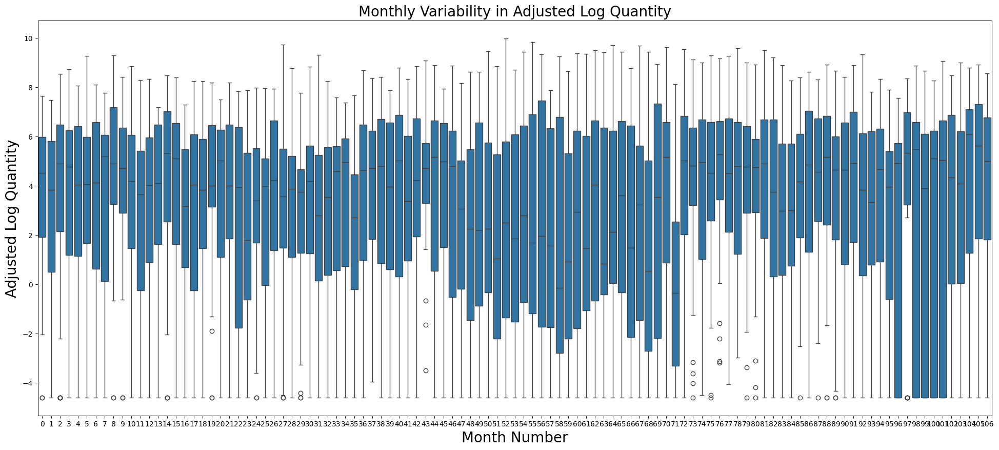

In [ ]:
#What if we tried a slightly different Log transformation? --> see section at end
final_train['Adjusted Log Quantity'] = np.log(final_train['Monthly Quantity Seized (kg)'] + 0.01)
test['Adjusted Log Quantity'] = np.log(test['Monthly Quantity Seized (kg)'] + 0.01)
print("Summary Statistics for Adjusted Log Monthly Quantity Seized (kg):")
print(f"Max: {final_train['Adjusted Log Quantity'].max()}")
print(f"Min: {final_train['Adjusted Log Quantity'].min()}")
print(f"Mean: {final_train['Adjusted Log Quantity'].mean()}")
print(f"Std Dev: {final_train['Adjusted Log Quantity'].std()}")

zero_count = (final_train['Adjusted Log Quantity'] == 0).sum()
total_count = len(final_train)
print(f"Percentage of Zeros Adjusted Log Quantity: {zero_count / total_count * 100:.2f}%")

plt.figure(figsize=(24, 10))
sns.boxplot(x='month_number', y='Adjusted Log Quantity', data=final_train)
plt.title("Monthly Variability in Adjusted Log Quantity", fontsize=20)
plt.xlabel("Month Number", fontsize=20)
plt.ylabel("Adjusted Log Quantity", fontsize=20)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.grid(False)
plt.show()

In [ ]:
final_train[socioeconomic_features].describe()

,Percent Population in Urban Areas,HDI,GDI,Mean International Wealth Index,Infant Deaths per 1000 Live Births,Mean Years Schooling,Log Gross National Income Per Capita in 1000 USD,Life Expectancy,Population Density_x,Number of Corruption Cases,...,Events of Sexual Crimes,Events of Forced Disappearances,Events of Displacement,Events of Homicide,Events of Personal Physical Injuries,Events of Personal Pyschological Injuries,Events of Mine Explosions,Events of Loss of Estate,Events of Kiddnapping,Events of Torture
count,3531.000000,3531.00000,3531.000000,3531.000000,3531.000000,3531.000000,3531.000000,3531.000000,3531.000000,3531.000000,...,3531.000000,3531.000000,3531.000000,3531.000000,3531.000000,3531.000000,3531.000000,3531.000000,3531.000000,3531.000000
mean,0.676404,0.73510,0.989576,78.131634,17.748035,7.620262,9.327550,75.780221,423.069659,2.276409,...,43.917304,22.209289,10096.304163,216.781648,24.389408,0.994902,14.185217,217.976494,12.412348,4.077882
std,0.191310,0.03616,0.018126,11.590108,10.985524,1.031015,0.342963,1.890070,1240.341976,3.321414,...,74.149974,55.309683,17661.869496,436.831141,40.681676,2.320613,32.907144,679.359047,30.834961,11.879370
min,0.144000,0.62800,0.914000,30.900000,1.420000,5.856000,8.118000,68.310000,0.492880,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.543000,0.71500,0.986000,73.500000,11.400000,6.863000,9.198000,75.230000,9.436140,0.000000,...,3.000000,0.000000,626.000000,10.000000,1.000000,0.000000,0.000000,8.000000,0.000000,0.000000
50%,0.717000,0.73900,0.993000,80.200000,14.600000,7.451000,9.395000,76.290000,13.403988,1.000000,...,10.000000,5.000000,1962.000000,48.000000,4.000000,0.000000,1.000000,27.000000,2.000000,1.000000
75%,0.788000,0.76100,1.000000,86.100000,19.000000,8.210000,9.581000,77.010000,73.745695,3.000000,...,54.000000,20.000000,11403.000000,216.000000,25.500000,1.000000,10.000000,142.000000,11.000000,3.000000
max,1.000000,0.81400,1.017000,96.000000,64.500000,10.840000,9.812000,79.020000,4689.130992,27.000000,...,436.000000,584.000000,128032.000000,3130.000000,214.000000,16.000000,280.000000,6186.000000,364.000000,156.000000


In [ ]:
final_train[cede_features].describe()

,Current income (millions pesos),Tax income (millions pesos),Transfers from national entities (millions of pesos),Current expensives linked to institutional performance,Operating Expenses,Area km2,Rural population,Urban population,Total population,Distance to Bogota,Population Density_y,Urban to Rural Population Ratio,Percent Urban Population,Percent Rural Population,Historical Attacks on Population By FARC (1993-2008),Historical Attacks on Population by ELN (1993-2008),Historical Attacks on Population by AUC (1993-2008),Historical Antinarcotics Operations (1993-2008),Historical Dismantling Labs (1993-2008),Total acts of terrorism,Total acts against police,Total subversive actions,Total acts of extorsion,Hectares of coca,Hectores of coca erdaicted manually,Presence of coca cultivation (dummy),Civilians hurt by mines,Civilians killed by mines,Public force members hurt by mines,Public force members killed by mines,Events of Abandoned property,Events of Acts of Terrorism,Events of Threats,Events of Confinement,Events of Sexual Crimes,Events of Forced Disappearances,Events of Displacement,Events of Homicide,Events of Personal Physical Injuries,Events of Personal Pyschological Injuries,Events of Mine Explosions,Events of Loss of Estate,Events of Kiddnapping,Events of Torture
count,3.300000e+03,3.300000e+03,3300.000000,3.300000e+03,3.300000e+03,3300.000000,3.300000e+03,3.300000e+03,3.300000e+03,3300.000000,3300.000000,3300.000000,3300.000000,3300.000000,3300.000000,3300.000000,3300.000000,3300.000000,3300.000000,3300.000000,3300.000000,3300.000000,3300.000000,3300.000000,3300.000000,3300.000000,3300.000000,3300.000000,3300.000000,3300.000000,3300.000000,3300.000000,3300.000000,3300.000000,3300.000000,3300.000000,3300.000000,3300.000000,3300.000000,3300.000000,3300.000000,3300.000000,3300.000000,3300.000000
mean,1.266455e+06,1.026472e+06,57809.600606,4.917975e+05,4.610547e+05,47766.575758,4.954887e+05,1.738372e+06,2.233861e+06,414.473264,277.046647,15.116348,0.647881,0.352119,201.212121,100.545455,66.939394,344.121212,198.575758,17.716061,0.446364,3.061818,259.741212,5831.355758,2186.417936,0.646970,3.858788,0.661818,4.577273,0.565758,5.515455,210.331818,1640.651515,627.500606,43.977273,18.554242,9884.755758,186.214545,23.958485,0.990303,12.496970,190.547576,10.154545,3.430000
std,3.208350e+06,2.751316e+06,61718.904976,1.100292e+06,1.029069e+06,41844.041616,4.863787e+05,2.956911e+06,3.082028e+06,249.601260,858.917024,71.424380,0.171428,0.171428,208.592296,158.234058,81.444945,349.875547,207.824078,35.644157,1.953654,7.904695,357.195920,14985.652785,6970.835435,0.477984,10.646774,2.007910,11.747718,1.866468,19.145462,794.806528,2491.895521,4089.581852,74.264455,44.146472,17539.098416,366.329567,40.305146,2.324122,28.612254,580.028593,24.531211,9.359688
min,5.672000e+03,2.859000e+03,0.000000,3.962000e+03,3.962000e+03,132.000000,3.236000e+04,2.418000e+04,6.691700e+04,0.000000,0.544554,0.315133,0.239620,0.002072,0.000000,0.000000,0.000000,14.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.352970e+05,8.555600e+04,10799.750000,7.064600e+04,6.813500e+04,22605.000000,9.166000e+04,2.583860e+05,3.564790e+05,235.047619,11.012693,1.030790,0.507581,0.238470,45.000000,2.000000,14.000000,127.000000,47.000000,0.000000,0.000000,0.000000,63.000000,0.000000,0.330000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,191.000000,0.000000,3.000000,0.000000,588.000000,8.000000,1.000000,0.000000,0.000000,7.000000,0.000000,0.000000
50%,3.119790e+05,2.439980e+05,39192.000000,1.567960e+05,1.488440e+05,41696.000000,2.870220e+05,7.398170e+05,1.079866e+06,373.875000,55.323580,2.095583,0.676959,0.323041,142.000000,20.000000,45.000000,194.000000,121.000000,3.000000,0.000000,0.000000,160.000000,38.000000,113.170000,1.000000,0.000000,0.000000,0.000000,0.000000

In [ ]:
# Display all rows
pd.set_option('display.max_rows', None)

# Display all columns
pd.set_option('display.max_columns', None)

# Expand display width for large DataFrames
pd.set_option('display.width', 1000)

# Display full contents of each column (no truncation)
pd.set_option('display.max_colwidth', None)

In [ ]:
v_features = ['Historical Attacks on Population By FARC (1993-2008)',
 'Historical Attacks on Population by ELN (1993-2008)',
 'Historical Attacks on Population by AUC (1993-2008)',
 'Historical Antinarcotics Operations (1993-2008)',
 'Historical Dismantling Labs (1993-2008)',
 'Total acts of terrorism',
 'Total acts against police',
 'Total subversive actions',
 'Total acts of extorsion',
 'Hectares of coca',
 'Hectores of coca erdaicted manually ',
 'Presence of coca cultivation (dummy)',
 'Civilians hurt by mines',
 'Civilians killed by mines',
 'Public force members hurt by mines',
 'Public force members killed by mines',
 'Events of Abandoned property',
 'Events of Acts of Terrorism',
 'Events of Threats',
 'Events of Confinement',
 'Events of Sexual Crimes',
 'Events of Forced Disappearances',
 'Events of Displacement',
 'Events of Homicide',
 'Events of Personal Physical Injuries',
 'Events of Personal Pyschological Injuries',
 'Events of Mine Explosions',
 'Events of Loss of Estate',
 'Events of Kiddnapping',
 'Events of Torture']




to_use = ['Mean International Wealth Index', 'Mean Years Schooling', 'Life Expectancy', 'Number of Corruption Cases','Gini Coefficient',
         'Rural population', 'Urban population',  'Current income (millions pesos)','Historical Attacks on Population By FARC (1993-2008)',
 'Historical Attacks on Population by ELN (1993-2008)',
 'Historical Attacks on Population by AUC (1993-2008)',
 'Historical Antinarcotics Operations (1993-2008)',
 'Historical Dismantling Labs (1993-2008)',  'Hectares of coca', 'Events of Threats', 'Events of Displacement',
 'Events of Confinement',
 'Events of Sexual Crimes',
 'Events of Forced Disappearances',
 'Events of Displacement',
 'Events of Homicide']

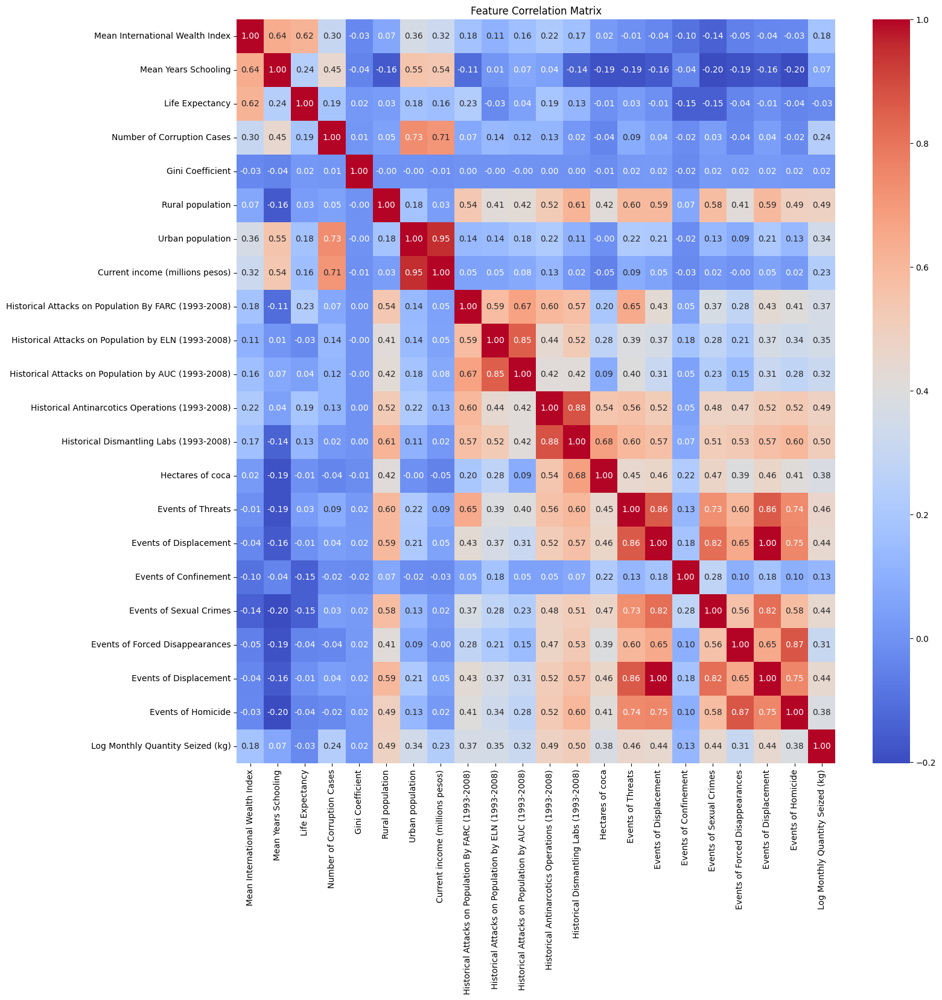

In [ ]:
getCorrMatrix(to_use + ['Log Monthly Quantity Seized (kg)'], final_train, 16, 16)

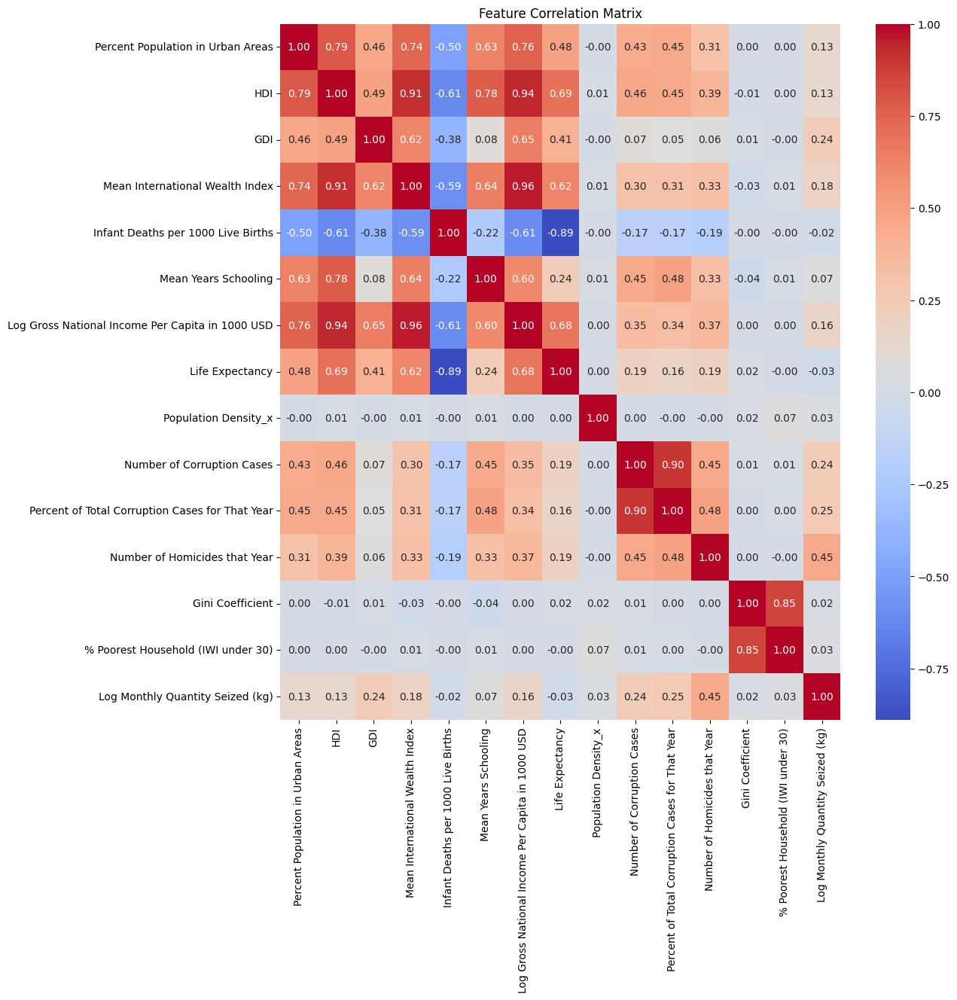

In [ ]:
getCorrMatrix(socioeconomic_features + ['Log Monthly Quantity Seized (kg)'], final_train, 12, 12)

###Lag feature engineering

In [ ]:
  #@CITATION: Code adapted from ChatGPT
#sort by department then year instead of year then department
combined = pd.concat([final_train, test])
combined_df = combined.sort_values(by=['Department', 'month_number'])
combined_df = combined.drop(columns=['Monthly Quantity Seized (kg)'])


#LAGS
combined_df['Lagged_Log_Monthly_Quantity_Seized_1'] = combined_df.groupby('Department')['Log Monthly Quantity Seized (kg)'].shift(1)
combined_df['Lagged_Log_Monthly_Quantity_Seized_2'] = combined_df.groupby('Department')['Log Monthly Quantity Seized (kg)'].shift(2)
combined_df['Lagged_Log_Monthly_Quantity_Seized_3'] = combined_df.groupby('Department')['Log Monthly Quantity Seized (kg)'].shift(3)
combined_df['Lagged_Log_Monthly_Quantity_Seized_4'] = combined_df.groupby('Department')['Log Monthly Quantity Seized (kg)'].shift(4)
combined_df['Lagged_Log_Monthly_Quantity_Seized_5'] = combined_df.groupby('Department')['Log Monthly Quantity Seized (kg)'].shift(5)
combined_df['Lagged_Log_Monthly_Quantity_Seized_6'] = combined_df.groupby('Department')['Log Monthly Quantity Seized (kg)'].shift(6)


#ROLLING AVERAGES
combined_df['Rolling_3M_Log_Monthly_Quantity'] = combined_df.groupby('Department')['Log Monthly Quantity Seized (kg)'].transform(lambda x: x.rolling(3, closed='left').mean())
combined_df['Rolling_6M_Log_Monthly_Quantity'] = combined_df.groupby('Department')['Log Monthly Quantity Seized (kg)'].transform(lambda x: x.rolling(6, closed='left').mean())


# ROLLING STD DEV
combined_df['Rolling_3M_Std_Log_Monthly_Quantity'] = combined_df.groupby('Department')['Log Monthly Quantity Seized (kg)'].transform(lambda x: x.rolling(3, closed='left').std())
combined_df['Rolling_6M_Std_Log_Monthly_Quantity'] = combined_df.groupby('Department')['Log Monthly Quantity Seized (kg)'].transform(lambda x: x.rolling(6, closed='left').std())

#ROLLING MIN
combined_df['Rolling_3M_Min_Log_Monthly_Quantity'] = combined_df.groupby('Department')['Log Monthly Quantity Seized (kg)'].transform(
    lambda x: x.rolling(3, closed='left').min())
combined_df['Rolling_6M_Min_Log_Monthly_Quantity'] = combined_df.groupby('Department')['Log Monthly Quantity Seized (kg)'].transform(
    lambda x: x.rolling(6, closed='left').min())

#ROLLING MAX
combined_df['Rolling_3M_Max_Log_Monthly_Quantity'] = combined_df.groupby('Department')['Log Monthly Quantity Seized (kg)'].transform(
    lambda x: x.rolling(3, closed='left').max())
combined_df['Rolling_6M_Max_Log_Monthly_Quantity'] = combined_df.groupby('Department')['Log Monthly Quantity Seized (kg)'].transform(
    lambda x: x.rolling(6, closed='left').max())
#ROLLING RANGE
combined_df['Rolling_3M_Range_Log_Monthly_Quantity'] = (
    combined_df['Rolling_3M_Max_Log_Monthly_Quantity'] - combined_df['Rolling_3M_Min_Log_Monthly_Quantity'])
combined_df['Rolling_6M_Range_Log_Monthly_Quantity'] = (
    combined_df['Rolling_6M_Max_Log_Monthly_Quantity'] - combined_df['Rolling_3M_Min_Log_Monthly_Quantity'])

#EMA
combined_df['EMA_3M_Log_Monthly_Quantity'] = (
    combined_df
    .groupby('Department')['Log Monthly Quantity Seized (kg)']
    .transform(lambda x: x.shift(1).ewm(span=3, adjust=False).mean())
)
combined_df['EMA_6M_Log_Monthly_Quantity'] = (
    combined_df
    .groupby('Department')['Log Monthly Quantity Seized (kg)']
    .transform(lambda x: x.shift(1).ewm(span=6, adjust=False).mean())
)


#MOMENTUM
combined_df['Momentum_3_6'] = (
    combined_df['Rolling_6M_Log_Monthly_Quantity'].shift(1) - combined_df['Rolling_3M_Log_Monthly_Quantity'].shift(1) )



#Cumulative sum per year
combined_df['Year'] = 2012 + (combined_df['month_number'] // 12)
combined_df['Cumulative_Log_Monthly_Quantity_Seized_Per_Year'] = (
    combined_df.groupby(['Department', 'Year'])['Log Monthly Quantity Seized (kg)']
    .cumsum()
    .shift(1)
)
combined_df.drop(columns=['Year'], inplace=True)

#Cumulative rolling sum




#season
combined_df['month'] = combined_df['month_number'] % 12
def get_season(month):
    if month in [11, 0, 1]:      # December, January, February
        return 'Winter'
    elif month in [2, 3, 4]:     # March, April, May
        return 'Spring'
    elif month in [5, 6, 7]:     # June, July, August
        return 'Summer'
    elif month in [8, 9, 10]:    # September, October, November
        return 'Fall'
combined_df['season'] = combined_df['month'].apply(get_season)
combined_df.drop(columns=['month'], inplace=True)
combined_df = pd.get_dummies(combined_df, columns=['season'], drop_first=True)
dept_columns = [col for col in combined_df.columns if col.startswith('season_')]
for col in dept_columns:
  combined_df[col] = combined_df[col].apply(lambda x: 1 if x == True else 0)




# drop Nan
combined_lagged = combined_df.dropna(subset=['Lagged_Log_Monthly_Quantity_Seized_1',
       'Lagged_Log_Monthly_Quantity_Seized_2',
       'Lagged_Log_Monthly_Quantity_Seized_3',
       'Lagged_Log_Monthly_Quantity_Seized_4',
       'Lagged_Log_Monthly_Quantity_Seized_5',
       'Lagged_Log_Monthly_Quantity_Seized_6',
       'Rolling_3M_Log_Monthly_Quantity','Rolling_6M_Log_Monthly_Quantity',
       'Rolling_3M_Std_Log_Monthly_Quantity', 'Rolling_6M_Std_Log_Monthly_Quantity',
       'Rolling_3M_Min_Log_Monthly_Quantity', 'Rolling_6M_Min_Log_Monthly_Quantity',
       'Rolling_3M_Max_Log_Monthly_Quantity', 'Rolling_6M_Max_Log_Monthly_Quantity',
       'Rolling_3M_Range_Log_Monthly_Quantity', 'Rolling_6M_Range_Log_Monthly_Quantity',
        'EMA_3M_Log_Monthly_Quantity', 'EMA_6M_Log_Monthly_Quantity',
       'Momentum_3_6',
       'Cumulative_Log_Monthly_Quantity_Seized_Per_Year',
        'season_Spring', 'season_Summer','season_Winter'
        ]).reset_index(drop=True)


#Growth rates
combined_lagged['Lagged_Log_Monthly_Quantity_Seized_1'] = combined_lagged['Lagged_Log_Monthly_Quantity_Seized_1'].replace(0, 1e-10)
combined_lagged['Lagged_Log_Monthly_Quantity_Seized_2'] = combined_lagged['Lagged_Log_Monthly_Quantity_Seized_2'].replace(0, 1e-10)
combined_lagged['Lagged_Log_Monthly_Quantity_Seized_3'] = combined_lagged['Lagged_Log_Monthly_Quantity_Seized_3'].replace(0, 1e-10)
combined_lagged['Lagged_Log_Monthly_Quantity_Seized_4'] = combined_lagged['Lagged_Log_Monthly_Quantity_Seized_4'].replace(0, 1e-10)
combined_lagged['Lagged_Log_Monthly_Quantity_Seized_5'] = combined_lagged['Lagged_Log_Monthly_Quantity_Seized_5'].replace(0, 1e-10)
combined_lagged['Lagged_Log_Monthly_Quantity_Seized_6'] = combined_lagged['Lagged_Log_Monthly_Quantity_Seized_6'].replace(0, 1e-10)

combined_lagged['Growth_Rate_Lag_1_2'] = (
    combined_lagged['Lagged_Log_Monthly_Quantity_Seized_1'] - combined_lagged['Lagged_Log_Monthly_Quantity_Seized_2']
) / combined_lagged['Lagged_Log_Monthly_Quantity_Seized_2']

combined_lagged['Lagged_Log_Monthly_Quantity_Seized_3'] = combined_lagged['Lagged_Log_Monthly_Quantity_Seized_3'].replace(0, 1e-10)
combined_lagged['Growth_Rate_Lag_2_3'] = (
    combined_lagged['Lagged_Log_Monthly_Quantity_Seized_2'] - combined_lagged['Lagged_Log_Monthly_Quantity_Seized_3']
) / combined_lagged['Lagged_Log_Monthly_Quantity_Seized_3']
combined_lagged['Growth_Rate_Lag_1_3'] = (
    combined_lagged['Lagged_Log_Monthly_Quantity_Seized_1'] - combined_lagged['Lagged_Log_Monthly_Quantity_Seized_3']
) / combined_lagged['Lagged_Log_Monthly_Quantity_Seized_3']




#one hot encode departments
combined_lagged_encoded = pd.get_dummies(combined_lagged, columns=['Department'], drop_first = True) # not drop firsting!
dept_columns = [col for col in combined_lagged_encoded.columns if col.startswith('Department_')]
for col in dept_columns:
  combined_lagged_encoded[col] = combined_lagged_encoded[col].apply(lambda x: 1 if x == True else 0)


combined_lagged_encoded.head()

#split train val test (60, 20, 20)
train = combined_lagged_encoded[combined_lagged_encoded['month_number'] < 82]
val = combined_lagged_encoded[(combined_lagged_encoded['month_number'] >= 82) & (combined_lagged_encoded['month_number'] < 107)]
test = combined_lagged_encoded[combined_lagged_encoded['month_number'] >= 107].reset_index(drop=True)
final_train = pd.concat([train, val], axis=0).reset_index(drop=True)
train.head()



,month_number,Log Monthly Quantity Seized (kg),Percent Population in Urban Areas,HDI,GDI,Mean International Wealth Index,Infant Deaths per 1000 Live Births,Mean Years Schooling,Log Gross National Income Per Capita in 1000 USD,Life Expectancy,...,Department_Norte de Santander,Department_Putumayo,Department_Quindío,Department_Risaralda,Department_Santander,Department_Sucre,Department_Tolima,Department_Valle del Cauca,Department_Vaupés,Department_Vichada
0,7,2.484907,0.376,0.676,0.95,58.3,24.4,7.017,8.734,73.49,...,0,0,0,0,0,0,0,0,0,0
1,8,1.181727,0.376,0.676,0.95,58.3,24.4,7.017,8.734,73.49,...,0,0,0,0,0,0,0,0,0,0
2,9,0.000000,0.376,0.676,0.95,58.3,24.4,7.017,8.734,73.49,...,0,0,0,0,0,0,0,0,0,0
3,10,0.000000,0.376,0.676,0.95,58.3,24.4,7.017,8.734,73.49,...,0,0,0,0,0,0,0,0,0,0
4,11,0.000000,0.376,0.676,0.95,58.3,24.4,7.017,8.734,73.49,...,0,0,0,0,0,0,0,0,0,0


###JUSTIFYING STANDARDIZATION

In [ ]:
#GDL, DANE AND HOMICIDE DATA
  #@CITATION: Code adapted from ChatGPT
sns.set(style='whitegrid')

# Create histograms for each feature
socioeconomic_features = ['Percent Population in Urban Areas', 'HDI', 'GDI', 'Mean International Wealth Index',
 'Infant Deaths per 1000 Live Births', 'Mean Years Schooling', 'Log Gross National Income Per Capita in 1000 USD',
 'Life Expectancy', 'Population Density_x', 'Number of Corruption Cases', 'Percent of Total Corruption Cases for That Year',
 'Number of Homicides that Year', 'Gini Coefficient', '% Poorest Household (IWI under 30)']
cede_features = ['Current income (millions pesos)', 'Tax income (millions pesos)', 'Transfers from national entities (millions of pesos)', 'Current expensives linked to institutional performance', 'Operating Expenses', 'Area km2', 'Rural population', 'Urban population', 'Total population', 'Distance to Bogota', 'Population Density_y', 'Urban to Rural Population Ratio', 'Percent Urban Population', 'Percent Rural Population', 'Historical Attacks on Population By FARC (1993-2008)', 'Historical Attacks on Population by ELN (1993-2008)', 'Historical Attacks on Population by AUC (1993-2008)', 'Historical Antinarcotics Operations (1993-2008)', 'Historical Dismantling Labs (1993-2008)', 'Total acts of terrorism', 'Total acts against police', 'Total subversive actions', 'Total acts of extorsion', 'Hectares of coca', 'Hectores of coca erdaicted manually ', 'Presence of coca cultivation (dummy)', 'Civilians hurt by mines', 'Civilians killed by mines', 'Public force members hurt by mines', 'Public force members killed by mines', 'Events of Abandoned property', 'Events of Acts of Terrorism', 'Events of Threats', 'Events of Confinement', 'Events of Sexual Crimes', 'Events of Forced Disappearances', 'Events of Displacement', 'Events of Homicide', 'Events of Personal Physical Injuries', 'Events of Personal Pyschological Injuries', 'Events of Mine Explosions', 'Events of Loss of Estate', 'Events of Kiddnapping', 'Events of Torture']
lag_features = ['Lagged_Log_Monthly_Quantity_Seized_1', 'Lagged_Log_Monthly_Quantity_Seized_2', 'Lagged_Log_Monthly_Quantity_Seized_3', 'Lagged_Log_Monthly_Quantity_Seized_4', 'Lagged_Log_Monthly_Quantity_Seized_5', 'Lagged_Log_Monthly_Quantity_Seized_6', 'Rolling_3M_Log_Monthly_Quantity', 'Rolling_6M_Log_Monthly_Quantity', 'Rolling_3M_Std_Log_Monthly_Quantity', 'Rolling_6M_Std_Log_Monthly_Quantity', 'Rolling_3M_Min_Log_Monthly_Quantity', 'Rolling_6M_Min_Log_Monthly_Quantity', 'Rolling_3M_Max_Log_Monthly_Quantity', 'Rolling_6M_Max_Log_Monthly_Quantity', 'Rolling_3M_Range_Log_Monthly_Quantity', 'Rolling_6M_Range_Log_Monthly_Quantity', 'EMA_3M_Log_Monthly_Quantity', 'EMA_6M_Log_Monthly_Quantity', 'Momentum_3_6', 'Cumulative_Log_Monthly_Quantity_Seized_Per_Year', 'season_Spring', 'season_Summer', 'season_Winter', 'Growth_Rate_Lag_1_2', 'Growth_Rate_Lag_2_3', 'Growth_Rate_Lag_1_3']



# Plot socioeconomic features
plt.figure(figsize=(15, 25))  # Adjust figure size
rows = (len(socioeconomic_features) // 3) + 1  # Calculate rows dynamically
for i, feature in enumerate(socioeconomic_features, 1):
    plt.subplot(rows, 3, i)  # Dynamically handle grid size
    sns.histplot(final_train[feature], bins=30, kde=True, color='blue')
    plt.title(f'Distribution of {feature}')
    plt.xlabel(feature)
    plt.ylabel('Frequency')
plt.tight_layout()
plt.show()



# Plot CEDE features
plt.figure(figsize=(25, 40))  # Adjust figure size
rows = (len(cede_features) // 3) + 1  # Calculate rows dynamically
for i, feature in enumerate(cede_features, 1):
    plt.subplot(rows, 3, i)
    sns.histplot(final_train[feature], bins=30, kde=True, color='blue')
    plt.title(f'Distribution of {feature}')
    plt.xlabel(feature)
    plt.ylabel('Frequency')
plt.tight_layout()
plt.show()

# Plot lag features
plt.figure(figsize=(25, 40))  # Adjust figure size
rows = (len(lag_features) // 3) + 1  # Calculate rows dynamically
for i, feature in enumerate(lag_features, 1):
    plt.subplot(rows, 3, i)
    sns.histplot(final_train[feature], bins=30, kde=True, color='blue')
    plt.title(f'Distribution of {feature}')
    plt.xlabel(feature)
    plt.ylabel('Frequency')
plt.tight_layout()
plt.show()

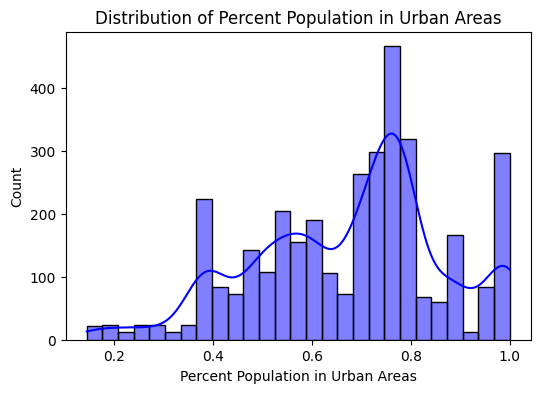

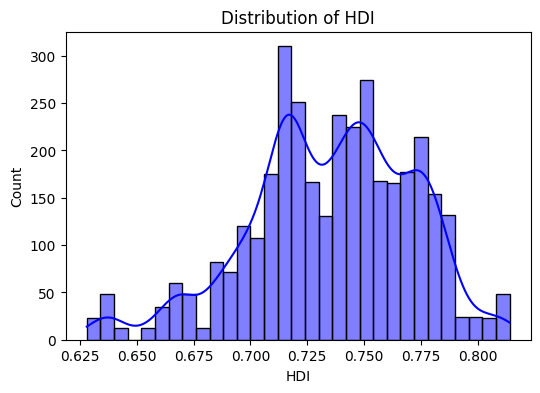

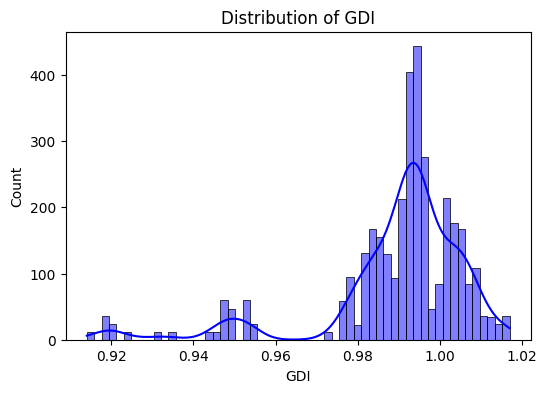

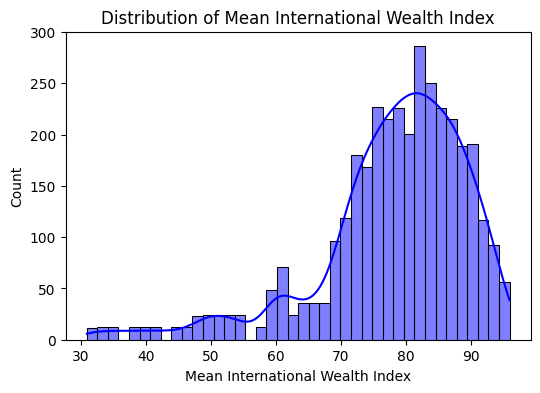

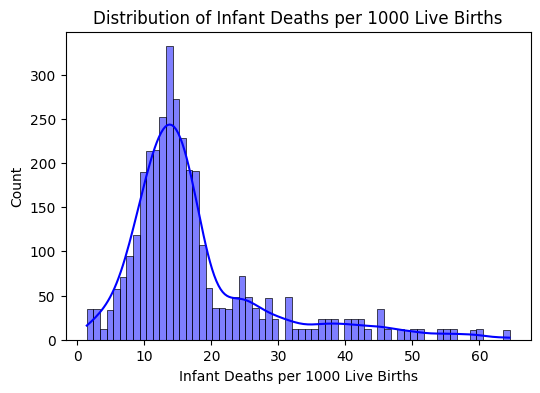

...

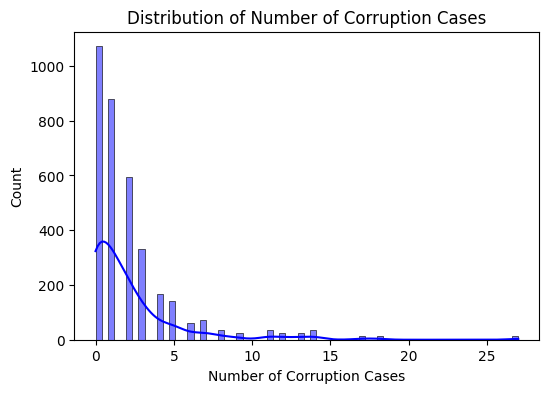

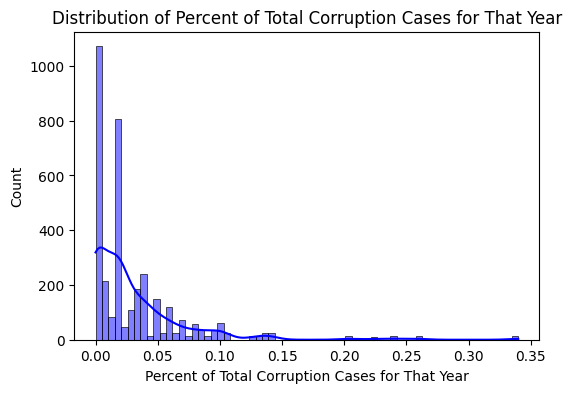

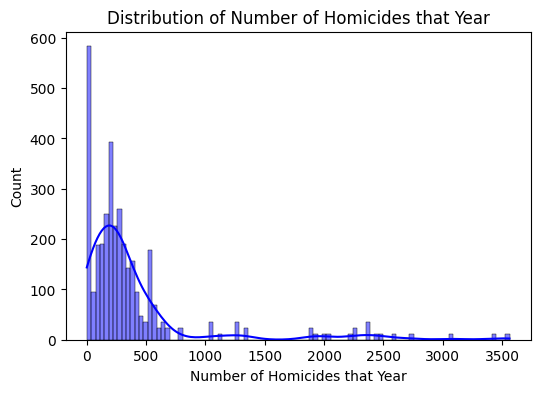

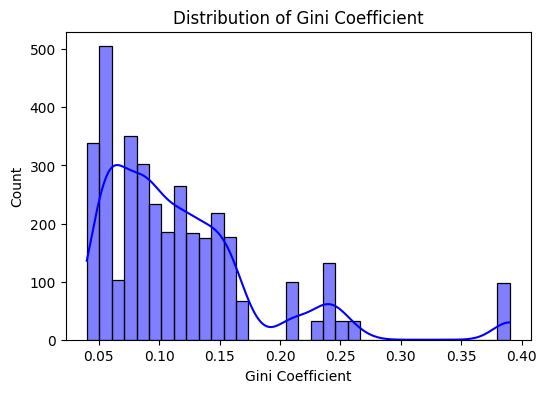

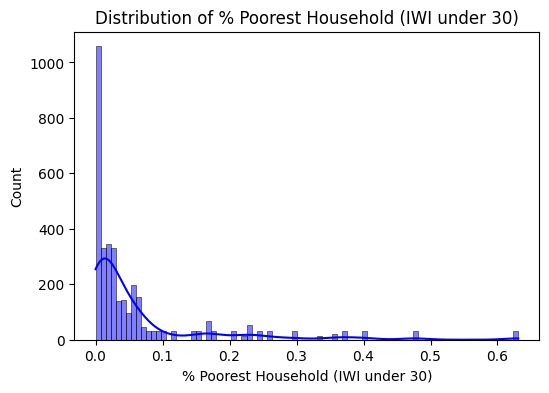

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
socioeconomic_features = ['Percent Population in Urban Areas', 'HDI', 'GDI', 'Mean International Wealth Index',
 'Infant Deaths per 1000 Live Births', 'Mean Years Schooling', 'Log Gross National Income Per Capita in 1000 USD',
 'Life Expectancy', 'Population Density_x', 'Number of Corruption Cases', 'Percent of Total Corruption Cases for That Year',
 'Number of Homicides that Year', 'Gini Coefficient', '% Poorest Household (IWI under 30)']
cede_features = ['Current income (millions pesos)', 'Tax income (millions pesos)', 'Transfers from national entities (millions of pesos)', 'Current expensives linked to institutional performance', 'Operating Expenses', 'Area km2', 'Rural population', 'Urban population', 'Total population', 'Distance to Bogota', 'Population Density_y', 'Urban to Rural Population Ratio', 'Percent Urban Population', 'Percent Rural Population', 'Historical Attacks on Population By FARC (1993-2008)', 'Historical Attacks on Population by ELN (1993-2008)', 'Historical Attacks on Population by AUC (1993-2008)', 'Historical Antinarcotics Operations (1993-2008)', 'Historical Dismantling Labs (1993-2008)', 'Total acts of terrorism', 'Total acts against police', 'Total subversive actions', 'Total acts of extorsion', 'Hectares of coca', 'Hectores of coca erdaicted manually ', 'Presence of coca cultivation (dummy)', 'Civilians hurt by mines', 'Civilians killed by mines', 'Public force members hurt by mines', 'Public force members killed by mines', 'Events of Abandoned property', 'Events of Acts of Terrorism', 'Events of Threats', 'Events of Confinement', 'Events of Sexual Crimes', 'Events of Forced Disappearances', 'Events of Displacement', 'Events of Homicide', 'Events of Personal Physical Injuries', 'Events of Personal Pyschological Injuries', 'Events of Mine Explosions', 'Events of Loss of Estate', 'Events of Kiddnapping', 'Events of Torture']
lag_features = ['Lagged_Log_Monthly_Quantity_Seized_1', 'Lagged_Log_Monthly_Quantity_Seized_2', 'Lagged_Log_Monthly_Quantity_Seized_3', 'Lagged_Log_Monthly_Quantity_Seized_4', 'Lagged_Log_Monthly_Quantity_Seized_5', 'Lagged_Log_Monthly_Quantity_Seized_6', 'Rolling_3M_Log_Monthly_Quantity', 'Rolling_6M_Log_Monthly_Quantity', 'Rolling_3M_Std_Log_Monthly_Quantity', 'Rolling_6M_Std_Log_Monthly_Quantity', 'Rolling_3M_Min_Log_Monthly_Quantity', 'Rolling_6M_Min_Log_Monthly_Quantity', 'Rolling_3M_Max_Log_Monthly_Quantity', 'Rolling_6M_Max_Log_Monthly_Quantity', 'Rolling_3M_Range_Log_Monthly_Quantity', 'Rolling_6M_Range_Log_Monthly_Quantity', 'EMA_3M_Log_Monthly_Quantity', 'EMA_6M_Log_Monthly_Quantity', 'Momentum_3_6', 'Cumulative_Log_Monthly_Quantity_Seized_Per_Year', 'season_Spring', 'season_Summer', 'season_Winter', 'Growth_Rate_Lag_1_2', 'Growth_Rate_Lag_2_3', 'Growth_Rate_Lag_1_3']

  #@CITATION: Code adapted from ChatGPT
for col in socioeconomic_features:
    plt.figure(figsize=(6, 4))
    sns.histplot(final_train[col], kde=True, color='blue')
    plt.title(f'Distribution of {col}')
    plt.show()
for col in cede_features:
    plt.figure(figsize=(6, 4))
    sns.histplot(final_train[col], kde=True, color='blue')
    plt.title(f'Distribution of {col}')
    plt.show()
for col in lag_features:
    plt.figure(figsize=(6, 4))
    sns.histplot(final_train[col], kde=True, color='blue')
    plt.title(f'Distribution of {col}')
    plt.show()


In [ ]:
print(final_train.skew())
print(final_train.kurtosis())

month_number                         0.000000
Log Monthly Quantity Seized (kg)     0.033262
Percent Population in Urban Areas   -0.353127
HDI                                 -0.482614
GDI                                 -2.027737
                                       ...   
Department_Sucre                     5.482570
Department_Tolima                    5.482570
Department_Valle del Cauca           5.482570
Department_Vaupés                    5.482570
Department_Vichada                   5.482570
Length: 120, dtype: float64
month_number                         -1.200240
Log Monthly Quantity Seized (kg)     -1.355941
Percent Population in Urban Areas    -0.350165
HDI                                   0.157212
GDI                                   4.744898
                                       ...    
Department_Sucre                     28.075588
Department_Tolima                    28.075588
Department_Valle del Cauca           28.075588
Department_Vaupés                    28.075

###Normalize features

In [ ]:
deptfeatures = ['Log Monthly Quantity Seized (kg)', 'month_number',
                             'Border_Department',
       'Ocean_department', 'Department_Antioquia', 'Department_Arauca',
       'Department_Archipiélago de San Andrés, Providencia y Santa Catalina',
       'Department_Atlántico', 'Department_Bogotá D.C.', 'Department_Bolívar',
       'Department_Boyacá', 'Department_Caldas', 'Department_Caquetá',
       'Department_Casanare', 'Department_Cauca', 'Department_Cesar',
       'Department_Chocó', 'Department_Cundinamarca', 'Department_Córdoba',
       'Department_Guainía', 'Department_Guaviare', 'Department_Huila',
       'Department_La Guajira', 'Department_Magdalena', 'Department_Meta',
       'Department_Nariño', 'Department_Norte de Santander',
       'Department_Putumayo', 'Department_Quindío', 'Department_Risaralda',
       'Department_Santander', 'Department_Sucre', 'Department_Tolima',
       'Department_Valle del Cauca', 'Department_Vaupés',
       'Department_Vichada']
socioeconomic_features = ['Percent Population in Urban Areas', 'HDI', 'GDI', 'Mean International Wealth Index',
 'Infant Deaths per 1000 Live Births', 'Mean Years Schooling', 'Log Gross National Income Per Capita in 1000 USD',
 'Life Expectancy', 'Population Density_x', 'Number of Corruption Cases', 'Percent of Total Corruption Cases for That Year',
 'Number of Homicides that Year', 'Gini Coefficient', '% Poorest Household (IWI under 30)']
cede_features = ['Current income (millions pesos)', 'Tax income (millions pesos)', 'Transfers from national entities (millions of pesos)', 'Current expensives linked to institutional performance', 'Operating Expenses', 'Area km2', 'Rural population', 'Urban population', 'Total population', 'Distance to Bogota', 'Population Density_y', 'Urban to Rural Population Ratio', 'Percent Urban Population', 'Percent Rural Population', 'Historical Attacks on Population By FARC (1993-2008)', 'Historical Attacks on Population by ELN (1993-2008)', 'Historical Attacks on Population by AUC (1993-2008)', 'Historical Antinarcotics Operations (1993-2008)', 'Historical Dismantling Labs (1993-2008)', 'Total acts of terrorism', 'Total acts against police', 'Total subversive actions', 'Total acts of extorsion', 'Hectares of coca', 'Hectores of coca erdaicted manually ', 'Presence of coca cultivation (dummy)', 'Civilians hurt by mines', 'Civilians killed by mines', 'Public force members hurt by mines', 'Public force members killed by mines', 'Events of Abandoned property', 'Events of Acts of Terrorism', 'Events of Threats', 'Events of Confinement', 'Events of Sexual Crimes', 'Events of Forced Disappearances', 'Events of Displacement', 'Events of Homicide', 'Events of Personal Physical Injuries', 'Events of Personal Pyschological Injuries', 'Events of Mine Explosions', 'Events of Loss of Estate', 'Events of Kiddnapping', 'Events of Torture']
lag_features = ['Lagged_Log_Monthly_Quantity_Seized_1', 'Lagged_Log_Monthly_Quantity_Seized_2', 'Lagged_Log_Monthly_Quantity_Seized_3', 'Lagged_Log_Monthly_Quantity_Seized_4', 'Lagged_Log_Monthly_Quantity_Seized_5', 'Lagged_Log_Monthly_Quantity_Seized_6', 'Rolling_3M_Log_Monthly_Quantity', 'Rolling_6M_Log_Monthly_Quantity', 'Rolling_3M_Std_Log_Monthly_Quantity', 'Rolling_6M_Std_Log_Monthly_Quantity', 'Rolling_3M_Min_Log_Monthly_Quantity', 'Rolling_6M_Min_Log_Monthly_Quantity', 'Rolling_3M_Max_Log_Monthly_Quantity', 'Rolling_6M_Max_Log_Monthly_Quantity', 'Rolling_3M_Range_Log_Monthly_Quantity', 'Rolling_6M_Range_Log_Monthly_Quantity', 'EMA_3M_Log_Monthly_Quantity', 'EMA_6M_Log_Monthly_Quantity', 'Momentum_3_6', 'Cumulative_Log_Monthly_Quantity_Seized_Per_Year', 'season_Spring', 'season_Summer', 'season_Winter', 'Growth_Rate_Lag_1_2', 'Growth_Rate_Lag_2_3', 'Growth_Rate_Lag_1_3']


columns = socioeconomic_features + cede_features + lag_features

from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

X_train = final_train[columns]
X_test = test[columns]



scaler.fit(X_train)

X_train_standardized = scaler.transform(X_train)
X_test_standardized = scaler.transform(X_test)



X_train_standardized= pd.DataFrame(X_train_standardized, columns=columns)
X_test_standardized= pd.DataFrame(X_test_standardized, columns=columns)


final_train2 = pd.concat(
    [final_train[deptfeatures], X_train_standardized], axis=1)
final_train = final_train2
train = final_train[final_train['month_number'] < 82]
val = final_train[(final_train['month_number'] >= 82) & (final_train['month_number'] < 107)]


test = pd.concat(
    [test[deptfeatures], X_test_standardized], axis=1)

LINEAR REGRESSION
Training MSE: 4.335208426883967
Testing Mean Squared Error (MSE): 5.555499325866419
Testing Root Mean Squared Error (RMSE): 2.3570106758066283
R-squared (R²): 0.31997645998434243


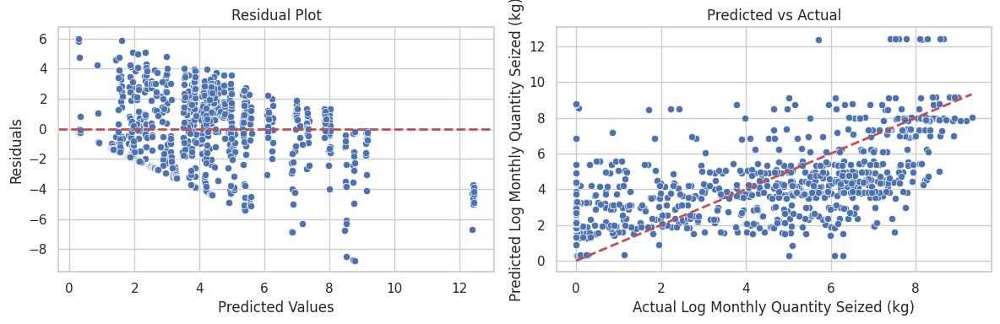

In [ ]:
linRegBaseline_selected_features = ['month_number', 'Log Monthly Quantity Seized (kg)', 'Urban population', 'Current income (millions pesos)', 'Historical Dismantling Labs (1993-2008)',  'Rural population',  'Life Expectancy', 'GDI', 'Events of Confinement',  'Number of Homicides that Year','Events of Threats','Total acts of extorsion']
linRegBaseline_selected_features = linRegBaseline_selected_features
linRegBaseline_train = train[linRegBaseline_selected_features]
linRegBaseline_val = val[linRegBaseline_selected_features]
linRegBaseline_test = test[linRegBaseline_selected_features]
linRegBaseline_final_train = final_train[linRegBaseline_selected_features]
linRegBaseline(linRegBaseline_train, linRegBaseline_val)

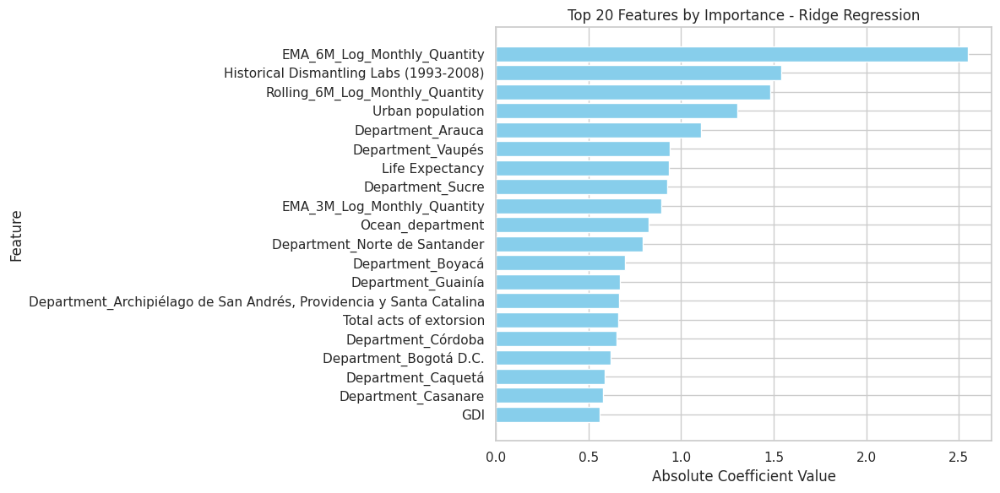

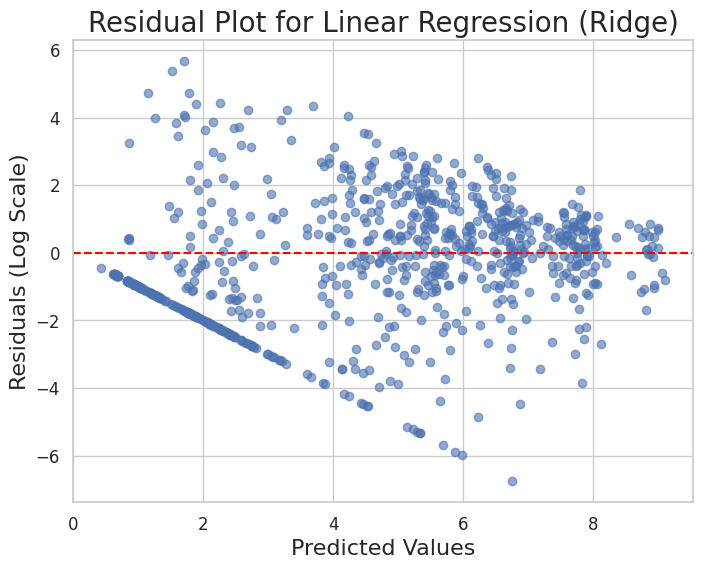

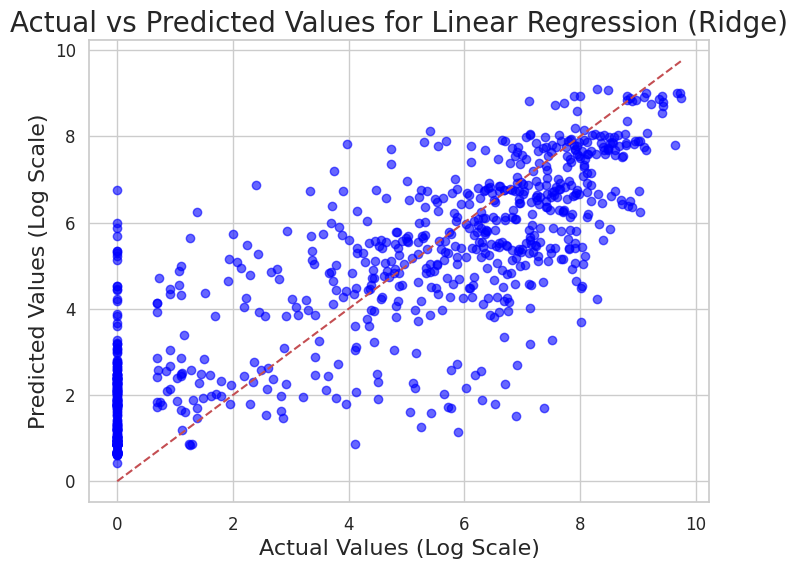

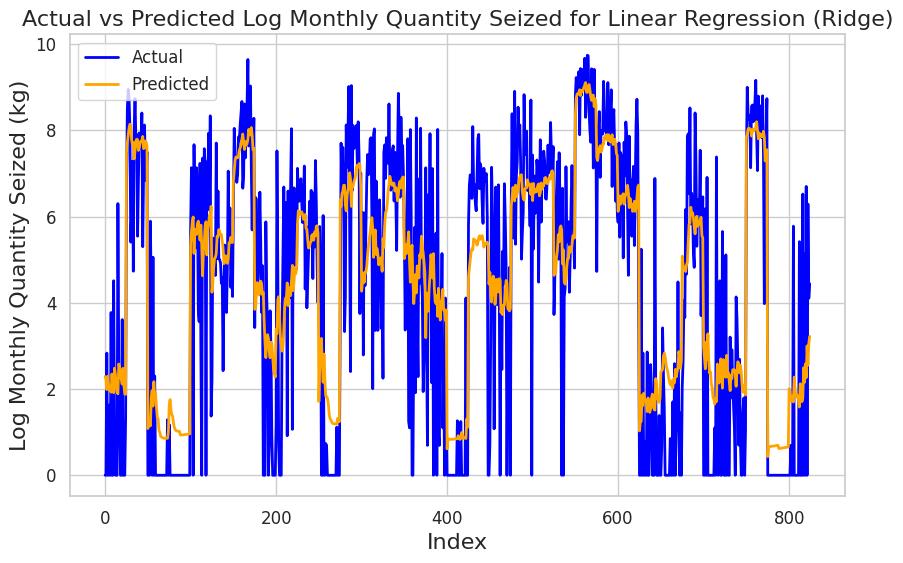

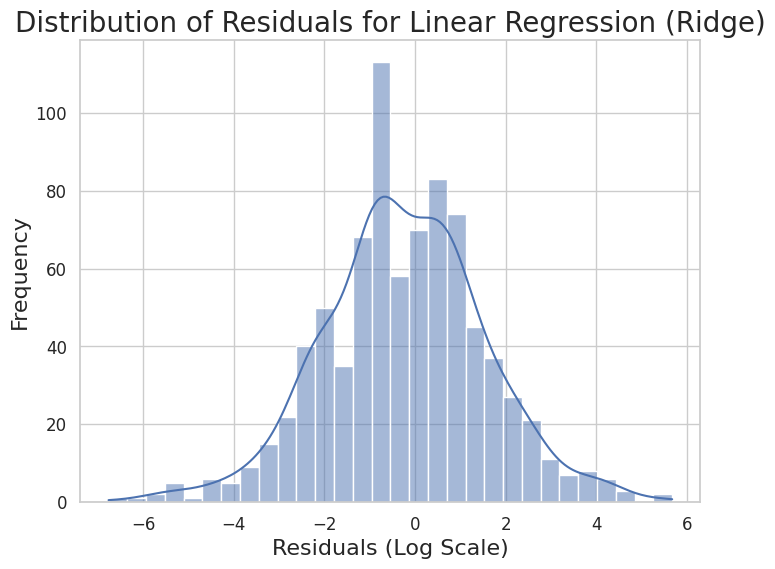

Ridge Regression
Testing MSE: 3.2866200426845316
R-squared (R²): 0.682741305319962


In [ ]:
selected_lag_features = ['EMA_3M_Log_Monthly_Quantity',
 'EMA_6M_Log_Monthly_Quantity','Rolling_6M_Log_Monthly_Quantity', 'Rolling_3M_Min_Log_Monthly_Quantity',
 'Rolling_3M_Max_Log_Monthly_Quantity']
deptfeatures = ['Border_Department',
 'Ocean_department',
 'Department_Antioquia',
 'Department_Arauca',
 'Department_Archipiélago de San Andrés, Providencia y Santa Catalina',
 'Department_Atlántico',
 'Department_Bogotá D.C.',
 'Department_Bolívar',
 'Department_Boyacá',
 'Department_Caldas',
 'Department_Caquetá',
 'Department_Casanare',
 'Department_Cauca',
 'Department_Cesar',
 'Department_Chocó',
 'Department_Cundinamarca',
 'Department_Córdoba',
 'Department_Guainía',
 'Department_Guaviare',
 'Department_Huila',
 'Department_La Guajira',
 'Department_Magdalena',
 'Department_Meta',
 'Department_Nariño',
 'Department_Norte de Santander',
 'Department_Putumayo',
 'Department_Quindío',
 'Department_Risaralda',
 'Department_Santander',
 'Department_Sucre',
 'Department_Tolima',
 'Department_Valle del Cauca',
 'Department_Vaupés',
 'Department_Vichada']
linReg_selected_features = ['month_number', 'Log Monthly Quantity Seized (kg)', 'Urban population', 'Current income (millions pesos)', 'Historical Dismantling Labs (1993-2008)',  'Rural population',
                            'Life Expectancy', 'GDI', 'Events of Confinement',  'Number of Homicides that Year','Events of Threats','Total acts of extorsion'] + selected_lag_features + deptfeatures
linReg_train = train[linReg_selected_features]
linReg_val = val[linReg_selected_features]
linReg_test = test[linReg_selected_features]
linReg_final_train = final_train[linReg_selected_features]
linReg_withRidge_Final(linReg_final_train, linReg_test)

RANDOM FOREST: 
Training Mean Squared Error (MSE): 2.7266044095428517
Testing Mean Squared Error (MSE): 3.353128854662315
R-squared: 0.6763211841624348


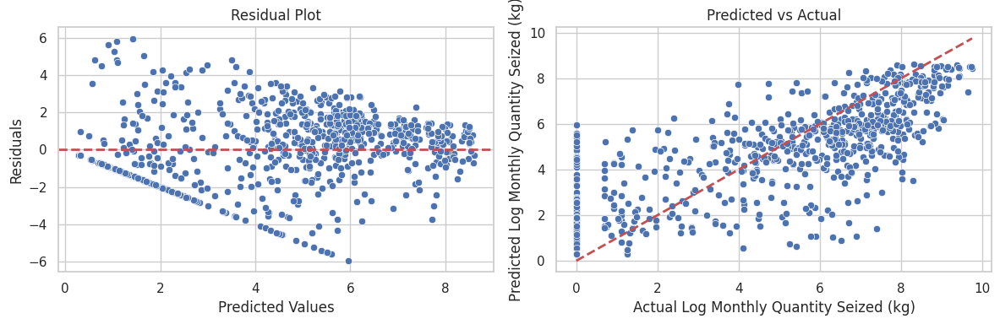

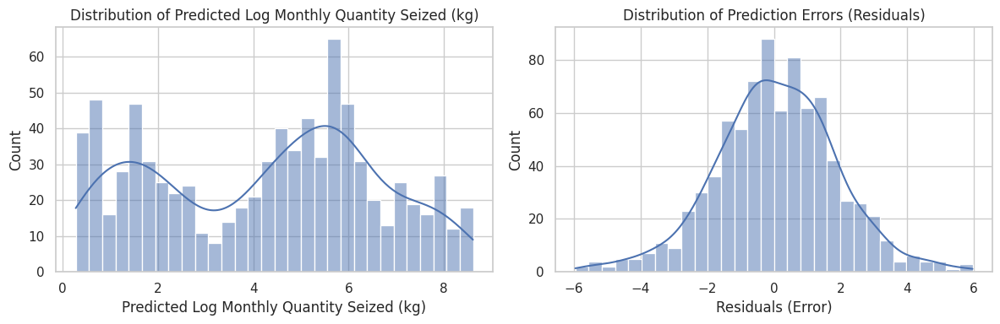

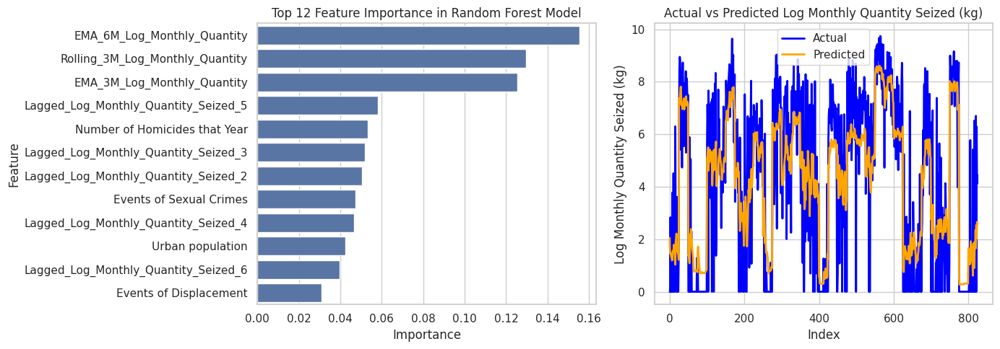

In [ ]:
soc_selected_features = [  'Historical Attacks on Population by ELN (1993-2008)',     'Total acts of extorsion',  'Hectares of coca',  'Number of Homicides that Year', 'Urban population', 'Events of Sexual Crimes', 'Events of Displacement']
selected_lag = ['Lagged_Log_Monthly_Quantity_Seized_2',
       'Lagged_Log_Monthly_Quantity_Seized_3',
       'Lagged_Log_Monthly_Quantity_Seized_4',
       'Lagged_Log_Monthly_Quantity_Seized_5', 'EMA_3M_Log_Monthly_Quantity', 'EMA_6M_Log_Monthly_Quantity',
       'Rolling_3M_Std_Log_Monthly_Quantity',
       'Rolling_6M_Std_Log_Monthly_Quantity',
       'Lagged_Log_Monthly_Quantity_Seized_6',
       'Rolling_3M_Log_Monthly_Quantity',
       'Rolling_3M_Std_Log_Monthly_Quantity',
       'Rolling_6M_Std_Log_Monthly_Quantity',
       'Cumulative_Log_Monthly_Quantity_Seized_Per_Year']
rf_features = ['month_number', 'Log Monthly Quantity Seized (kg)'] + soc_selected_features + deptfeatures + selected_lag


rf_train = train[rf_features]
rf_val = val[rf_features]
rf_test = test[rf_features]
rf_final_train = final_train[rf_features]

randomForest(rf_final_train, rf_test)

XGBoost
Training MSE: 3.250805279269523
Testing Mean Squared Error (MSE): 3.3668869348910766
R-squared (R²): 0.6749931113952783


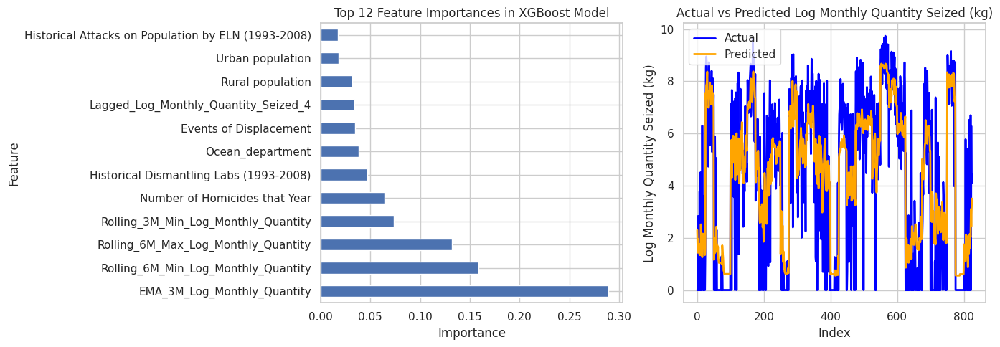

In [ ]:
all_features = ['month_number', 'Log Monthly Quantity Seized (kg)'] + ['Historical Dismantling Labs (1993-2008)', 'Number of Homicides that Year', 'Rural population',
 'Urban population', 'Events of Displacement',  'Events of Threats',  'Current income (millions pesos)',  'Historical Attacks on Population by ELN (1993-2008)'] + [
                 'EMA_3M_Log_Monthly_Quantity',   'Cumulative_Log_Monthly_Quantity_Seized_Per_Year', 'Rolling_6M_Max_Log_Monthly_Quantity', 'Rolling_6M_Min_Log_Monthly_Quantity', 'Rolling_3M_Min_Log_Monthly_Quantity', 'Lagged_Log_Monthly_Quantity_Seized_4'] + deptfeatures

xg_train = train[all_features]
xg_val = val[all_features]
xg_test = test[all_features]
xg_final_train = final_train[all_features]
XGBoost(xg_final_train, xg_test)


###Standardize features

In [ ]:
deptfeatures = ['Log Monthly Quantity Seized (kg)', 'month_number',
                             'Border_Department',
       'Ocean_department', 'Department_Antioquia', 'Department_Arauca',
       'Department_Archipiélago de San Andrés, Providencia y Santa Catalina',
       'Department_Atlántico', 'Department_Bogotá D.C.', 'Department_Bolívar',
       'Department_Boyacá', 'Department_Caldas', 'Department_Caquetá',
       'Department_Casanare', 'Department_Cauca', 'Department_Cesar',
       'Department_Chocó', 'Department_Cundinamarca', 'Department_Córdoba',
       'Department_Guainía', 'Department_Guaviare', 'Department_Huila',
       'Department_La Guajira', 'Department_Magdalena', 'Department_Meta',
       'Department_Nariño', 'Department_Norte de Santander',
       'Department_Putumayo', 'Department_Quindío', 'Department_Risaralda',
       'Department_Santander', 'Department_Sucre', 'Department_Tolima',
       'Department_Valle del Cauca', 'Department_Vaupés',
       'Department_Vichada']
socioeconomic_features = ['Percent Population in Urban Areas', 'HDI', 'GDI', 'Mean International Wealth Index',
 'Infant Deaths per 1000 Live Births', 'Mean Years Schooling', 'Log Gross National Income Per Capita in 1000 USD',
 'Life Expectancy', 'Population Density_x', 'Number of Corruption Cases', 'Percent of Total Corruption Cases for That Year',
 'Number of Homicides that Year', 'Gini Coefficient', '% Poorest Household (IWI under 30)']
cede_features = ['Current income (millions pesos)', 'Tax income (millions pesos)', 'Transfers from national entities (millions of pesos)', 'Current expensives linked to institutional performance', 'Operating Expenses', 'Area km2', 'Rural population', 'Urban population', 'Total population', 'Distance to Bogota', 'Population Density_y', 'Urban to Rural Population Ratio', 'Percent Urban Population', 'Percent Rural Population', 'Historical Attacks on Population By FARC (1993-2008)', 'Historical Attacks on Population by ELN (1993-2008)', 'Historical Attacks on Population by AUC (1993-2008)', 'Historical Antinarcotics Operations (1993-2008)', 'Historical Dismantling Labs (1993-2008)', 'Total acts of terrorism', 'Total acts against police', 'Total subversive actions', 'Total acts of extorsion', 'Hectares of coca', 'Hectores of coca erdaicted manually ', 'Presence of coca cultivation (dummy)', 'Civilians hurt by mines', 'Civilians killed by mines', 'Public force members hurt by mines', 'Public force members killed by mines', 'Events of Abandoned property', 'Events of Acts of Terrorism', 'Events of Threats', 'Events of Confinement', 'Events of Sexual Crimes', 'Events of Forced Disappearances', 'Events of Displacement', 'Events of Homicide', 'Events of Personal Physical Injuries', 'Events of Personal Pyschological Injuries', 'Events of Mine Explosions', 'Events of Loss of Estate', 'Events of Kiddnapping', 'Events of Torture']
lag_features = ['Lagged_Log_Monthly_Quantity_Seized_1', 'Lagged_Log_Monthly_Quantity_Seized_2', 'Lagged_Log_Monthly_Quantity_Seized_3', 'Lagged_Log_Monthly_Quantity_Seized_4', 'Lagged_Log_Monthly_Quantity_Seized_5', 'Lagged_Log_Monthly_Quantity_Seized_6', 'Rolling_3M_Log_Monthly_Quantity', 'Rolling_6M_Log_Monthly_Quantity', 'Rolling_3M_Std_Log_Monthly_Quantity', 'Rolling_6M_Std_Log_Monthly_Quantity', 'Rolling_3M_Min_Log_Monthly_Quantity', 'Rolling_6M_Min_Log_Monthly_Quantity', 'Rolling_3M_Max_Log_Monthly_Quantity', 'Rolling_6M_Max_Log_Monthly_Quantity', 'Rolling_3M_Range_Log_Monthly_Quantity', 'Rolling_6M_Range_Log_Monthly_Quantity', 'EMA_3M_Log_Monthly_Quantity', 'EMA_6M_Log_Monthly_Quantity', 'Momentum_3_6', 'Cumulative_Log_Monthly_Quantity_Seized_Per_Year', 'season_Spring', 'season_Summer', 'season_Winter', 'Growth_Rate_Lag_1_2', 'Growth_Rate_Lag_2_3', 'Growth_Rate_Lag_1_3']


columns = socioeconomic_features + cede_features + lag_features

from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

X_train = final_train[columns]
X_test = test[columns]

scaler.fit(X_train)

X_train_standardized = scaler.transform(X_train)
X_test_standardized = scaler.transform(X_test)



X_train_standardized= pd.DataFrame(X_train_standardized, columns=columns)
X_test_standardized= pd.DataFrame(X_test_standardized, columns=columns)


final_train2 = pd.concat(
    [final_train[deptfeatures], X_train_standardized], axis=1)
final_train = final_train2
train = final_train[final_train['month_number'] < 82]
val = final_train[(final_train['month_number'] >= 82) & (final_train['month_number'] < 107)]


test = pd.concat(
    [test[deptfeatures], X_test_standardized], axis=1)

In [ ]:
department_test = test

In [ ]:
final_train.head()

,Log Monthly Quantity Seized (kg),month_number,Border_Department,Ocean_department,Department_Antioquia,Department_Arauca,"Department_Archipiélago de San Andrés, Providencia y Santa Catalina",Department_Atlántico,Department_Bogotá D.C.,Department_Bolívar,...,EMA_3M_Log_Monthly_Quantity,EMA_6M_Log_Monthly_Quantity,Momentum_3_6,Cumulative_Log_Monthly_Quantity_Seized_Per_Year,season_Spring,season_Summer,season_Winter,Growth_Rate_Lag_1_2,Growth_Rate_Lag_2_3,Growth_Rate_Lag_1_3
0,2.484907,7,1,0,0,0,0,0,0,0,...,-1.113231,-1.113324,-1.789096,-0.772779,-0.561951,1.732051,-0.561951,-0.135988,-0.135661,-0.135950
1,1.181727,8,1,0,0,0,0,0,0,0,...,-0.822515,-0.955071,0.036942,-0.658331,-0.561951,-0.577350,-0.561951,3.684865,-0.135661,-0.135950
2,0.000000,9,1,0,0,0,0,0,0,0,...,-0.941709,-1.001371,0.369772,-0.603903,-0.561951,-0.577350,-0.561951,-0.135988,3.732493,1.725512
3,0.000000,10,1,0,0,0,0,0,0,0,...,-1.241202,-1.178931,1.037397,-0.603903,-0.561951,-0.577350,-0.561951,-0.135988,-0.135661,-0.135950
4,0.000000,11,1,0,0,0,0,0,0,0,...,-1.390948,-1.305760,0.108998,-0.603903,-0.561951,-0.577350,1.779513,-0.135988,-0.135661,-0.135950


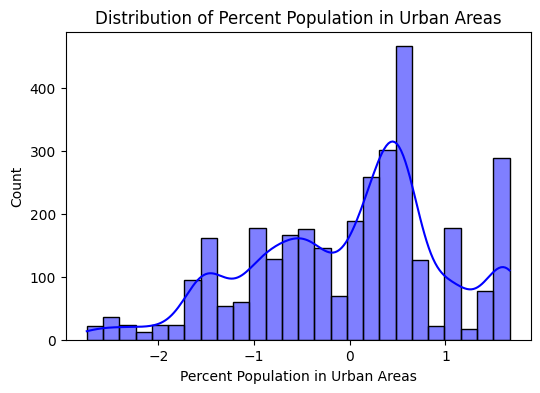

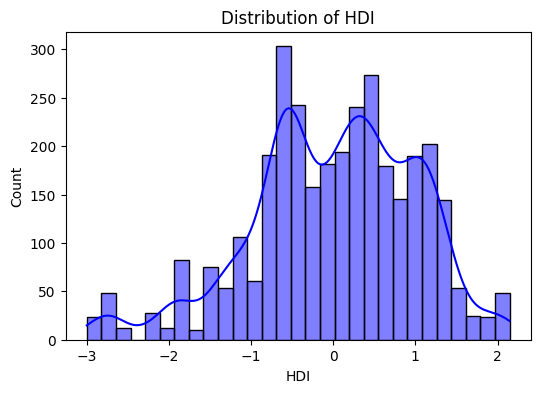

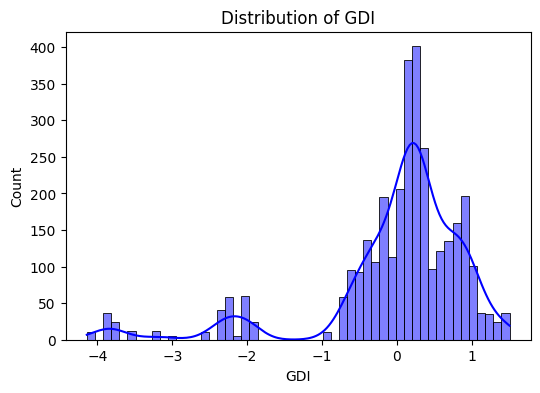

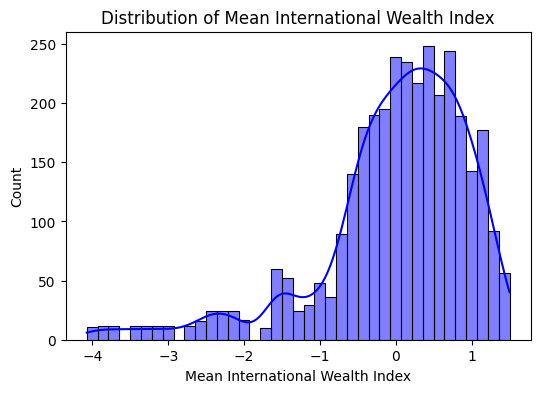

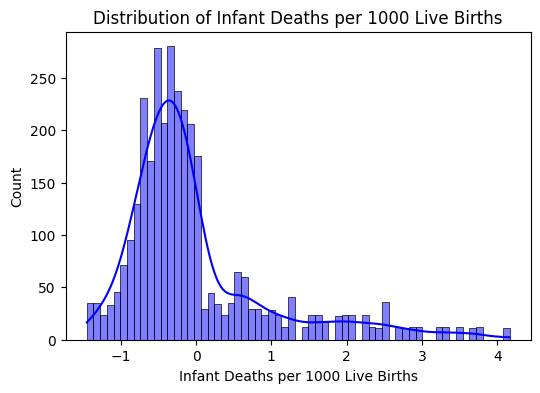

...

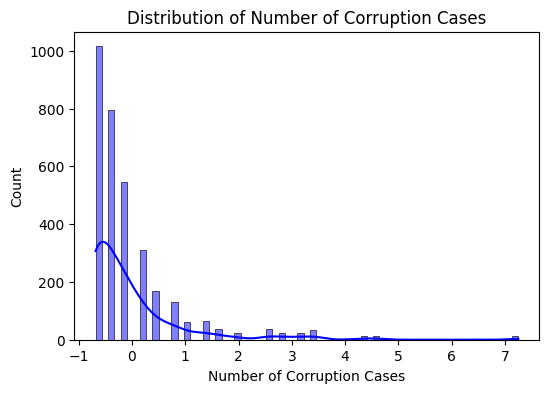

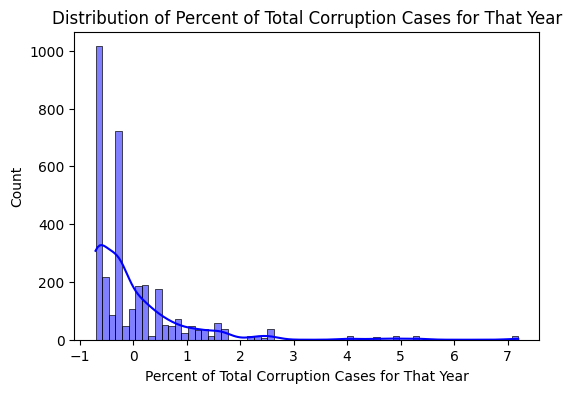

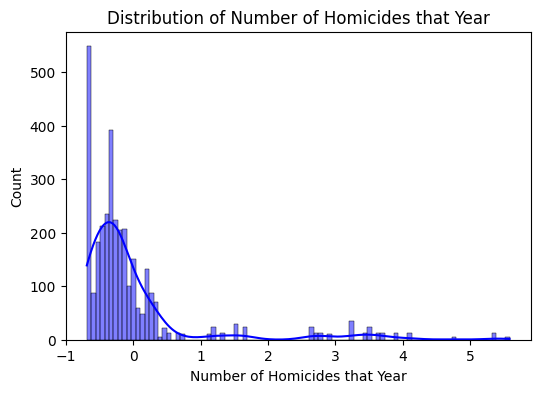

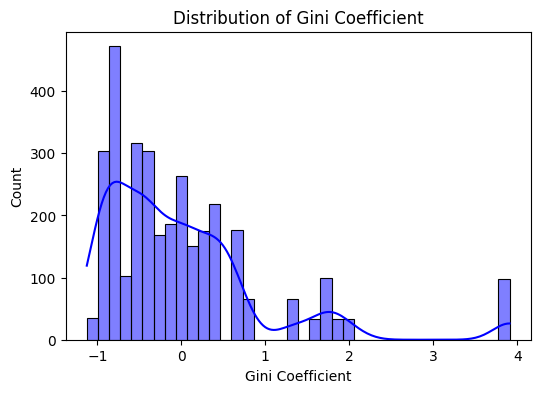

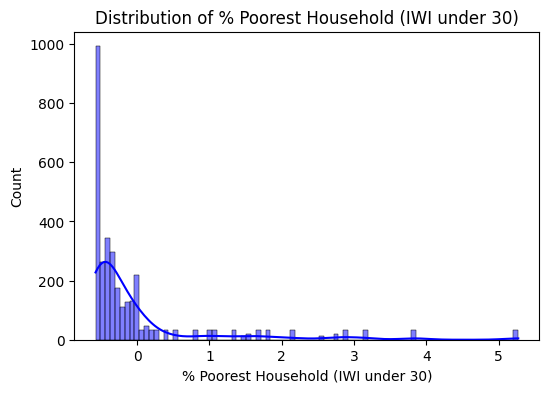

In [ ]:
  #@CITATION: Code adapted from ChatGPT
for col in socioeconomic_features:
    plt.figure(figsize=(6, 4))
    sns.histplot(final_train[col], kde=True, color='blue')
    plt.title(f'Distribution of {col}')
    plt.show()
for col in cede_features:
    plt.figure(figsize=(6, 4))
    sns.histplot(final_train[col], kde=True, color='blue')
    plt.title(f'Distribution of {col}')
    plt.show()
for col in lag_features:
    plt.figure(figsize=(6, 4))
    sns.histplot(final_train[col], kde=True, color='blue')
    plt.title(f'Distribution of {col}')
    plt.show()

###Feature Selection - Correlation Matrix Analysis

In [ ]:
#function to get correlation matrix
def getCorrMatrix(features_to_analyze, final_train, fig_size1, fig_size2):
  correlation_matrix = final_train[features_to_analyze].corr()
  plt.figure(figsize=(fig_size1, fig_size2))
  sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm')
  plt.title("Feature Correlation Matrix")
  plt.show()

In [ ]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
  #@CITATION: Code adapted from ChatGPT
def calculate_vif(df):
    vif_data = pd.DataFrame()
    vif_data["Feature"] = df.columns
    vif_data["VIF"] = [variance_inflation_factor(df.values, i) for i in range(df.shape[1])]
    return vif_data.sort_values(by="VIF", ascending=False)

# Check VIF for socioeconomic features only
vif_df = calculate_vif(final_train[socioeconomic_features])
print(vif_df)


In [ ]:
deptfeatures = [
                             'Border_Department',
       'Ocean_department', 'Department_Antioquia', 'Department_Arauca',
       'Department_Archipiélago de San Andrés, Providencia y Santa Catalina',
       'Department_Atlántico', 'Department_Bogotá D.C.', 'Department_Bolívar',
       'Department_Boyacá', 'Department_Caldas', 'Department_Caquetá',
       'Department_Casanare', 'Department_Cauca', 'Department_Cesar',
       'Department_Chocó', 'Department_Cundinamarca', 'Department_Córdoba',
       'Department_Guainía', 'Department_Guaviare', 'Department_Huila',
       'Department_La Guajira', 'Department_Magdalena', 'Department_Meta',
       'Department_Nariño', 'Department_Norte de Santander',
       'Department_Putumayo', 'Department_Quindío', 'Department_Risaralda',
       'Department_Santander', 'Department_Sucre', 'Department_Tolima',
       'Department_Valle del Cauca', 'Department_Vaupés',
       'Department_Vichada']
socioeconomic_features = ['Percent Population in Urban Areas', 'HDI', 'GDI', 'Mean International Wealth Index',
 'Infant Deaths per 1000 Live Births', 'Mean Years Schooling', 'Log Gross National Income Per Capita in 1000 USD',
 'Life Expectancy', 'Population Density_x', 'Number of Corruption Cases', 'Percent of Total Corruption Cases for That Year',
 'Number of Homicides that Year', 'Gini Coefficient', '% Poorest Household (IWI under 30)']
cede_features = ['Current income (millions pesos)', 'Tax income (millions pesos)', 'Transfers from national entities (millions of pesos)', 'Current expensives linked to institutional performance', 'Operating Expenses', 'Area km2', 'Rural population', 'Urban population', 'Total population', 'Distance to Bogota', 'Population Density_y', 'Urban to Rural Population Ratio', 'Percent Urban Population', 'Percent Rural Population', 'Historical Attacks on Population By FARC (1993-2008)', 'Historical Attacks on Population by ELN (1993-2008)', 'Historical Attacks on Population by AUC (1993-2008)', 'Historical Antinarcotics Operations (1993-2008)', 'Historical Dismantling Labs (1993-2008)', 'Total acts of terrorism', 'Total acts against police', 'Total subversive actions', 'Total acts of extorsion', 'Hectares of coca', 'Hectores of coca erdaicted manually ', 'Presence of coca cultivation (dummy)', 'Civilians hurt by mines', 'Civilians killed by mines', 'Public force members hurt by mines', 'Public force members killed by mines', 'Events of Abandoned property', 'Events of Acts of Terrorism', 'Events of Threats', 'Events of Confinement', 'Events of Sexual Crimes', 'Events of Forced Disappearances', 'Events of Displacement', 'Events of Homicide', 'Events of Personal Physical Injuries', 'Events of Personal Pyschological Injuries', 'Events of Mine Explosions', 'Events of Loss of Estate', 'Events of Kiddnapping', 'Events of Torture']
lag_features = ['Lagged_Log_Monthly_Quantity_Seized_1', 'Lagged_Log_Monthly_Quantity_Seized_2', 'Lagged_Log_Monthly_Quantity_Seized_3', 'Lagged_Log_Monthly_Quantity_Seized_4', 'Lagged_Log_Monthly_Quantity_Seized_5', 'Lagged_Log_Monthly_Quantity_Seized_6', 'Rolling_3M_Log_Monthly_Quantity', 'Rolling_6M_Log_Monthly_Quantity', 'Rolling_3M_Std_Log_Monthly_Quantity', 'Rolling_6M_Std_Log_Monthly_Quantity', 'Rolling_3M_Min_Log_Monthly_Quantity', 'Rolling_6M_Min_Log_Monthly_Quantity', 'Rolling_3M_Max_Log_Monthly_Quantity', 'Rolling_6M_Max_Log_Monthly_Quantity', 'Rolling_3M_Range_Log_Monthly_Quantity', 'Rolling_6M_Range_Log_Monthly_Quantity', 'EMA_3M_Log_Monthly_Quantity', 'EMA_6M_Log_Monthly_Quantity', 'Momentum_3_6', 'Cumulative_Log_Monthly_Quantity_Seized_Per_Year', 'season_Spring', 'season_Summer', 'season_Winter', 'Growth_Rate_Lag_1_2', 'Growth_Rate_Lag_2_3', 'Growth_Rate_Lag_1_3']


###Beginning with socioeconomic features

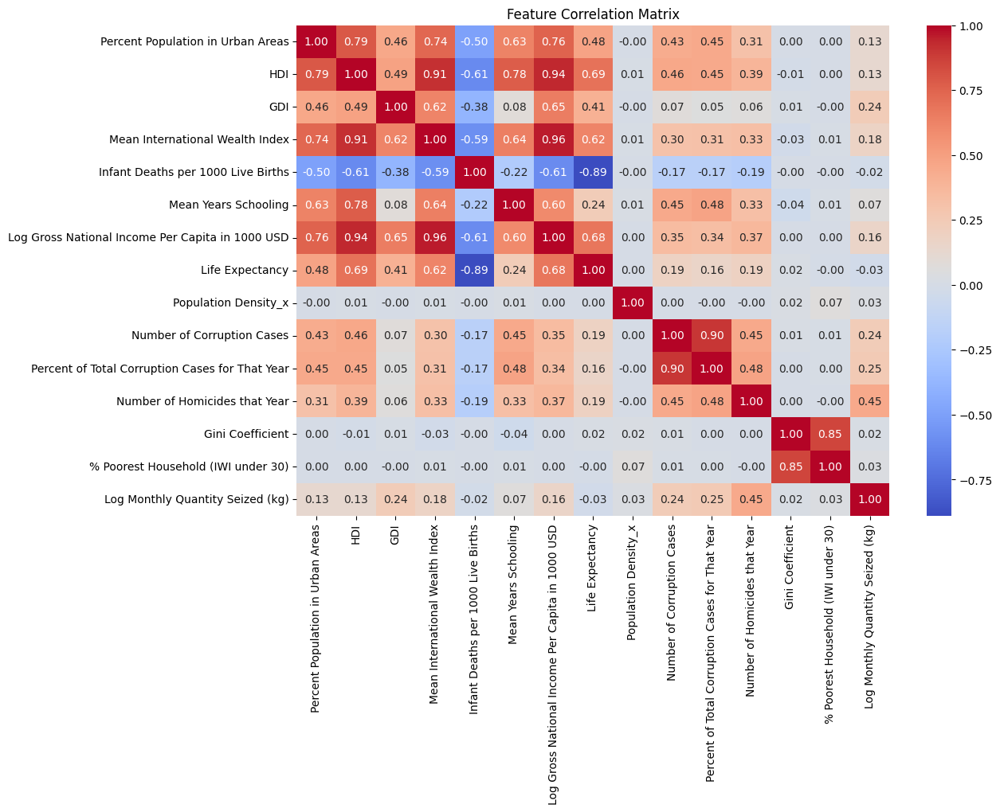

In [ ]:
getCorrMatrix(socioeconomic_features + ['Log Monthly Quantity Seized (kg)'], final_train, 12, 8)

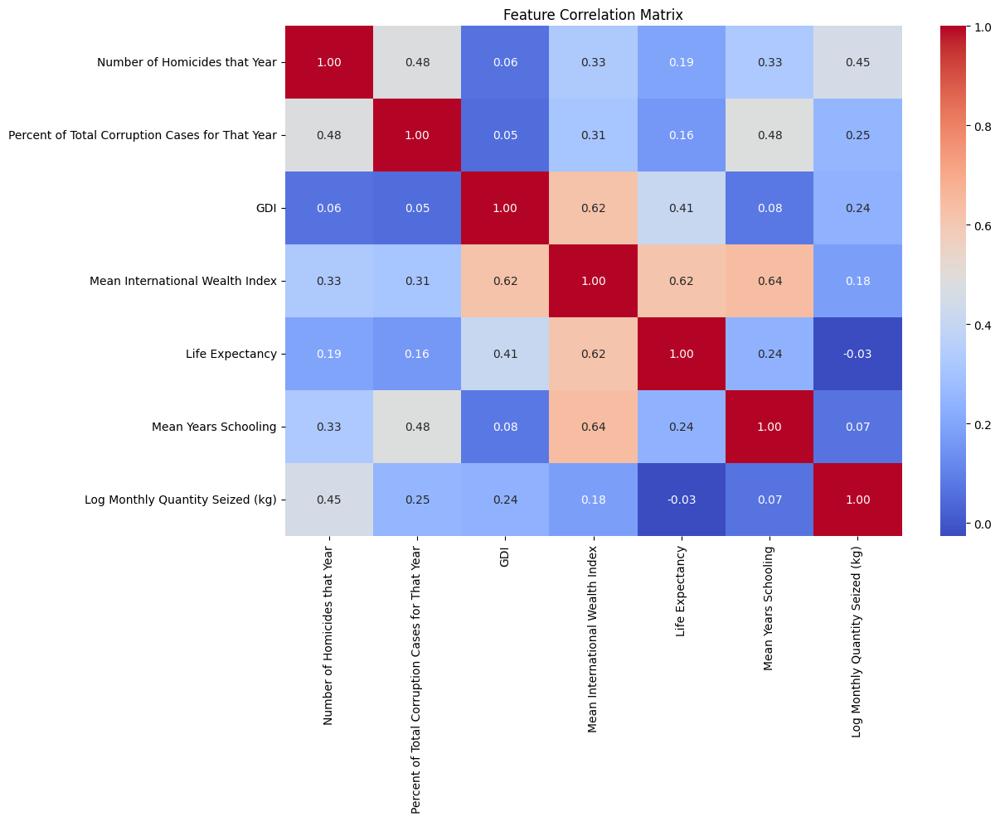

                                           Feature       VIF
3                  Mean International Wealth Index  5.492657
5                             Mean Years Schooling  2.932923
2                                              GDI  2.333169
4                                  Life Expectancy  1.762035
1  Percent of Total Corruption Cases for That Year  1.566382
0                    Number of Homicides that Year  1.395231


In [ ]:
socioeconomic_to_keep = ['Number of Homicides that Year', 'Percent of Total Corruption Cases for That Year', 'GDI', 'Mean International Wealth Index', 'Life Expectancy', 'Mean Years Schooling']
getCorrMatrix(socioeconomic_to_keep + ['Log Monthly Quantity Seized (kg)'], final_train, 12, 8)
vif_df = calculate_vif(final_train[socioeconomic_to_keep])
print(vif_df)

###Now cede features

In [ ]:
bg_features = ['Current income (millions pesos)',
 'Tax income (millions pesos)',
 'Transfers from national entities (millions of pesos)',
 'Current expensives linked to institutional performance',
 'Operating Expenses']
cg_features = ['Area km2',
 'Rural population',
 'Urban population',
 'Total population',
 'Distance to Bogota',
 'Population Density_y',
 'Urban to Rural Population Ratio',
 'Percent Urban Population',
 'Percent Rural Population']
v_features = ['Historical Attacks on Population By FARC (1993-2008)',
 'Historical Attacks on Population by ELN (1993-2008)',
 'Historical Attacks on Population by AUC (1993-2008)',
 'Historical Antinarcotics Operations (1993-2008)',
 'Historical Dismantling Labs (1993-2008)',
 'Total acts of terrorism',
 'Total acts against police',
 'Total subversive actions',
 'Total acts of extorsion',
 'Hectares of coca',
 'Hectores of coca erdaicted manually ',
 'Presence of coca cultivation (dummy)',
 'Civilians hurt by mines',
 'Civilians killed by mines',
 'Public force members hurt by mines',
 'Public force members killed by mines',
 'Events of Abandoned property',
 'Events of Acts of Terrorism',
 'Events of Threats',
 'Events of Confinement',
 'Events of Sexual Crimes',
 'Events of Forced Disappearances',
 'Events of Displacement',
 'Events of Homicide',
 'Events of Personal Physical Injuries',
 'Events of Personal Pyschological Injuries',
 'Events of Mine Explosions',
 'Events of Loss of Estate',
 'Events of Kiddnapping',
 'Events of Torture']

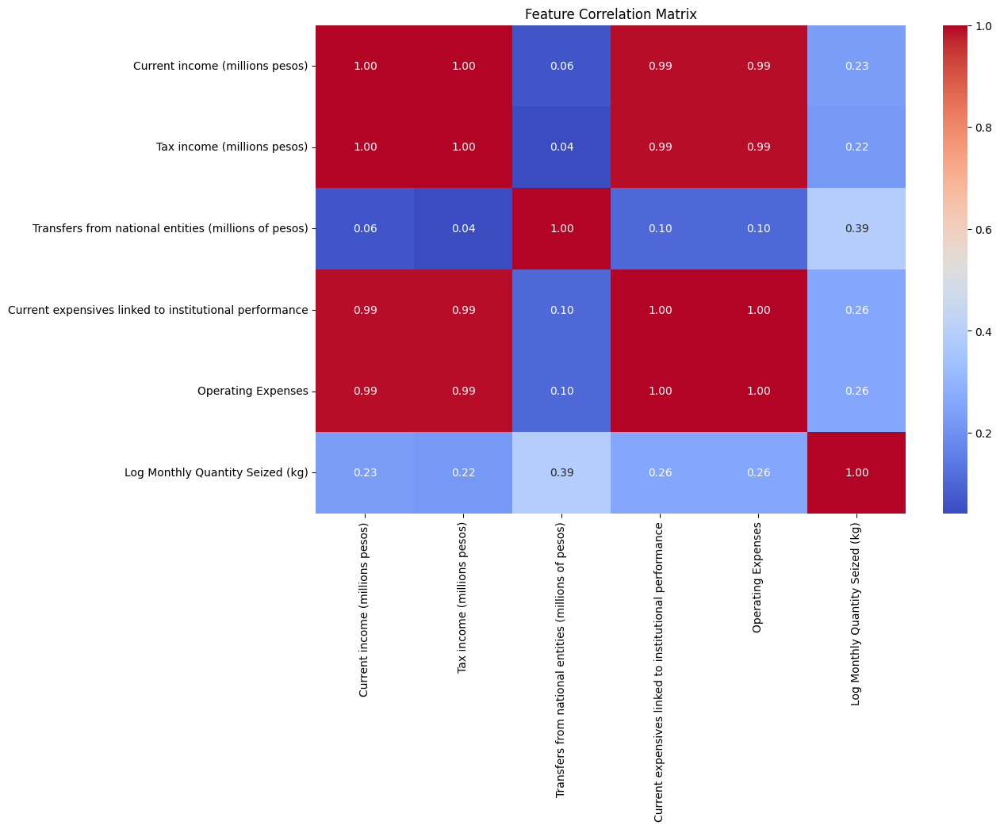

In [ ]:
getCorrMatrix(bg_features + ['Log Monthly Quantity Seized (kg)'], final_train, 12, 8)

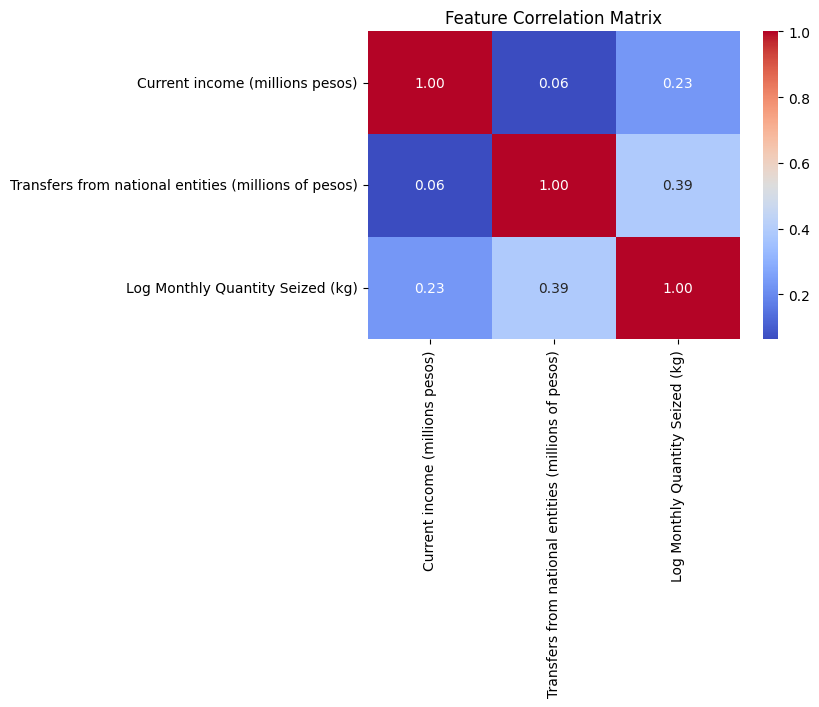

                                             Feature       VIF
0                    Current income (millions pesos)  1.004011
1  Transfers from national entities (millions of ...  1.004011


In [ ]:
bg_features_to_keep = ['Current income (millions pesos)',
 'Transfers from national entities (millions of pesos)']
getCorrMatrix(bg_features_to_keep + ['Log Monthly Quantity Seized (kg)'], final_train, 6, 4)
vif_df = calculate_vif(final_train[bg_features_to_keep])
print(vif_df)

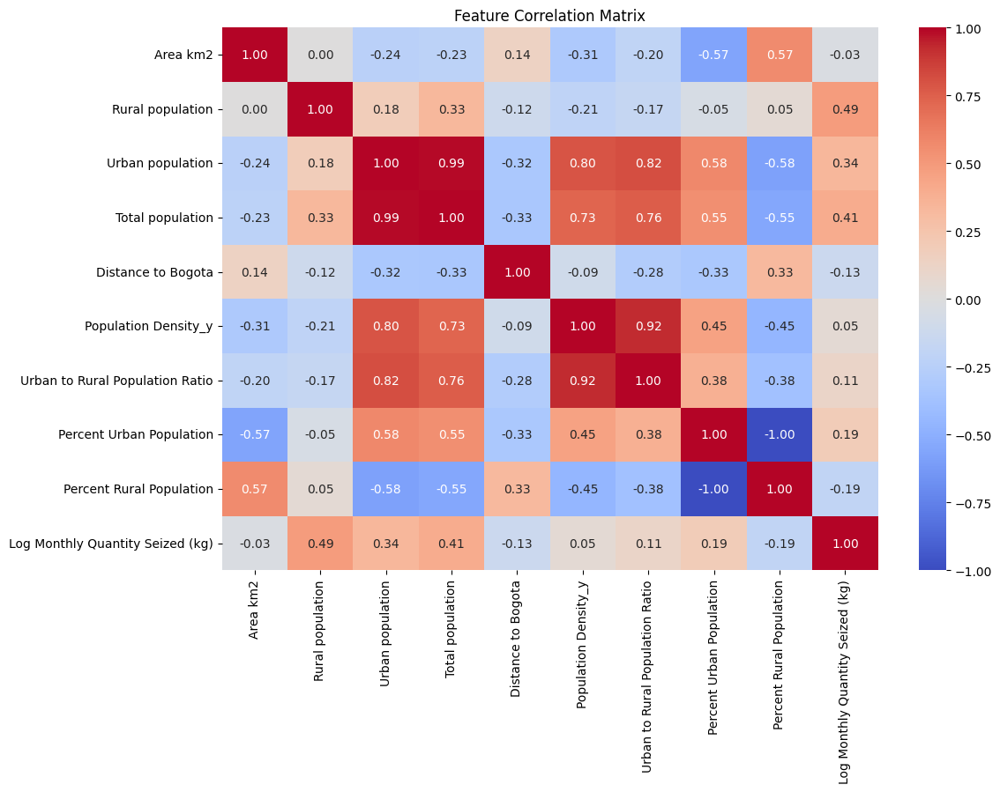

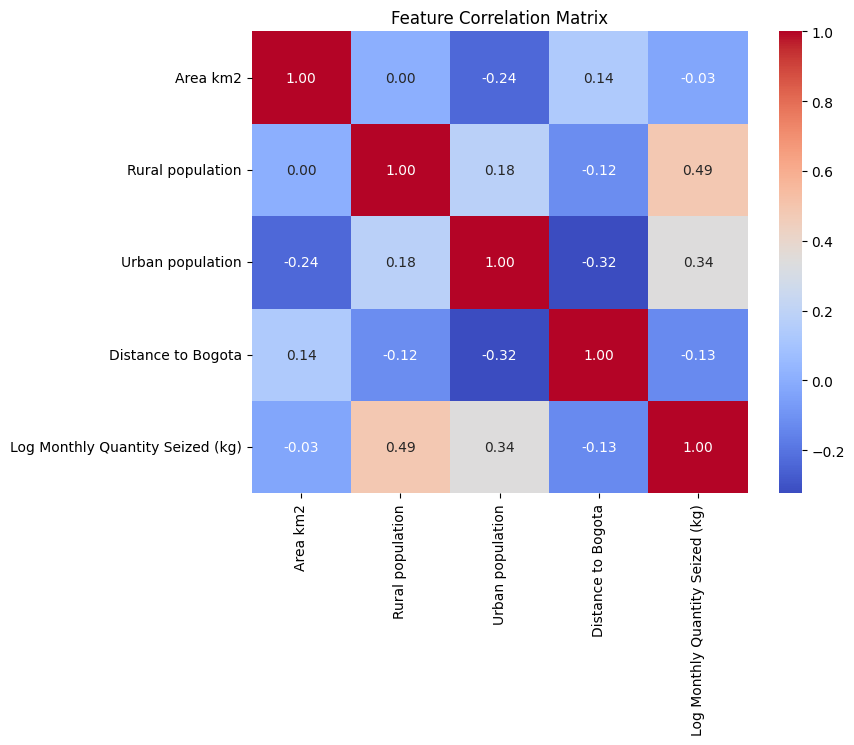

              Feature       VIF
2    Urban population  1.196022
3  Distance to Bogota  1.127339
0            Area km2  1.067508
1    Rural population  1.040778


In [ ]:
getCorrMatrix(cg_features + ['Log Monthly Quantity Seized (kg)'], final_train, 12, 8)
cg_features_to_keep = ['Area km2', 'Rural population', 'Urban population', 'Distance to Bogota']
getCorrMatrix(cg_features_to_keep + ['Log Monthly Quantity Seized (kg)'], final_train, 8, 6)
vif_df = calculate_vif(final_train[cg_features_to_keep])
print(vif_df)

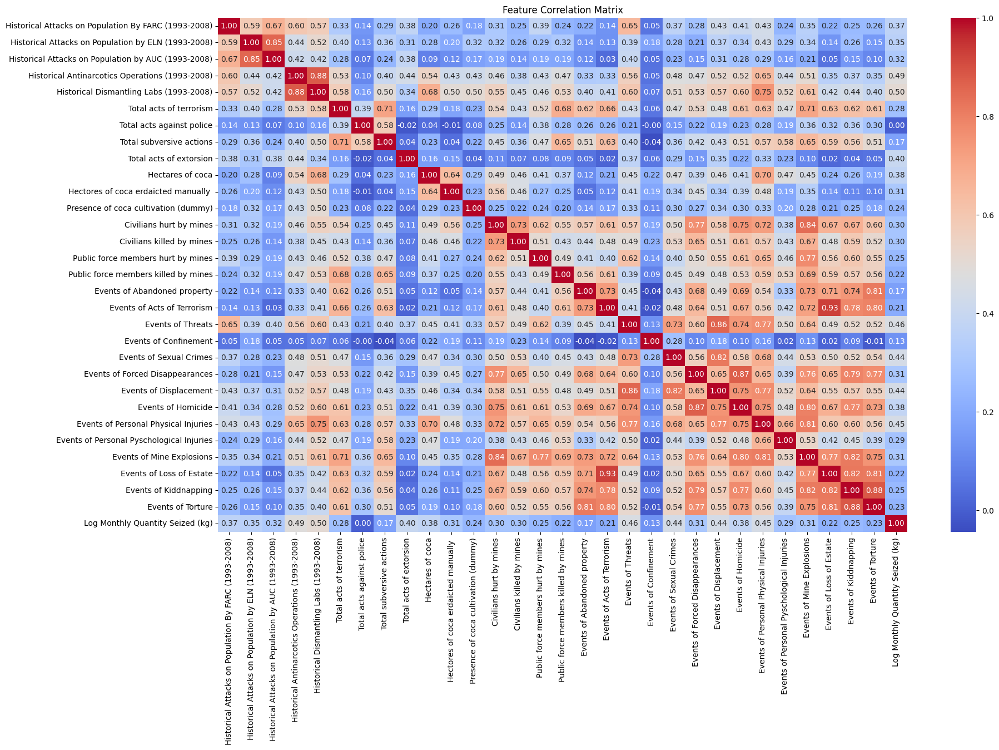

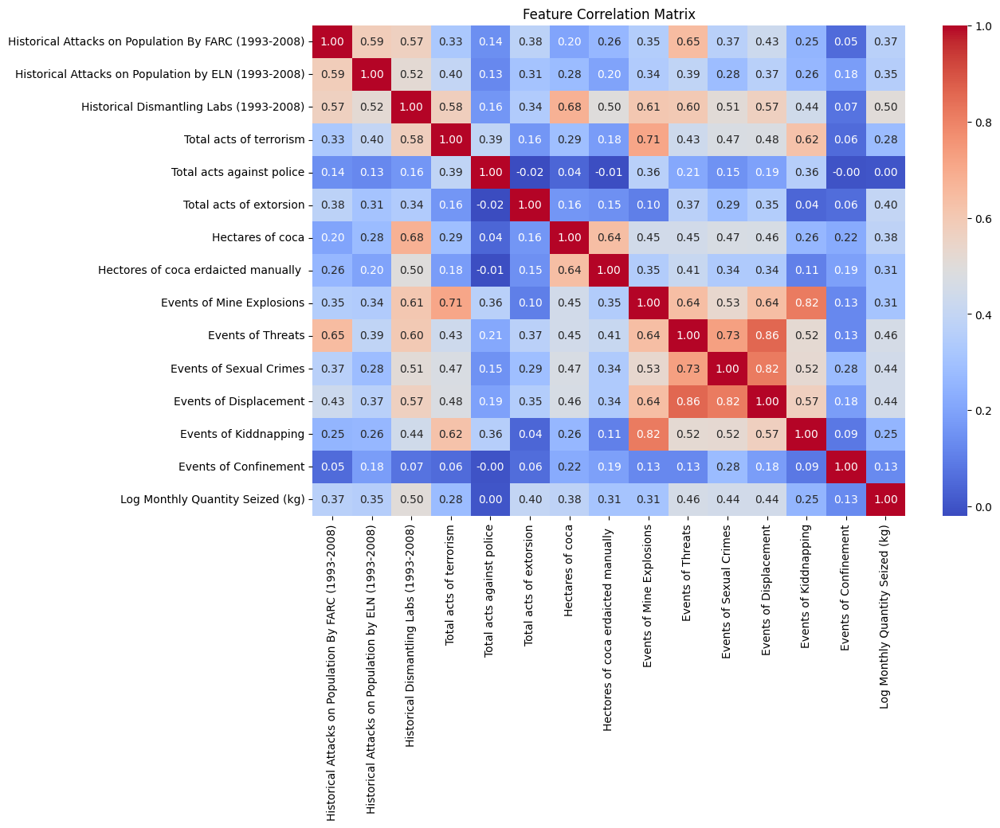

                                              Feature       VIF
9                                   Events of Threats  7.499560
11                             Events of Displacement  6.683351
8                           Events of Mine Explosions  5.735939
2             Historical Dismantling Labs (1993-2008)  4.191031
10                            Events of Sexual Crimes  3.746329
12                              Events of Kiddnapping  3.726557
0   Historical Attacks on Population By FARC (1993...  3.368301
6                                    Hectares of coca  3.041306
3                             Total acts of terrorism  2.752945
7                Hectores of coca erdaicted manually   1.960904
1   Historical Attacks on Population by ELN (1993-...  1.887645
5                             Total acts of extorsion  1.365648
4                           Total acts against police  1.261203
13                              Events of Confinement  1.218862


In [ ]:
getCorrMatrix(v_features + ['Log Monthly Quantity Seized (kg)'], final_train, 20, 12)
v_features_to_keep = ['Historical Attacks on Population By FARC (1993-2008)',
 'Historical Attacks on Population by ELN (1993-2008)',
 'Historical Dismantling Labs (1993-2008)', 'Total acts of terrorism',
 'Total acts against police',
 'Total acts of extorsion',
 'Hectares of coca',
 'Hectores of coca erdaicted manually ',
 'Events of Mine Explosions', 'Events of Threats',  'Events of Sexual Crimes',  'Events of Displacement', 'Events of Kiddnapping',
                       'Events of Confinement']


getCorrMatrix(v_features_to_keep + ['Log Monthly Quantity Seized (kg)'], final_train, 12, 8)
vif_df = calculate_vif(final_train[v_features_to_keep])
print(vif_df)

In [ ]:
keyfeatures = ['month_number', 'Log Monthly Quantity Seized (kg)']
deptfeatures = ['Border_Department',
       'Ocean_department', 'Department_Antioquia', 'Department_Arauca',
       'Department_Archipiélago de San Andrés, Providencia y Santa Catalina',
       'Department_Atlántico', 'Department_Bogotá D.C.', 'Department_Bolívar',
       'Department_Boyacá', 'Department_Caldas', 'Department_Caquetá',
       'Department_Casanare', 'Department_Cauca', 'Department_Cesar',
       'Department_Chocó', 'Department_Cundinamarca', 'Department_Córdoba',
       'Department_Guainía', 'Department_Guaviare', 'Department_Huila',
       'Department_La Guajira', 'Department_Magdalena', 'Department_Meta',
       'Department_Nariño', 'Department_Norte de Santander',
       'Department_Putumayo', 'Department_Quindío', 'Department_Risaralda',
       'Department_Santander', 'Department_Sucre', 'Department_Tolima',
       'Department_Valle del Cauca', 'Department_Vaupés',
       'Department_Vichada']

bg_features_to_keep = ['Transfers from national entities (millions of pesos)']
features_to_keep = keyfeatures + socioeconomic_to_keep + bg_features_to_keep + cg_features_to_keep + v_features_to_keep + lag_features + deptfeatures
train = train[features_to_keep]
val = val[features_to_keep]
test = test[features_to_keep]
final_train = final_train[features_to_keep]

vif_df = calculate_vif(final_train[socioeconomic_to_keep + bg_features_to_keep + cg_features_to_keep + v_features_to_keep])
print(vif_df)

                                              Feature        VIF
0                       Number of Homicides that Year  11.119172
20                                  Events of Threats   9.776117
3                     Mean International Wealth Index   8.867952
22                             Events of Displacement   7.906478
9                                    Urban population   7.206789
19                          Events of Mine Explosions   6.631875
13            Historical Dismantling Labs (1993-2008)   6.362145
5                                Mean Years Schooling   6.041029
8                                    Rural population   5.810826
11  Historical Attacks on Population By FARC (1993...   5.179616
6   Transfers from national entities (millions of ...   5.007564
21                            Events of Sexual Crimes   4.719021
17                                   Hectares of coca   4.483253
2                                                 GDI   4.422076
23                       

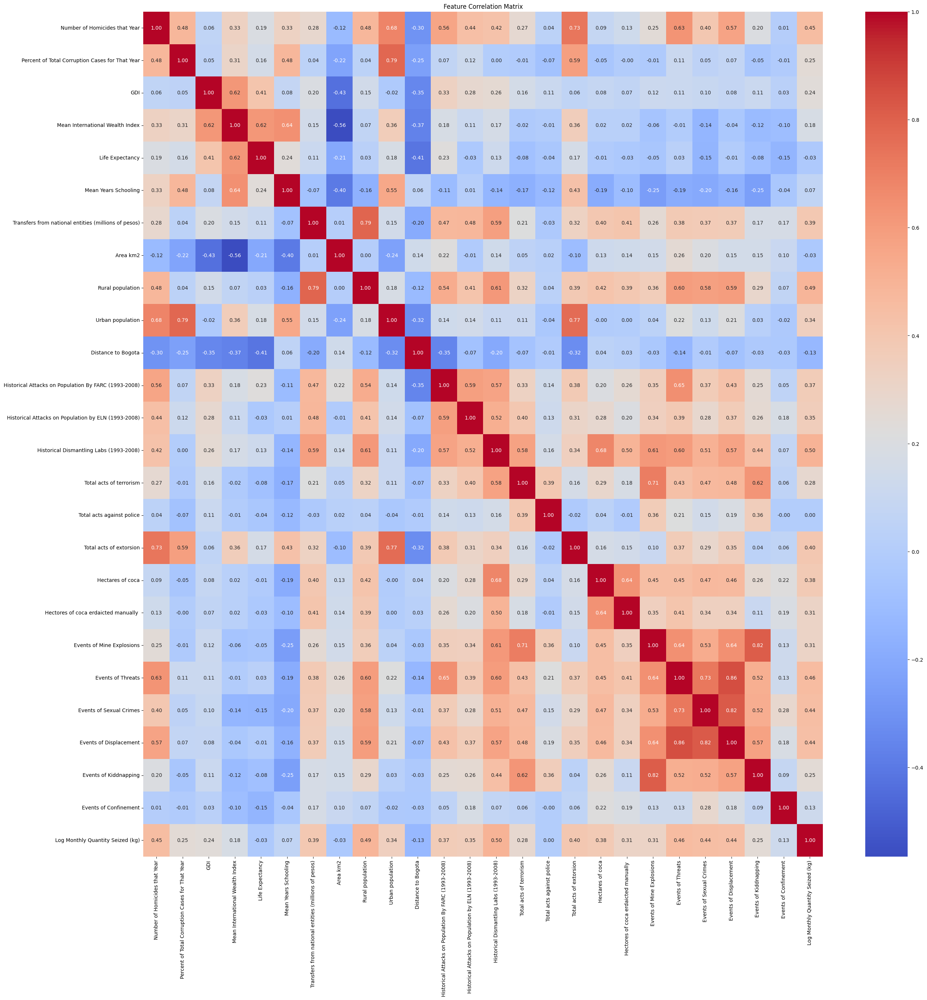

In [ ]:
all_features =  socioeconomic_to_keep + bg_features_to_keep + cg_features_to_keep + v_features_to_keep + ['Log Monthly Quantity Seized (kg)']
getCorrMatrix(all_features, final_train, 30, 30)

In [ ]:
final_train.head()

,month_number,Log Monthly Quantity Seized (kg),Number of Homicides that Year,Percent of Total Corruption Cases for That Year,GDI,Mean International Wealth Index,Life Expectancy,Mean Years Schooling,Transfers from national entities (millions of pesos),Area km2,...,Department_Norte de Santander,Department_Putumayo,Department_Quindío,Department_Risaralda,Department_Santander,Department_Sucre,Department_Tolima,Department_Valle del Cauca,Department_Vaupés,Department_Vichada
0,7,2.484907,-0.673233,-0.2574,-2.16807,-1.727521,-1.214257,-0.62556,-0.911489,1.479489,...,0,0,0,0,0,0,0,0,0,0
1,8,1.181727,-0.673233,-0.2574,-2.16807,-1.727521,-1.214257,-0.62556,-0.911489,1.479489,...,0,0,0,0,0,0,0,0,0,0
2,9,0.000000,-0.673233,-0.2574,-2.16807,-1.727521,-1.214257,-0.62556,-0.911489,1.479489,...,0,0,0,0,0,0,0,0,0,0
3,10,0.000000,-0.673233,-0.2574,-2.16807,-1.727521,-1.214257,-0.62556,-0.911489,1.479489,...,0,0,0,0,0,0,0,0,0,0
4,11,0.000000,-0.673233,-0.2574,-2.16807,-1.727521,-1.214257,-0.62556,-0.911489,1.479489,...,0,0,0,0,0,0,0,0,0,0


###Linear Regression Baseline

####Feature selection: Include 10 features

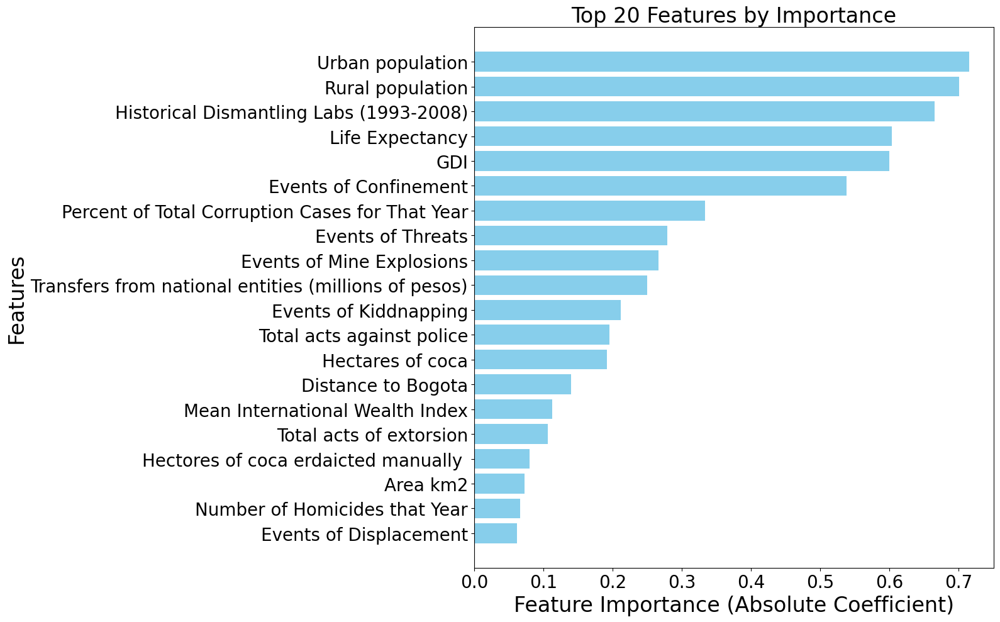

In [ ]:
from sklearn.feature_selection import RFE
baseline_features = keyfeatures + socioeconomic_to_keep + bg_features_to_keep + cg_features_to_keep + v_features_to_keep
linRegBaseline_train = train[baseline_features]
linRegBaseline_val = val[baseline_features]
linRegBaseline_test = test[baseline_features]
linRegBaseline_final_train = final_train[baseline_features]

def linRegRecursiveFeatureSelection(train, test):
  X_train = train.drop(columns=['Log Monthly Quantity Seized (kg)'])
  y_train = train['Log Monthly Quantity Seized (kg)']
  X_test = test.drop(columns=['Log Monthly Quantity Seized (kg)'])
  y_test = test['Log Monthly Quantity Seized (kg)']
  model = LinearRegression()

  #@CITATION: Code adapted from ChatGPT
 # Perform RFE
    # Perform RFE
  selector = RFE(model, n_features_to_select=20, step=1)
  selector = selector.fit(X_train, y_train)

  # Get selected features
  selected_features = X_train.columns[selector.support_]

  # Fit model with selected features
  X_train_selected = selector.transform(X_train)
  X_test_selected = selector.transform(X_test)
  model.fit(X_train_selected, y_train)

  # Get feature importance (coefficients) for selected features
  coefficients = model.coef_
  importance_df = pd.DataFrame({'Feature': selected_features, 'Importance': np.abs(coefficients)})

  # Sort by importance
  importance_df = importance_df.sort_values(by='Importance', ascending=False)

  # Plot top 20 features by importance
  plt.figure(figsize=(16, 10))
  plt.barh(importance_df['Feature'], importance_df['Importance'], color='skyblue')
  plt.xlabel('Feature Importance (Absolute Coefficient)', fontsize=24)
  plt.ylabel('Features', fontsize=24)
  plt.yticks(fontsize=20)
  plt.xticks(fontsize=20)
  plt.title('Top 20 Features by Importance', fontsize=24)
  plt.gca().invert_yaxis()  # Show most important features at the top
  plt.tight_layout()
  plt.show()


linRegRecursiveFeatureSelection(linRegBaseline_train, linRegBaseline_val)

LINEAR REGRESSION
Training MSE: 4.335208426883966
Testing Mean Squared Error (MSE): 5.555499325866721
Testing Root Mean Squared Error (RMSE): 2.3570106758066927
R-squared (R²): 0.31997645998430546


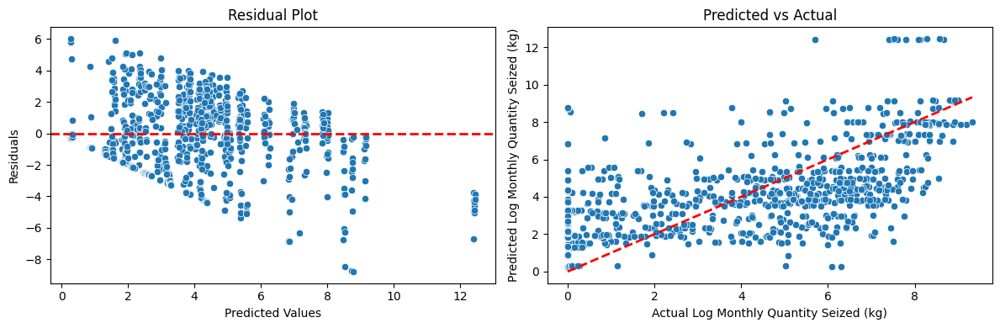

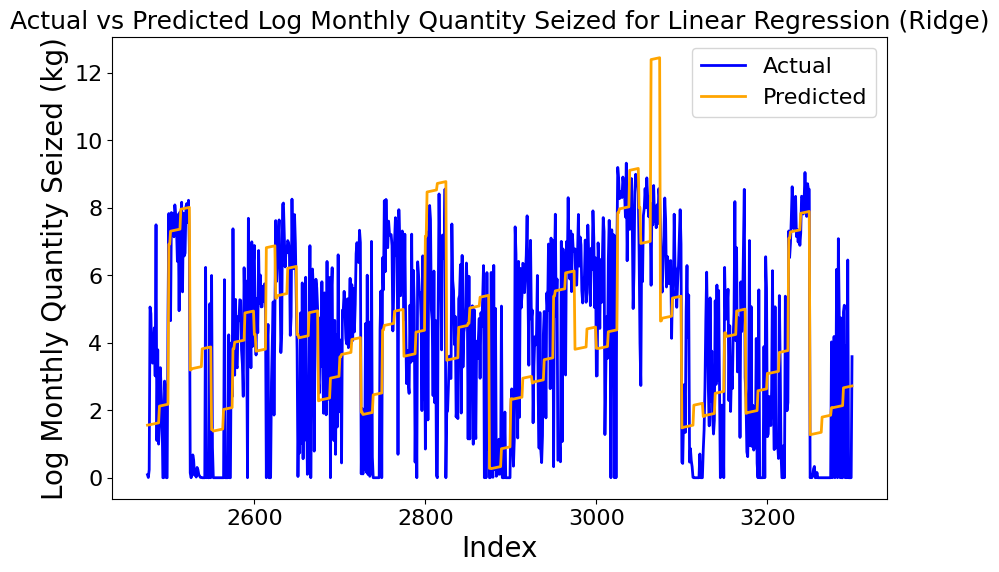

In [ ]:
linRegBaseline_selected_features = ['month_number', 'Log Monthly Quantity Seized (kg)', 'Urban population', 'Current income (millions pesos)', 'Historical Dismantling Labs (1993-2008)',  'Rural population',  'Life Expectancy', 'GDI', 'Events of Confinement',  'Number of Homicides that Year','Events of Threats','Total acts of extorsion']
linRegBaseline_selected_features = linRegBaseline_selected_features
linRegBaseline_train = train[linRegBaseline_selected_features]
linRegBaseline_val = val[linRegBaseline_selected_features]
linRegBaseline_test = test[linRegBaseline_selected_features]
linRegBaseline_final_train = final_train[linRegBaseline_selected_features]
linRegBaseline(linRegBaseline_train, linRegBaseline_val)

LINEAR REGRESSION
Training MSE: 4.458399606492822
Testing Mean Squared Error (MSE): 6.008509165737006
Testing Root Mean Squared Error (RMSE): 2.451226053577476
R-squared (R²): 0.41999630315108505


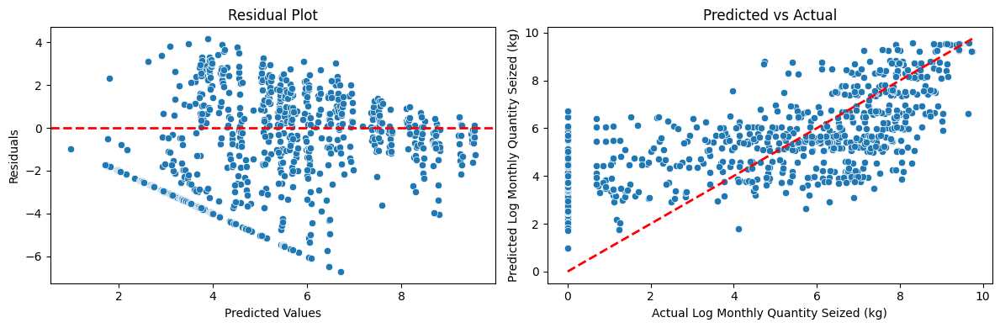

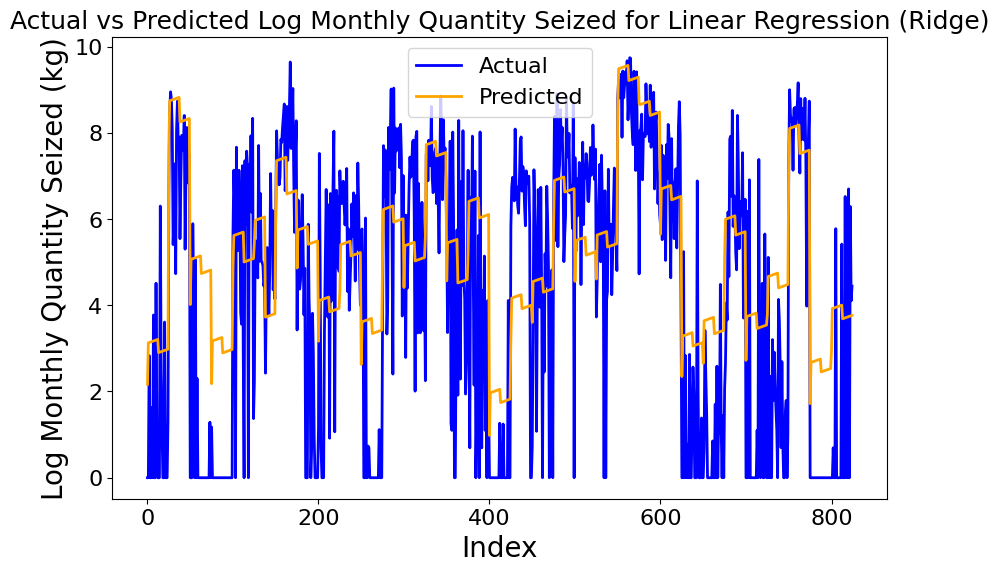

In [ ]:
linRegBaseline(linRegBaseline_final_train, linRegBaseline_test)

In [ ]:
def linRegBaseline(train, test):
  X_train = train.drop(columns=['Log Monthly Quantity Seized (kg)'])
  y_train = train['Log Monthly Quantity Seized (kg)']
  X_test = test.drop(columns=['Log Monthly Quantity Seized (kg)'])
  y_test = test['Log Monthly Quantity Seized (kg)']

  model = LinearRegression()
  model.fit(X_train, y_train)
  y_pred = model.predict(X_test)

  y_pred_train = model.predict(X_train)
  mse_train = mean_squared_error(y_train, y_pred_train)

  #eval
  mse = mean_squared_error(y_test, y_pred)
  rmse = np.sqrt(mse)
  mae = mean_absolute_error(y_test, y_pred)
  r2 = r2_score(y_test, y_pred)

  print("LINEAR REGRESSION")
  print(f"Training MSE: {mse_train}")
  print(f"Testing Mean Squared Error (MSE): {mse}")
  print(f"Testing Root Mean Squared Error (RMSE): {rmse}")
  print(f"R-squared (R²): {r2}")

  coefficients = pd.DataFrame({'Feature': X_train.columns, 'Coefficient': model.coef_})
    #@CITATION: Code adapted from ChatGPT
  # Residual Plot and Prediction vs Actual
  fig, axes = plt.subplots(1, 2, figsize=(12, 4))

  # Residual Plot
  residuals = y_test - y_pred
  sns.scatterplot(x=y_pred, y=residuals, ax=axes[0])
  axes[0].axhline(0, color='r', linestyle='--', lw=2)
  axes[0].set_xlabel("Predicted Values")
  axes[0].set_ylabel("Residuals")
  axes[0].set_title("Residual Plot")

  # Prediction vs Actual
  sns.scatterplot(x=y_test, y=y_pred, ax=axes[1])
  axes[1].plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
  axes[1].set_xlabel("Actual Log Monthly Quantity Seized (kg)")
  axes[1].set_ylabel("Predicted Log Monthly Quantity Seized (kg)")
  axes[1].set_title("Predicted vs Actual")

  plt.tight_layout()
  plt.show()

  '''
  # Distribution of Predictions and Error Distribution
  fig, axes = plt.subplots(1, 2, figsize=(12, 4))

  # Distribution of Predictions
  sns.histplot(y_pred, bins=30, kde=True, ax=axes[0])
  axes[0].set_xlabel("Predicted Log Monthly Quantity Seized (kg)")
  axes[0].set_title("Distribution of Predicted Log Monthly Quantity Seized (kg)")

  # Error Distribution
  sns.histplot(residuals, bins=30, kde=True, ax=axes[1])
  axes[1].set_xlabel("Residuals (Error)")
  axes[1].set_title("Distribution of Prediction Errors (Residuals)")

  plt.tight_layout()
  plt.show()

  # Coefficient Analysis - Bar Plot (Top 12 Features in Order)
  fig, axes = plt.subplots(1, 2, figsize=(12, 4))

  # Top 12 Coefficients
  top_12_coefficients = coefficients.sort_values(by='Coefficient', ascending=False).head(12)
  sns.barplot(x=top_12_coefficients['Coefficient'], y=top_12_coefficients['Feature'], ax=axes[0])
  axes[0].set_title("Top 12 Feature Importance (Linear Regression Coefficients)")
  axes[0].set_xlabel("Coefficient Value")
  axes[0].set_ylabel("Feature")

  # Comparison of Actual vs Predicted
  comparison_df = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})
  comparison_df.sort_index(inplace=True)
  axes[1].plot(comparison_df.index, comparison_df['Actual'], label='Actual', color='blue', linewidth=2)
  axes[1].plot(comparison_df.index, comparison_df['Predicted'], label='Predicted', color='orange', linewidth=2)
  axes[1].set_xlabel("Index")
  axes[1].set_ylabel("Log Monthly Quantity Seized (kg)")
  axes[1].set_title("Comparison of Actual vs Predicted")
  axes[1].legend()

  plt.tight_layout()
  plt.show()


  # Create a DataFrame for predictions
  results_df = X_test.copy()
  results_df['Actual'] = y_test
  results_df['Predicted'] = y_pred
  results_df['Residual'] = results_df['Actual'] - results_df['Predicted']

  # Identify the department for each row
  department_cols = [col for col in results_df.columns if col.startswith('Department_')]
  results_df['Department'] = results_df[department_cols].idxmax(axis=1).str.replace('Department_', '')

  # Set up the plot layout (4 plots per row)
  n_departments = len(results_df['Department'].unique())
  n_cols = 4
  n_rows = (n_departments // n_cols) + (n_departments % n_cols > 0)

  # Identify the department for each row
  department_cols = [col for col in results_df.columns if col.startswith('Department_')]
  results_df['Department'] = results_df[department_cols].idxmax(axis=1).str.replace('Department_', '')

  # Calculate MSE for each department
  mse_per_department = results_df.groupby('Department').apply(lambda x: mean_squared_error(x['Actual'], x['Predicted'])).reset_index()
  mse_per_department.columns = ['Department', 'MSE']

  # Print the MSE per department
  mse_per_department.sort_values(by='MSE', ascending=False, inplace=True)
  print(mse_per_department)
  departments = results_df['Department'].unique()
  for department in departments:
      dept_data = results_df[results_df['Department'] == department].sort_values(by='month_number')

      plt.figure(figsize=(10, 5))
      plt.plot(dept_data['month_number'], dept_data['Actual'], label='Actual', color='blue')
      plt.plot(dept_data['month_number'], dept_data['Predicted'], label='Predicted', color='orange')
      plt.title(f"{department} - Actual vs Predicted Log Monthly Quantity Seized (kg)", fontsize=18)
      plt.xlabel("Month Number", fontsize=16)
      plt.ylabel("Log Monthly Quantity Seized (kg)", fontsize=16)
      plt.legend(fontsize=14)  # Increase legend size
      plt.xticks(fontsize=14)  # Increase x-axis tick size
      plt.yticks(fontsize=14)  # Increase y-axis tick size
      plt.show()
  '''


###Linear Regression (Enhanced)

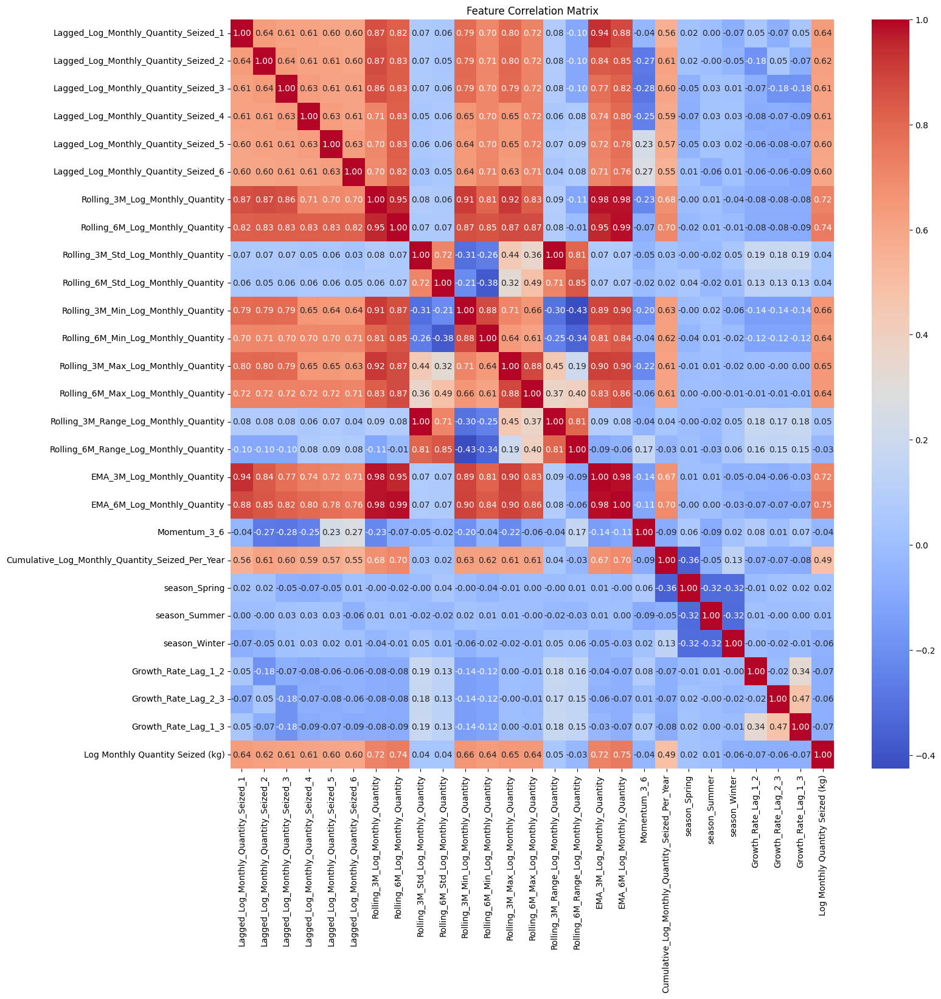

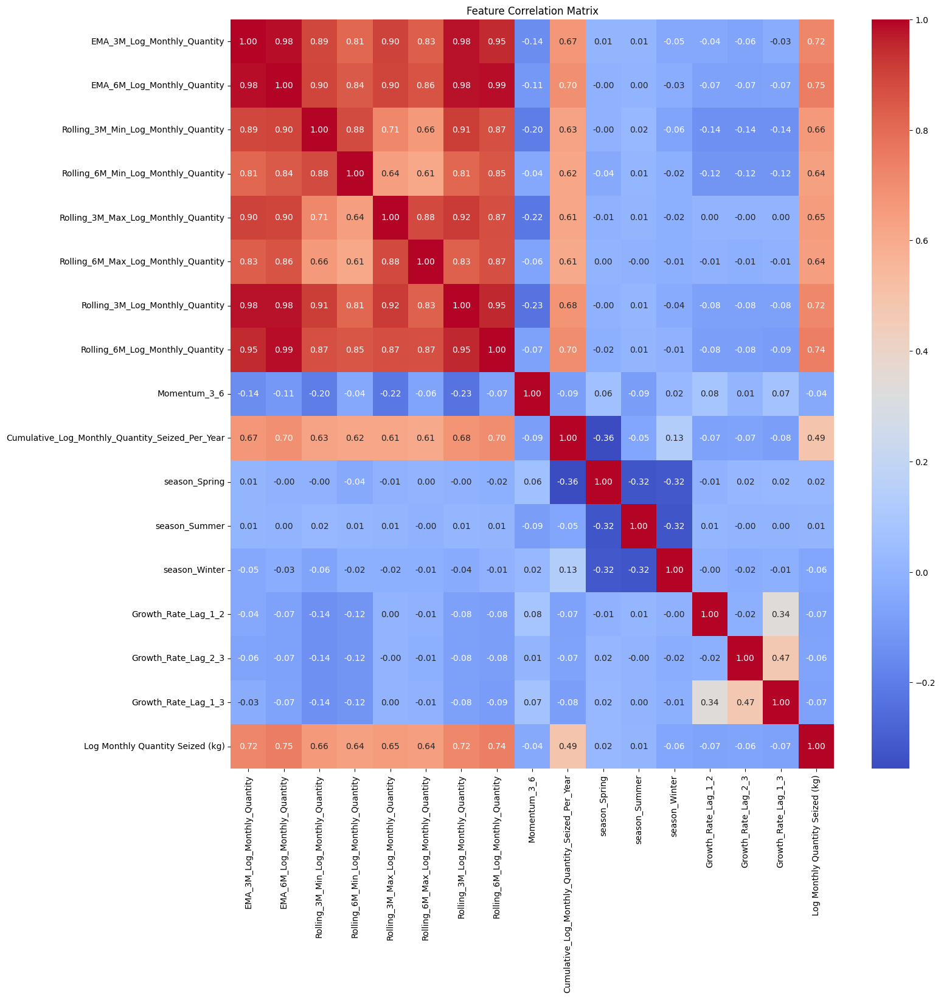

In [ ]:
getCorrMatrix(lag_features +  ['Log Monthly Quantity Seized (kg)'], final_train, 16, 16)
lag_features_to_keep = [

    'EMA_3M_Log_Monthly_Quantity',
 'EMA_6M_Log_Monthly_Quantity', 'Rolling_3M_Min_Log_Monthly_Quantity',
 'Rolling_6M_Min_Log_Monthly_Quantity',
 'Rolling_3M_Max_Log_Monthly_Quantity',
 'Rolling_6M_Max_Log_Monthly_Quantity', 'Rolling_3M_Log_Monthly_Quantity',
 'Rolling_6M_Log_Monthly_Quantity',

                        'Momentum_3_6',
 'Cumulative_Log_Monthly_Quantity_Seized_Per_Year',
 'season_Spring',
 'season_Summer',
 'season_Winter',
 'Growth_Rate_Lag_1_2',
 'Growth_Rate_Lag_2_3',
 'Growth_Rate_Lag_1_3'
]
getCorrMatrix(lag_features_to_keep +  ['Log Monthly Quantity Seized (kg)'], final_train, 16, 16)

In [ ]:
baseline_features = ['month_number', 'Log Monthly Quantity Seized (kg)', 'Urban population', 'Historical Dismantling Labs (1993-2008)',  'Rural population',
                            'Life Expectancy', 'GDI', 'Events of Confinement',  'Number of Homicides that Year','Events of Threats','Total acts of extorsion'] + lag_features_to_keep
linRegBaseline_train = train[baseline_features]
linRegBaseline_val = val[baseline_features]
linRegBaseline_test = test[baseline_features]
linRegBaseline_final_train = final_train[baseline_features]



In [ ]:
baseline_features = ['month_number', 'Log Monthly Quantity Seized (kg)', 'Urban population', 'Current income (millions pesos)', 'Historical Dismantling Labs (1993-2008)',  'Rural population',
                            'Life Expectancy', 'GDI', 'Events of Confinement',  'Number of Homicides that Year','Events of Threats','Total acts of extorsion'] +lag_features_to_keep
linRegBaseline_train = train[baseline_features]
linRegBaseline_val = val[baseline_features]
linRegBaseline_test = test[baseline_features]
linRegBaseline_final_train = final_train[baseline_features]

def linRegRecursiveFeatureSelection(train, test):
  X_train = train.drop(columns=['Log Monthly Quantity Seized (kg)'])
  y_train = train['Log Monthly Quantity Seized (kg)']
  X_test = test.drop(columns=['Log Monthly Quantity Seized (kg)'])
  y_test = test['Log Monthly Quantity Seized (kg)']
  model = LinearRegression()

  #@CITATION: Code adapted from ChatGPT
 # Perform RFE
    # Perform RFE
  selector = RFE(model, n_features_to_select=20, step=1)
  selector = selector.fit(X_train, y_train)

  # Get selected features
  selected_features = X_train.columns[selector.support_]

  # Fit model with selected features
  X_train_selected = selector.transform(X_train)
  X_test_selected = selector.transform(X_test)
  model.fit(X_train_selected, y_train)

  # Get feature importance (coefficients) for selected features
  coefficients = model.coef_
  importance_df = pd.DataFrame({'Feature': selected_features, 'Importance': np.abs(coefficients)})

  # Sort by importance
  importance_df = importance_df.sort_values(by='Importance', ascending=False)
  print(importance_df)

  importance_df = importance_df.replace('Department_Archipiélago de San Andrés, Providencia y Santa Catalina', 'Department_San_Andrés...')

  # Plot top 20 features by importance
  plt.figure(figsize=(14, 7))
  plt.barh(importance_df['Feature'], importance_df['Importance'], color='skyblue')
  plt.xlabel('Feature Importance (Absolute Coefficient)', fontsize=24)
  plt.ylabel('Features',fontsize=24)
  plt.yticks(fontsize=16)
  plt.title('Top 20 Features by Importance', fontsize=24)
  plt.gca().invert_yaxis()  # Show most important features at the top
  plt.tight_layout()
  plt.show()


linRegRecursiveFeatureSelection(linRegBaseline_train, linRegBaseline_val)

In [ ]:
from sklearn.linear_model import Ridge
selected_lag_features = ['EMA_6M_Log_Monthly_Quantity', 'Rolling_3M_Min_Log_Monthly_Quantity', 'season_Winter']

linReg_selected_features = ['month_number', 'Log Monthly Quantity Seized (kg)', 'Urban population', 'Rural population', 'Historical Dismantling Labs (1993-2008)',
                            'Life Expectancy', 'GDI',  'Number of Homicides that Year','Events of Threats','Total acts of extorsion'] + selected_lag_features + ['Department_Arauca', 'Department_Vaupés', 'Department_Boyacá', 'Department_Sucre', 'Department_Chocó', 'Ocean_department', 'Department_Magdalena', 'Department_Caquetá', 'Department_Archipiélago de San Andrés, Providencia y Santa Catalina']
linReg_train = train[linReg_selected_features]
linReg_val = val[linReg_selected_features]
linReg_test = test[linReg_selected_features]
linReg_final_train = final_train[linReg_selected_features]

#linRegRecursiveFeatureSelection(linReg_train, linReg_val)

In [ ]:
linReg_Enhanced(linReg_final_train, linReg_test)


Linear Regression
MSE: 3.3599167985357283
R-squared (R²): 0.6756659413339753

Ridge Regression
Alpha: 0.1, MSE: 3.359943591781789, R²: 0.6756633549716453
Alpha: 0.5, MSE: 3.3600548786499735, R²: 0.6756526124075288
Alpha: 1.0, MSE: 3.3602029432957887, R²: 0.675638319670416
Alpha: 2.0, MSE: 3.3605271280295894, R²: 0.6756070259935854
Alpha: 5.0, MSE: 3.361694267565896, R²: 0.6754943615660005
Alpha: 10.0, MSE: 3.364131933990128, R²: 0.6752590526900815

Lasso Regression
Alpha: 0.1, MSE: 3.358182313237701, R²: 0.6758333718657822
Alpha: 0.5, MSE: 3.8147842661719773, R²: 0.6317574100281123
Alpha: 1.0, MSE: 5.046882293672715, R²: 0.5128225143462101
Alpha: 2.0, MSE: 9.742664013921493, R²: 0.05953690185671423
Alpha: 5.0, MSE: 10.60024379818631, R²: -0.02324560400228748
Alpha: 10.0, MSE: 10.60024379818631, R²: -0.02324560400228748

Elastic Net Regression
Alpha: 0.1, L1 Ratio: 0.1, MSE: 3.5257357479256313, R²: 0.6596593744800576
Alpha: 0.1, L1 Ratio: 0.5, MSE: 3.4168340292210844, R²: 0.67017169920

In [ ]:
linReg_Enhanced(linReg_train, linReg_val)


Linear Regression
MSE: 3.821881292919279
R-squared (R²): 0.5321808007014277

Ridge Regression
Alpha: 0.1, MSE: 3.8091621096992783, R²: 0.5337376983792117
Alpha: 0.5, MSE: 3.8004054524816295, R²: 0.5348095611750767
Alpha: 1.0, MSE: 3.7964295626863067, R²: 0.5352962318584371
Alpha: 2.0, MSE: 3.792345465589344, R²: 0.5357961477080735
Alpha: 5.0, MSE: 3.7869930490550727, R²: 0.536451312802294
Alpha: 10.0, MSE: 3.781393244123372, R²: 0.5371367595910861

Lasso Regression
Alpha: 0.1, MSE: 3.7793448692611404, R²: 0.5373874918913509
Alpha: 0.5, MSE: 4.049125941693996, R²: 0.5043648112745371
Alpha: 1.0, MSE: 4.786871124683359, R²: 0.41406076090230803
Alpha: 2.0, MSE: 7.693370982991861, R²: 0.058289261930213776
Alpha: 5.0, MSE: 8.272632783068834, R²: -0.012615554500980952
Alpha: 10.0, MSE: 8.272632783068834, R²: -0.012615554500980952

Elastic Net Regression
Alpha: 0.1, L1 Ratio: 0.1, MSE: 3.776598163102, R²: 0.5377237037664968
Alpha: 0.1, L1 Ratio: 0.5, MSE: 3.7565161264344415, R²: 0.54018185502

In [ ]:
from sklearn.linear_model import Ridge, Lasso, ElasticNet
  #@CITATION: Code adapted from ChatGPT
def linReg_Enhanced(train, test, alpha_values=None, l1_ratios=None):
    # Split feature/target
    X_train = train.drop(columns=['Log Monthly Quantity Seized (kg)'])
    y_train = train['Log Monthly Quantity Seized (kg)']
    X_test = test.drop(columns=['Log Monthly Quantity Seized (kg)'])
    y_test = test['Log Monthly Quantity Seized (kg)']

    # Default parameter ranges
    if alpha_values is None:
        alpha_values = [0.1, 0.5, 1.0, 2.0, 5.0, 10.0]
    if l1_ratios is None:
        l1_ratios = [0.1, 0.5, 0.7, 0.9]

    # Initialize models
    base_models = {
        "Linear Regression": LinearRegression(),
        "Ridge Regression": Ridge(),
        "Lasso Regression": Lasso(),
        "Elastic Net Regression": ElasticNet()
    }

    for name, model in base_models.items():
        print(f"\n{name}\n{'=' * len(name)}")

        if name == "Linear Regression":
            # No regularization for Linear Regression
            model.fit(X_train, y_train)
            y_pred = model.predict(X_test)
            mse = mean_squared_error(y_test, y_pred)
            r2 = r2_score(y_test, y_pred)
            print(f"MSE: {mse}")
            print(f"R-squared (R²): {r2}")
        else:
            # Try multiple alpha values
            for alpha in alpha_values:
                if name == "Elastic Net Regression":
                    for l1_ratio in l1_ratios:
                        model.set_params(alpha=alpha, l1_ratio=l1_ratio)
                        model.fit(X_train, y_train)
                        y_pred = model.predict(X_test)
                        mse = mean_squared_error(y_test, y_pred)
                        r2 = r2_score(y_test, y_pred)
                        print(f"Alpha: {alpha}, L1 Ratio: {l1_ratio}, MSE: {mse}, R²: {r2}")
                else:
                    model.set_params(alpha=alpha)
                    model.fit(X_train, y_train)
                    y_pred = model.predict(X_test)
                    mse = mean_squared_error(y_test, y_pred)
                    r2 = r2_score(y_test, y_pred)
                    print(f"Alpha: {alpha}, MSE: {mse}, R²: {r2}")





In [ ]:
def linReg_withRidge_Final(train, test):
    X_train = train.drop(columns=['Log Monthly Quantity Seized (kg)'])
    y_train = train['Log Monthly Quantity Seized (kg)']
    X_test = test.drop(columns=['Log Monthly Quantity Seized (kg)'])
    y_test = test['Log Monthly Quantity Seized (kg)']

    ridge_model = Ridge(alpha=10.0) #best value found above
    ridge_model.fit(X_train, y_train)
    y_pred = ridge_model.predict(X_test)

      #@CITATION: Code adapted from ChatGPT

    # Get feature importance (coefficients) and sort
    coefficients = ridge_model.coef_
    importance_df = pd.DataFrame({'Feature': X_train.columns, 'Importance': np.abs(coefficients)})

    # Sort by absolute importance
    importance_df = importance_df.sort_values(by='Importance', ascending=False)

    # Plot top 20 features by importance
    top_20_features = importance_df.head(20)
    top_20_features = top_20_features.replace('Department_Archipiélago de San Andrés, Providencia y Santa Catalina', 'Department_San_Andrés...')
    plt.figure(figsize=(12, 8))
    plt.barh(top_20_features['Feature'], top_20_features['Importance'])
    plt.xlabel('Absolute Coefficient Value', fontsize=22)
    plt.ylabel('Feature', fontsize=22)
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    plt.title('Top 20 Features by Importance - Ridge Regression', fontsize=22)
    plt.gca().invert_yaxis()  # Most important feature at the top
    plt.tight_layout()
    plt.show()

    # Calculate residuals
    residuals = y_test - y_pred

    # Residual Plot
    plt.figure(figsize=(8, 6))
    plt.scatter(y_pred, residuals, alpha=0.7)
    plt.axhline(0, color='red', linestyle='--', linewidth=1.5)
    plt.title("Residual Plot for Linear Regression (Ridge)", fontsize=22)
    plt.xlabel("Predicted Values (Log Scale)", fontsize=20)
    plt.ylabel("Residuals (Log Scale)", fontsize=20)
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    plt.show()

    # Actual vs Predicted Plot
    plt.figure(figsize=(8, 6))
    plt.scatter(y_test, y_pred, alpha=0.6, color='blue')
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', linewidth=1.5)  # Line of perfect prediction
    plt.title("Actual vs Predicted Values for Linear Regression (Ridge)", fontsize=20)
    plt.xlabel("Actual Values (Log Scale)", fontsize=20)
    plt.ylabel("Predicted Values (Log Scale)", fontsize=20)
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    plt.show()

    # Actual vs Predicted Log Monthly Quantity Seized
    comparison_df = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})
    comparison_df.sort_index(inplace=True)
    plt.figure(figsize=(10, 6))
    plt.plot(comparison_df.index, comparison_df['Actual'], label='Actual', color='blue', linewidth=2)
    plt.plot(comparison_df.index, comparison_df['Predicted'], label='Predicted', color='orange', linewidth=2)
    plt.title("Actual vs Predicted Log Monthly Quantity Seized for Linear Regression (Ridge)", fontsize=18)
    plt.xlabel("Index", fontsize=20)
    plt.ylabel("Log Monthly Quantity Seized (kg)", fontsize=20)
    plt.legend(fontsize=16)
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    plt.show()

    # Distribution of Residuals
    plt.figure(figsize=(8, 6))
    sns.histplot(residuals, bins=30, kde=True)
    plt.title("Distribution of Residuals for Linear Regression (Ridge)", fontsize=22)
    plt.xlabel("Residuals (Log Scale)", fontsize=20)
    plt.ylabel("Frequency", fontsize=20)
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    plt.show()

    # Print metrics
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    print(f"Ridge Regression")
    print(f"Testing MSE: {mse}")
    print(f"R-squared (R²): {r2}")

     # Extract department columns from department_test
    department_columns = [col for col in department_test.columns if col.startswith('Department_')]
    dept_names = [col.replace('Department_', '') for col in department_columns]

    # Filter for month numbers 107–131
    filtered_indices = department_test[(department_test['month_number'] >= 107) & (department_test['month_number'] <= 131)].index
    filtered_months = department_test.loc[filtered_indices, 'month_number']

    # Plot Actual vs Predicted for each department
    for i, dept_col in enumerate(department_columns):
        # Get indices for this department within the filtered range
        dept_indices = department_test[(department_test[dept_col] == 1) &
                                    (department_test['month_number'] >= 107) &
                                    (department_test['month_number'] <= 131)].index

        # Filter actual and predicted values for this department
        actual = y_test.loc[dept_indices]
        predicted = y_pred[dept_indices]
        months = department_test.loc[dept_indices, 'month_number']  # Get corresponding months for x-axis

        # Skip departments with no data in the filtered range
        if len(actual) == 0:
            continue

        # Create plot
        plt.figure(figsize=(10, 6))
        plt.plot(months, actual, label='Actual', linewidth=2, color='blue')
        plt.plot(months, predicted, label='Predicted', linewidth=2, linestyle='--', color='orange')

        # Titles and labels
        plt.title(f"Actual vs Predicted - {dept_names[i]} - Ridge Regression", fontsize=22)
        plt.xlabel("Month Number", fontsize=20)
        plt.ylabel("Log Monthly Quantity Seized (kg)", fontsize=20)
        plt.legend(fontsize=16)
        plt.xticks(fontsize=16)
        plt.yticks(fontsize=16)
        plt.tight_layout()
        plt.show()

    # Extract predictions for "Vichada" during months 108–131
    vichada_indices = department_test[
        (department_test['Department_Vichada'] == 1) &
        (department_test['month_number'] >= 108) &
        (department_test['month_number'] <= 131)
    ].index

    vichada_predictions = pd.DataFrame({
        'Month Number': department_test.loc[vichada_indices, 'month_number'],
        'Actual': y_test.loc[vichada_indices],
        'Predicted': y_pred[vichada_indices]
    })

    # Calculate MSE by Department (Filtered Months)
    mse_by_department = []

    for i, dept_col in enumerate(department_columns):
        # Get indices for this department within the filtered range
        dept_indices = department_test[(department_test[dept_col] == 1) &
                                    (department_test['month_number'] >= 107) &
                                    (department_test['month_number'] <= 131)].index

        # Filter actual and predicted values
        actual = y_test.loc[dept_indices]
        predicted = y_pred[dept_indices]

        # Skip departments with no data in the filtered range
        if len(actual) == 0:
            continue

        # Calculate MSE for this department
        mse = mean_squared_error(actual, predicted)
        mse_by_department.append({'Department': dept_names[i], 'MSE': mse})

    # Convert to DataFrame and sort by MSE
    mse_df = pd.DataFrame(mse_by_department).sort_values(by='MSE', ascending=True)

    mse_df = mse_df.replace('Archipiélago de San Andrés, Providencia y Santa Catalina', 'San_Andrés...')
    # Print the MSE table
    print(mse_df)

    # Optional: Bar plot for MSE
    plt.figure(figsize=(12, 8))
    plt.barh(mse_df['Department'], mse_df['MSE'])
    plt.xlabel('Log Mean Squared Error (MSE)', fontsize=20)
    plt.ylabel('Department', fontsize=20)
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    plt.title('Log MSE by Department - Linear Regression (Ridge)', fontsize=20)
    plt.tight_layout()
    plt.show()

    return importance_df, mse_df, vichada_predictions









In [ ]:
linereg_feature_importance, linreg_mse_df, linreg_vichada = linReg_withRidge_Final(linReg_final_train, linReg_test)

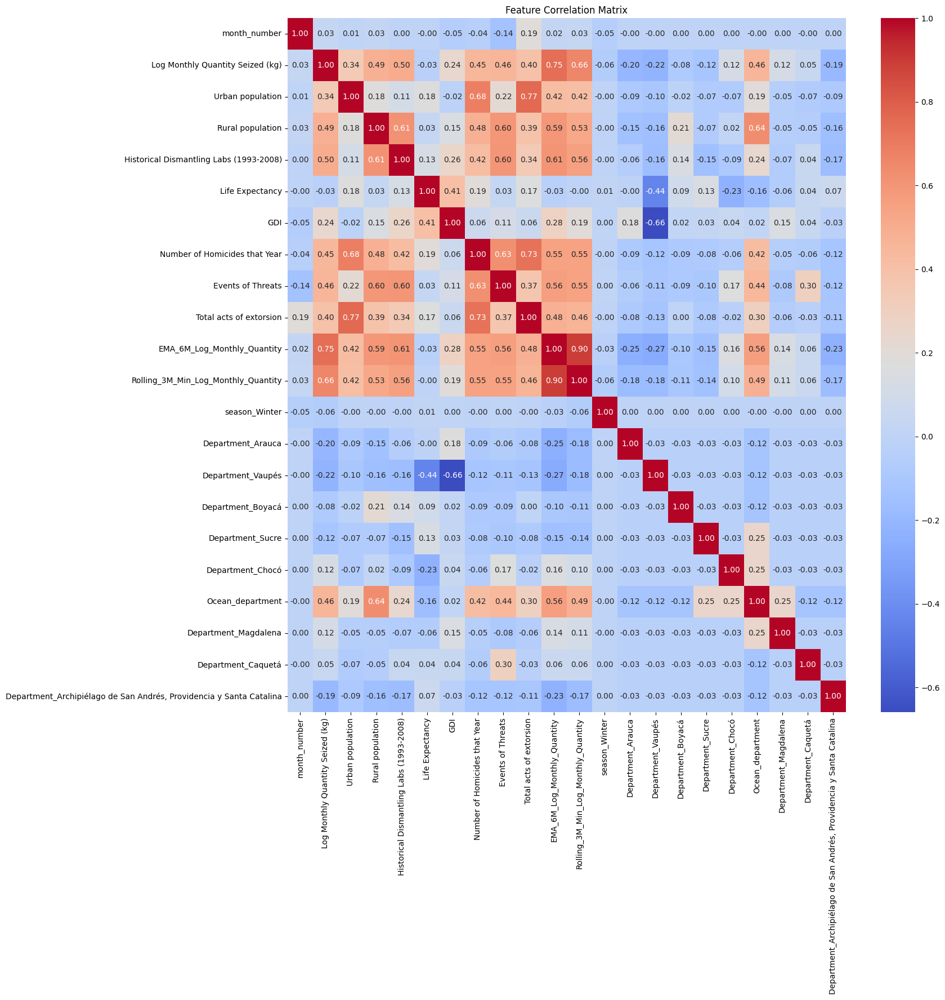

                                                                Feature       VIF
10                                          EMA_6M_Log_Monthly_Quantity  9.901779
18                                                     Ocean_department  6.301438
11                                  Rolling_3M_Min_Log_Monthly_Quantity  5.651528
7                                         Number of Homicides that Year  4.951957
1                                      Log Monthly Quantity Seized (kg)  4.627742
8                                                     Events of Threats  4.465905
3                                                      Rural population  4.171337
2                                                      Urban population  4.052593
9                                               Total acts of extorsion  3.709342
0                                                          month_number  3.594948
4                               Historical Dismantling Labs (1993-2008)  3.406354
6               

In [ ]:
getCorrMatrix(linReg_selected_features, final_train, 16, 16)
vif_df = calculate_vif(final_train[linReg_selected_features])
print(vif_df)


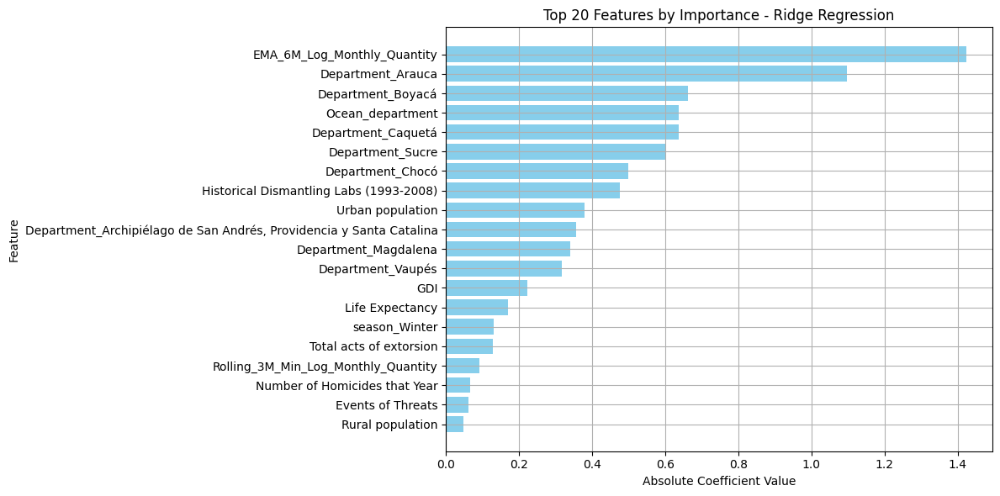

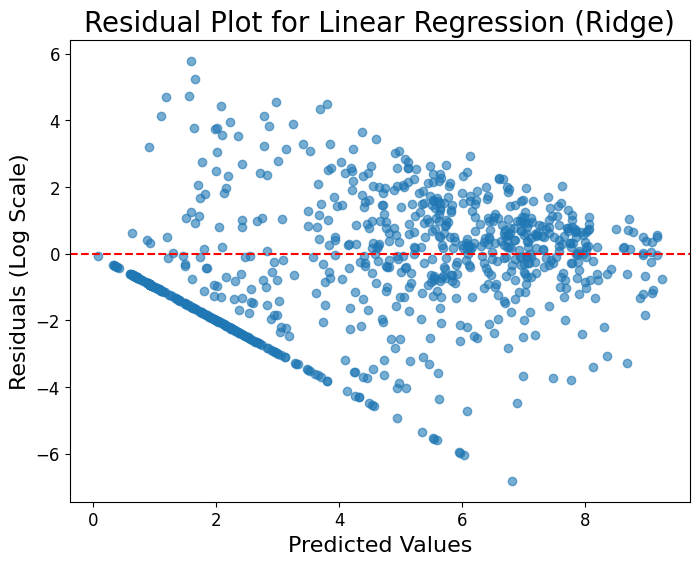

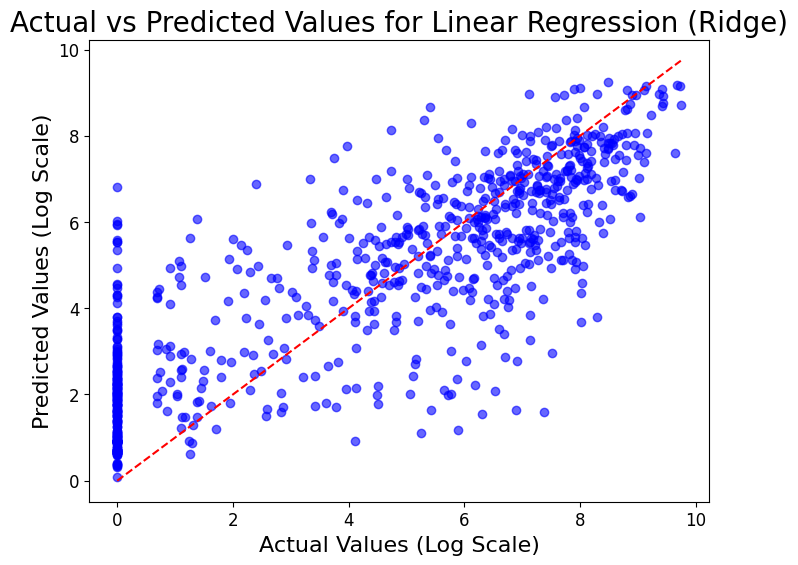

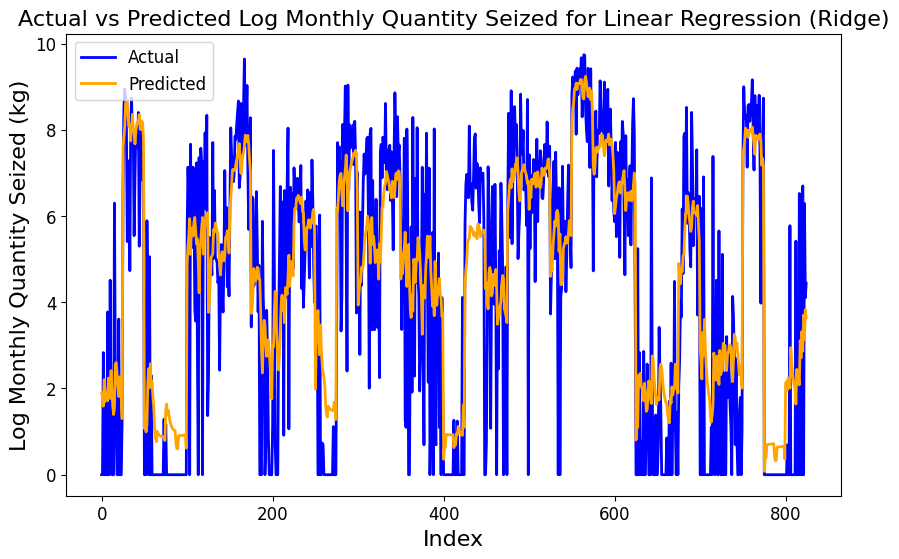

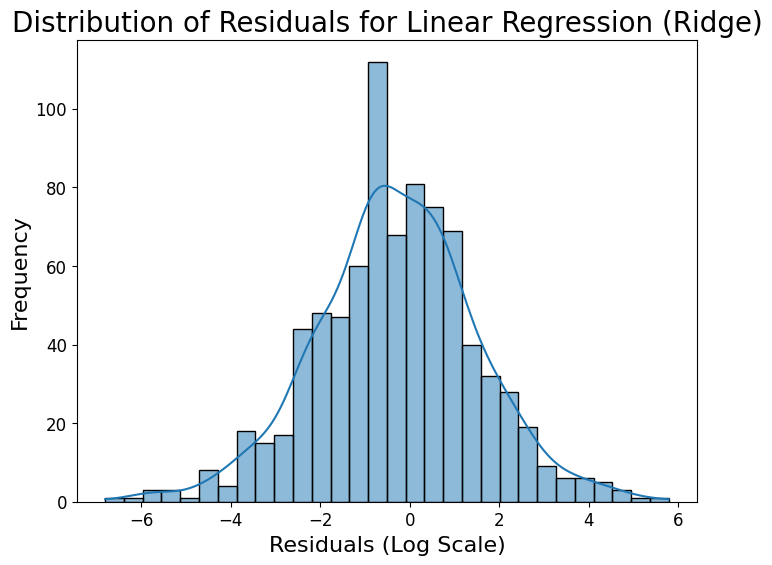

Ridge Regression
Testing MSE: 3.3605271280295894
R-squared (R²): 0.6756070259935854


In [ ]:
linReg_withRidge_Final(linReg_final_train, linReg_test)

###Random Forest

In [ ]:

from sklearn.ensemble import RandomForestRegressor
from sklearn.feature_selection import RFE
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
  #@CITATION: Code adapted from ChatGPT
def rf_recursive_feature_selection(train, test, n_features=20):
    # Split features and target
    X_train = train.drop(columns=['Log Monthly Quantity Seized (kg)'])
    y_train = train['Log Monthly Quantity Seized (kg)']
    X_test = test.drop(columns=['Log Monthly Quantity Seized (kg)'])
    y_test = test['Log Monthly Quantity Seized (kg)']

    # Initialize Random Forest Regressor
    rf_model = RandomForestRegressor(n_estimators=100, random_state=42)

    # Perform RFE
    selector = RFE(rf_model, n_features_to_select=n_features, step=1)
    selector.fit(X_train, y_train)

    # Get selected features
    selected_features = X_train.columns[selector.support_]
    print(f"Selected Features ({len(selected_features)}):")
    print(selected_features)

    # Fit model using selected features
    X_train_selected = selector.transform(X_train)
    X_test_selected = selector.transform(X_test)
    rf_model.fit(X_train_selected, y_train)
    y_pred = rf_model.predict(X_test_selected)

    # Evaluate performance
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    print(f"\nTesting MSE: {mse}")
    print(f"R-squared (R²): {r2}")

    # Feature Importances
    importance_df = pd.DataFrame({
        'Feature': selected_features,
        'Importance': rf_model.feature_importances_
    })

    # Sort by importance
    importance_df = importance_df.sort_values(by='Importance', ascending=False)

    # Plot top features
    plt.figure(figsize=(14, 7))
    plt.barh(importance_df['Feature'], importance_df['Importance'])
    plt.xlabel('Feature Importance (Gini Importance)', fontsize=20)
    plt.yticks(fontsize=20)
    plt.ylabel('Features', fontsize=20)
    plt.title(f'Top {n_features} Features by Importance - Random Forest RFE', fontsize = 20)
    plt.gca().invert_yaxis()  # Show most important features at the top
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    return importance_df

Selected Features (20):
Index(['Number of Homicides that Year',
       'Percent of Total Corruption Cases for That Year',
       'Mean International Wealth Index', 'Life Expectancy',
       'Mean Years Schooling', 'Current income (millions pesos)',
       'Transfers from national entities (millions of pesos)',
       'Rural population', 'Urban population', 'Distance to Bogota',
       'Historical Attacks on Population By FARC (1993-2008)',
       'Historical Attacks on Population by ELN (1993-2008)',
       'Historical Dismantling Labs (1993-2008)', 'Total acts of extorsion',
       'Hectares of coca', 'Hectores of coca erdaicted manually ',
       'Events of Threats', 'Events of Sexual Crimes',
       'Events of Displacement', 'Events of Kiddnapping'],
      dtype='object')

Testing MSE: 4.2528975074089015
R-squared (R²): 0.4794220557553701


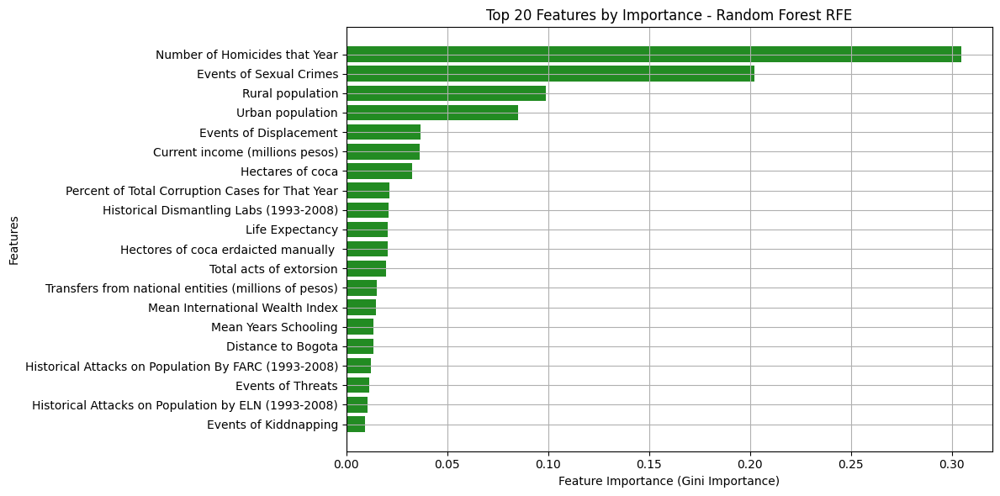

In [ ]:
#FIRST TRY JUST SOCIOECONOMIC FEATURES
lag_features = ['Lagged_Log_Monthly_Quantity_Seized_1', 'Lagged_Log_Monthly_Quantity_Seized_2', 'Lagged_Log_Monthly_Quantity_Seized_3', 'Lagged_Log_Monthly_Quantity_Seized_4', 'Lagged_Log_Monthly_Quantity_Seized_5', 'Lagged_Log_Monthly_Quantity_Seized_6', 'Rolling_3M_Log_Monthly_Quantity', 'Rolling_6M_Log_Monthly_Quantity', 'Rolling_3M_Std_Log_Monthly_Quantity', 'Rolling_6M_Std_Log_Monthly_Quantity', 'Rolling_3M_Min_Log_Monthly_Quantity', 'Rolling_6M_Min_Log_Monthly_Quantity', 'Rolling_3M_Max_Log_Monthly_Quantity', 'Rolling_6M_Max_Log_Monthly_Quantity', 'Rolling_3M_Range_Log_Monthly_Quantity', 'Rolling_6M_Range_Log_Monthly_Quantity', 'EMA_3M_Log_Monthly_Quantity', 'EMA_6M_Log_Monthly_Quantity', 'Momentum_3_6', 'Cumulative_Log_Monthly_Quantity_Seized_Per_Year', 'season_Spring', 'season_Summer', 'season_Winter', 'Growth_Rate_Lag_1_2', 'Growth_Rate_Lag_2_3', 'Growth_Rate_Lag_1_3']
all_features = [ 'Log Monthly Quantity Seized (kg)'] + socioeconomic_to_keep + bg_features_to_keep + cg_features_to_keep + v_features_to_keep


rf_train = train[all_features]
rf_val = val[all_features]
rf_test = test[all_features]
rf_final_train = final_train[all_features]
importance_df = rf_recursive_feature_selection(rf_train, rf_val, n_features=20)



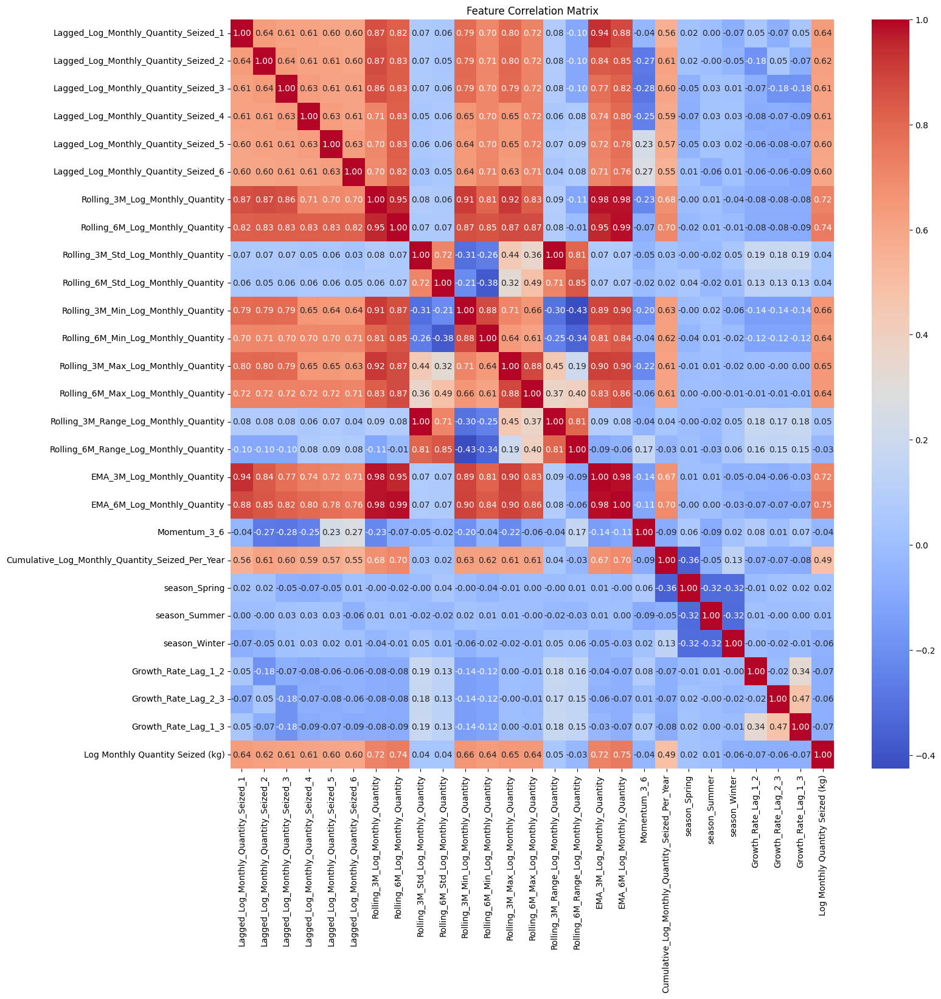

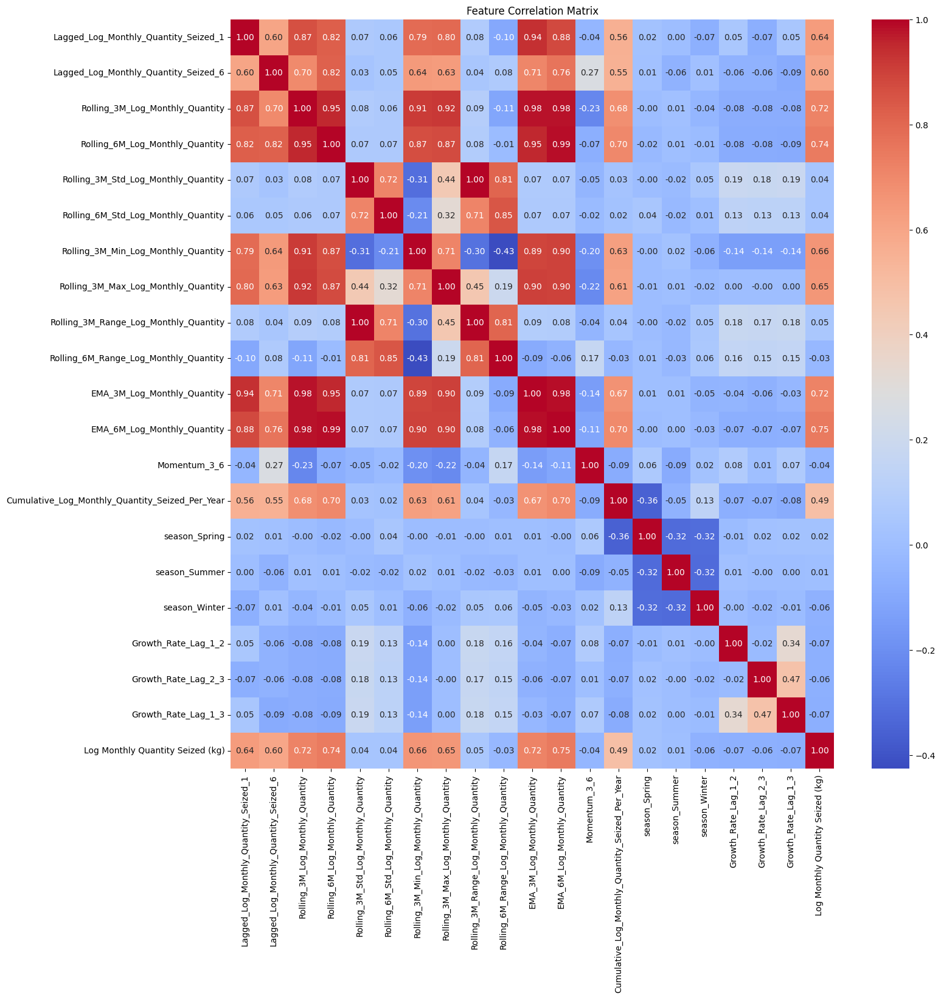

In [ ]:
getCorrMatrix(lag_features + ['Log Monthly Quantity Seized (kg)'], final_train, 16, 16)
lag_features_to_keep = ['Lagged_Log_Monthly_Quantity_Seized_1',
 'Lagged_Log_Monthly_Quantity_Seized_6',
 'Rolling_3M_Log_Monthly_Quantity',
 'Rolling_6M_Log_Monthly_Quantity',
 'Rolling_3M_Std_Log_Monthly_Quantity',
 'Rolling_6M_Std_Log_Monthly_Quantity',
 'Rolling_3M_Min_Log_Monthly_Quantity',
 'Rolling_3M_Max_Log_Monthly_Quantity',
 'Rolling_3M_Range_Log_Monthly_Quantity',
 'Rolling_6M_Range_Log_Monthly_Quantity',
 'EMA_3M_Log_Monthly_Quantity',
 'EMA_6M_Log_Monthly_Quantity',
 'Momentum_3_6',
 'Cumulative_Log_Monthly_Quantity_Seized_Per_Year',
 'season_Spring',
 'season_Summer',
 'season_Winter',
 'Growth_Rate_Lag_1_2',
 'Growth_Rate_Lag_2_3',
 'Growth_Rate_Lag_1_3']
getCorrMatrix(lag_features_to_keep + ['Log Monthly Quantity Seized (kg)'], final_train, 16, 16)


Selected Features (20):
Index(['Number of Homicides that Year', 'Life Expectancy', 'Rural population',
       'Total acts of extorsion', 'Lagged_Log_Monthly_Quantity_Seized_2',
       'Lagged_Log_Monthly_Quantity_Seized_3',
       'Lagged_Log_Monthly_Quantity_Seized_4',
       'Lagged_Log_Monthly_Quantity_Seized_5',
       'Rolling_6M_Log_Monthly_Quantity', 'EMA_3M_Log_Monthly_Quantity',
       'EMA_6M_Log_Monthly_Quantity', 'Momentum_3_6',
       'Lagged_Log_Monthly_Quantity_Seized_1',
       'Lagged_Log_Monthly_Quantity_Seized_6',
       'Rolling_3M_Log_Monthly_Quantity', 'Rolling_6M_Log_Monthly_Quantity',
       'Rolling_3M_Std_Log_Monthly_Quantity',
       'Rolling_6M_Std_Log_Monthly_Quantity', 'EMA_6M_Log_Monthly_Quantity',
       'Cumulative_Log_Monthly_Quantity_Seized_Per_Year'],
      dtype='object')

Testing MSE: 4.141190682614916
R-squared (R²): 0.4930955828290986


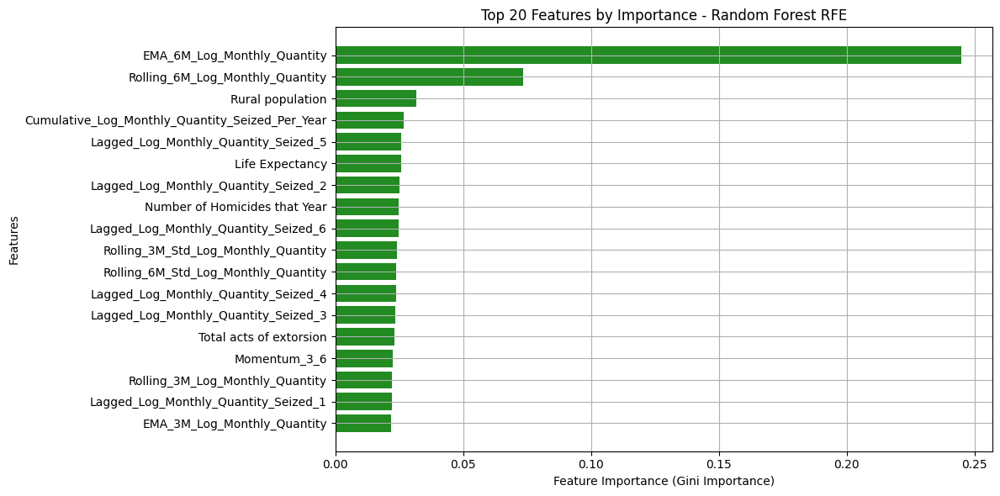

In [ ]:
all_features = all_features + lag_features_to_keep
rf_train = train[all_features]
rf_val = val[all_features]
rf_test = test[all_features]
rf_final_train = final_train[all_features]
importance_df = rf_recursive_feature_selection(rf_train, rf_val, n_features=20)

Selected Features (20):
Index(['month_number', 'Number of Homicides that Year',
       'Events of Sexual Crimes', 'Rural population', 'Urban population',
       'Events of Displacement', 'Hectares of coca',
       'Percent of Total Corruption Cases for That Year',
       'Historical Dismantling Labs (1993-2008)',
       'Hectores of coca erdaicted manually ', 'Total acts of extorsion',
       'Department_Arauca', 'Department_Vaupés', 'Department_Magdalena',
       'Lagged_Log_Monthly_Quantity_Seized_2',
       'Lagged_Log_Monthly_Quantity_Seized_5', 'EMA_3M_Log_Monthly_Quantity',
       'EMA_6M_Log_Monthly_Quantity', 'Lagged_Log_Monthly_Quantity_Seized_6',
       'Rolling_3M_Log_Monthly_Quantity'],
      dtype='object')

Testing MSE: 4.293426225662147
R-squared (R²): 0.47446111870142293


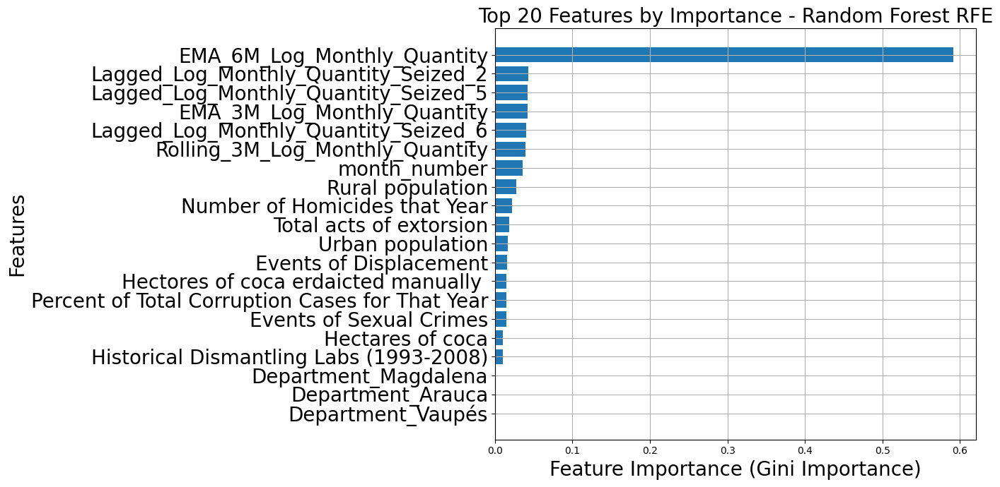

,Feature,Importance
17,EMA_6M_Log_Monthly_Quantity,0.591093
14,Lagged_Log_Monthly_Quantity_Seized_2,0.042539
15,Lagged_Log_Monthly_Quantity_Seized_5,0.042348
16,EMA_3M_Log_Monthly_Quantity,0.041780
18,Lagged_Log_Monthly_Quantity_Seized_6,0.040016
19,Rolling_3M_Log_Monthly_Quantity,0.039581
0,month_number,0.036094
3,Rural population,0.027425
1,Number of Homicides that Year,0.022264
10,Total acts of extorsion,0.018727


In [ ]:
rf_recursive_feature_selection(rf_train, rf_val, n_features=20)

In [ ]:
importance_df.head(20)

,Feature,Importance
10,EMA_6M_Log_Monthly_Quantity,0.244731
18,EMA_6M_Log_Monthly_Quantity,0.219383
15,Rolling_6M_Log_Monthly_Quantity,0.073534
8,Rolling_6M_Log_Monthly_Quantity,0.070439
2,Rural population,0.031845
19,Cumulative_Log_Monthly_Quantity_Seized_Per_Year,0.026905
7,Lagged_Log_Monthly_Quantity_Seized_5,0.025905
1,Life Expectancy,0.025710
4,Lagged_Log_Monthly_Quantity_Seized_2,0.025141
0,Number of Homicides that Year,0.024908


RANDOM FOREST: 
Training Mean Squared Error (MSE): 3.831599567921656
Testing Mean Squared Error (MSE): 4.435017171685132
R-squared: 0.5718860895088154


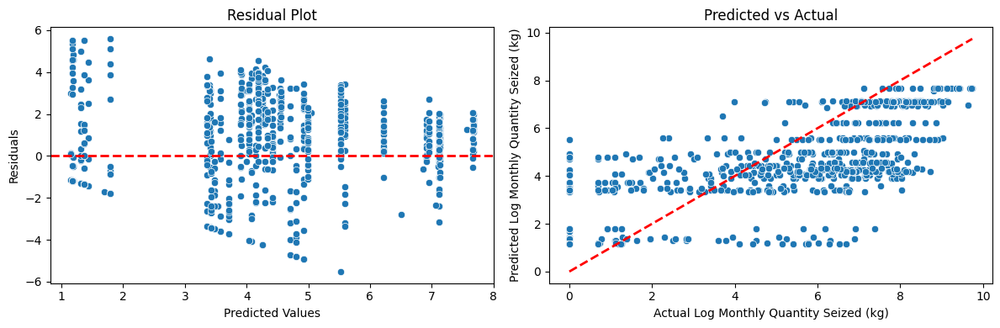

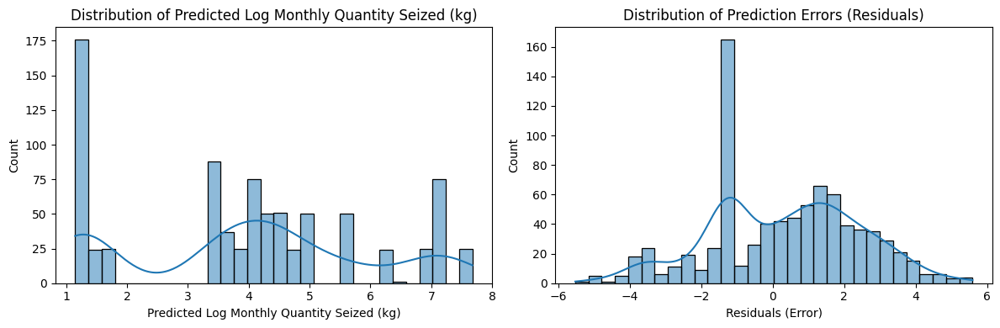

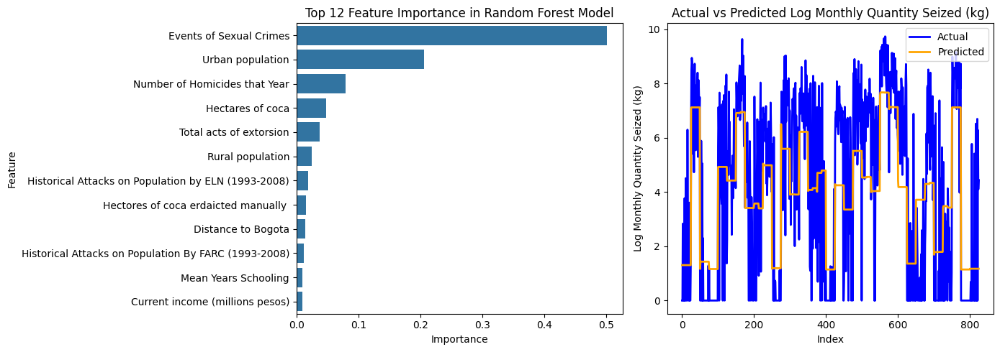

In [ ]:
soc_selected_features = ['Number of Homicides that Year',
       'Percent of Total Corruption Cases for That Year',
       'Mean International Wealth Index', 'Life Expectancy',
       'Mean Years Schooling', 'Current income (millions pesos)',
       'Transfers from national entities (millions of pesos)',
       'Rural population', 'Urban population', 'Distance to Bogota',
       'Historical Attacks on Population By FARC (1993-2008)',
       'Historical Attacks on Population by ELN (1993-2008)',
       'Historical Dismantling Labs (1993-2008)', 'Total acts of extorsion',
       'Hectares of coca', 'Hectores of coca erdaicted manually ',
       'Events of Threats', 'Events of Sexual Crimes',
       'Events of Displacement', 'Events of Kiddnapping']
rf_features = ['month_number', 'Log Monthly Quantity Seized (kg)'] + soc_selected_features + deptfeatures
rf_train = train[rf_features]
rf_val = val[rf_features]
rf_test = test[rf_features]
rf_final_train = final_train[rf_features]
randomForest(rf_final_train, rf_test)

RANDOM FOREST: 
Training Mean Squared Error (MSE): 2.5680128505999154
Testing Mean Squared Error (MSE): 3.803833976320312
R-squared: 0.5343898910822458


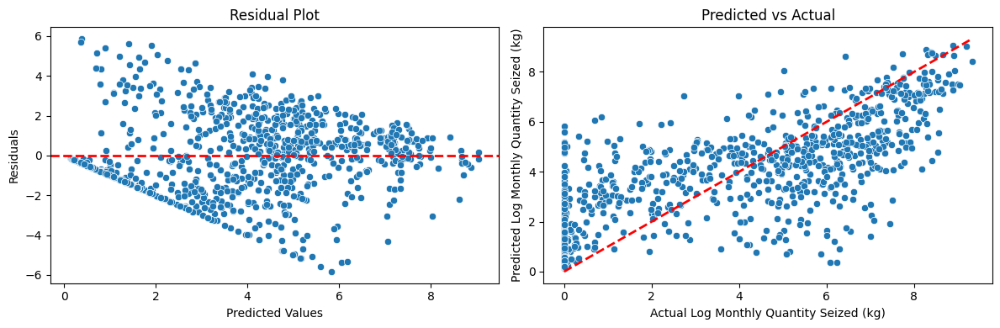

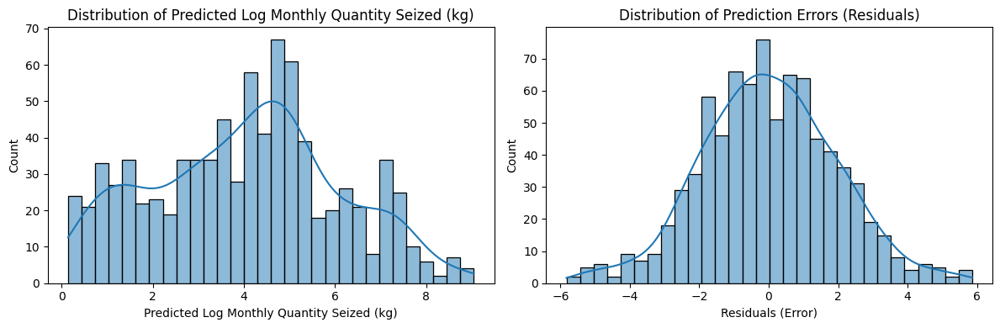

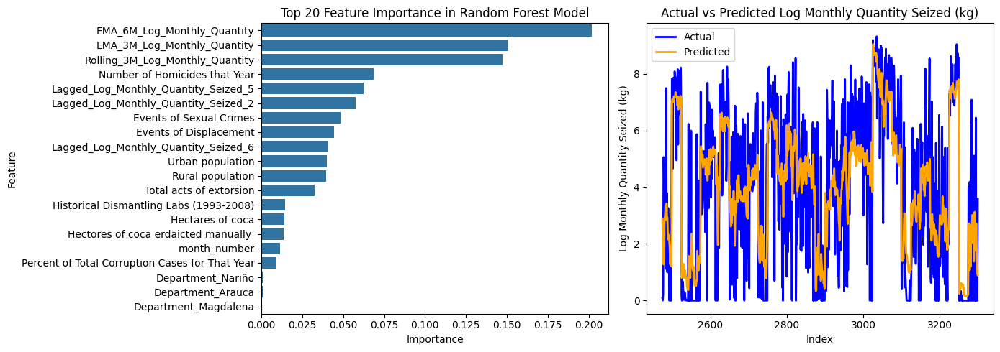

KeyError: "None of [Index([25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42,\n       43, 44, 45, 46, 47, 48, 49],\n      dtype='int64')] are in the [index]"

In [ ]:
randomForest(rf_train, rf_val)

RANDOM FOREST: 
Training Mean Squared Error (MSE): 3.0758490567196692
Testing Mean Squared Error (MSE): 4.278415037767524
R-squared: 0.5870029536262225


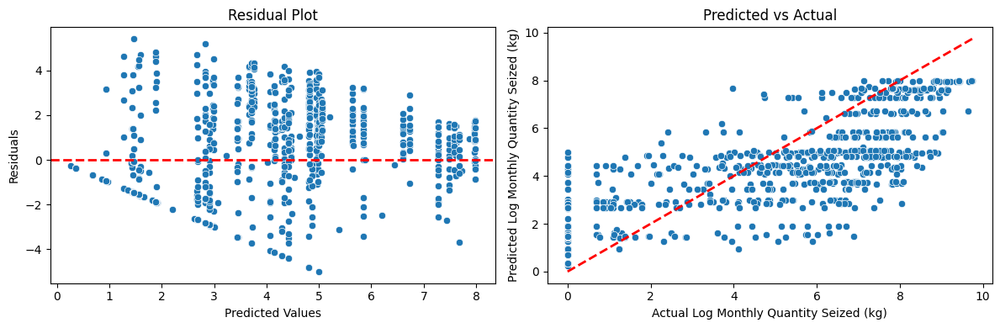

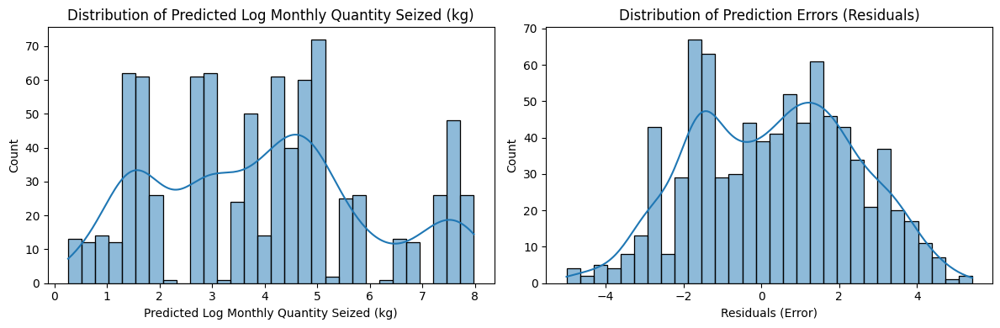

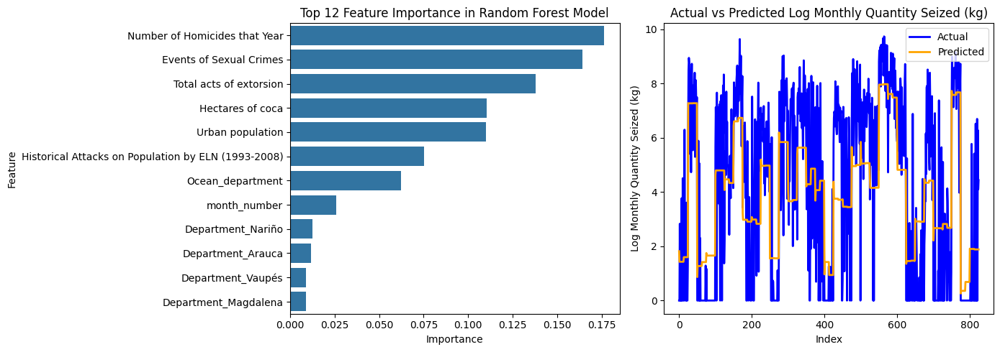

In [ ]:
soc_selected_features = [  'Historical Attacks on Population by ELN (1993-2008)',     'Total acts of extorsion',  'Hectares of coca',  'Number of Homicides that Year', 'Urban population', 'Events of Sexual Crimes']
rf_features = ['month_number', 'Log Monthly Quantity Seized (kg)'] + soc_selected_features + deptfeatures
rf_train = train[rf_features]
rf_val = val[rf_features]
rf_test = test[rf_features]
rf_final_train = final_train[rf_features]
randomForest(rf_final_train, rf_test)


RANDOM FOREST: 
Training Mean Squared Error (MSE): 2.5680128505999154
Testing Mean Squared Error (MSE): 3.803833976320312
R-squared: 0.5343898910822458


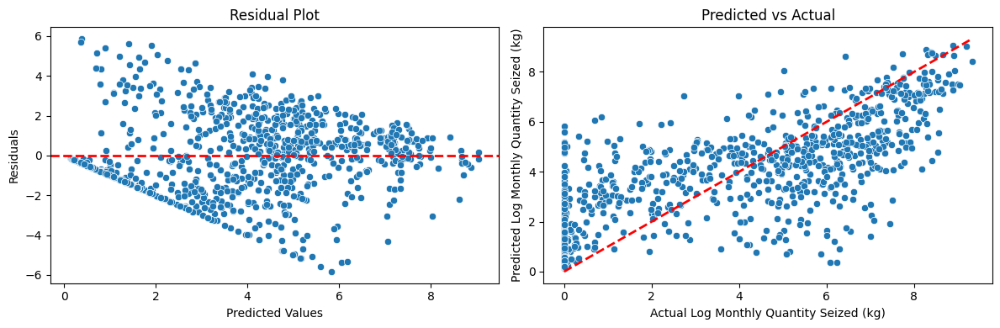

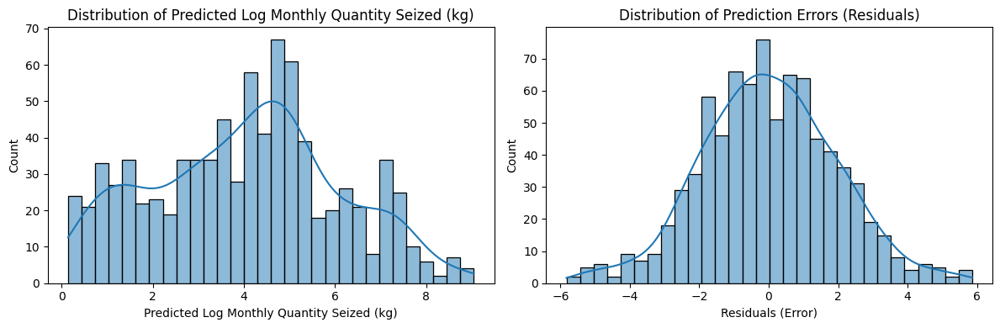

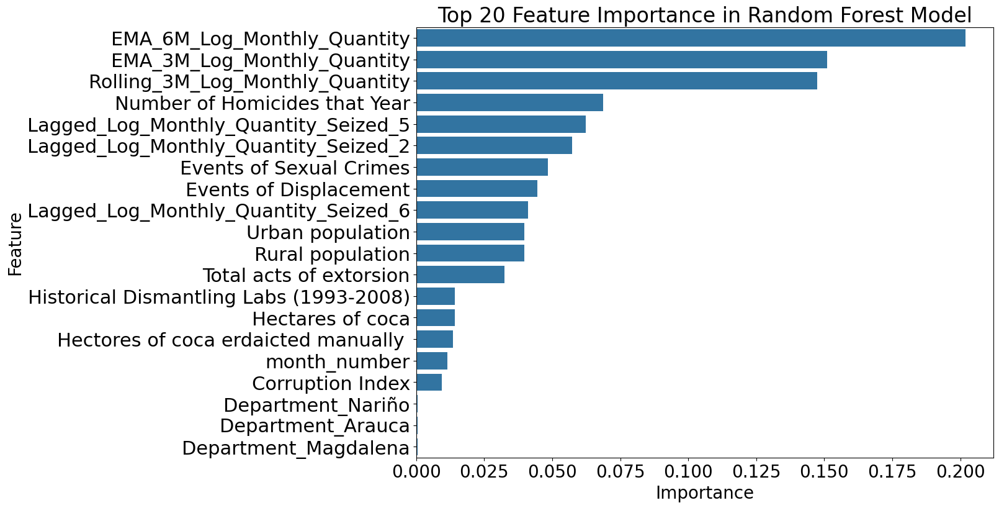

In [ ]:
randomForest(rf_train, rf_val)

RANDOM FOREST: 
Training Mean Squared Error (MSE): 2.6676311425281605
Testing Mean Squared Error (MSE): 3.335712971297537
R-squared: 0.6780023460707935


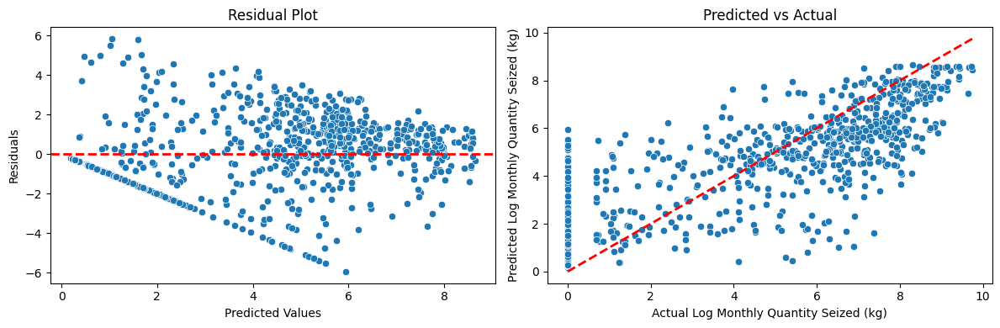

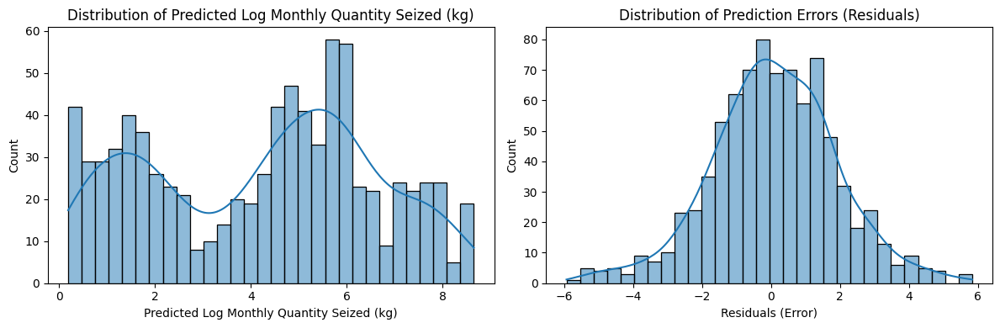

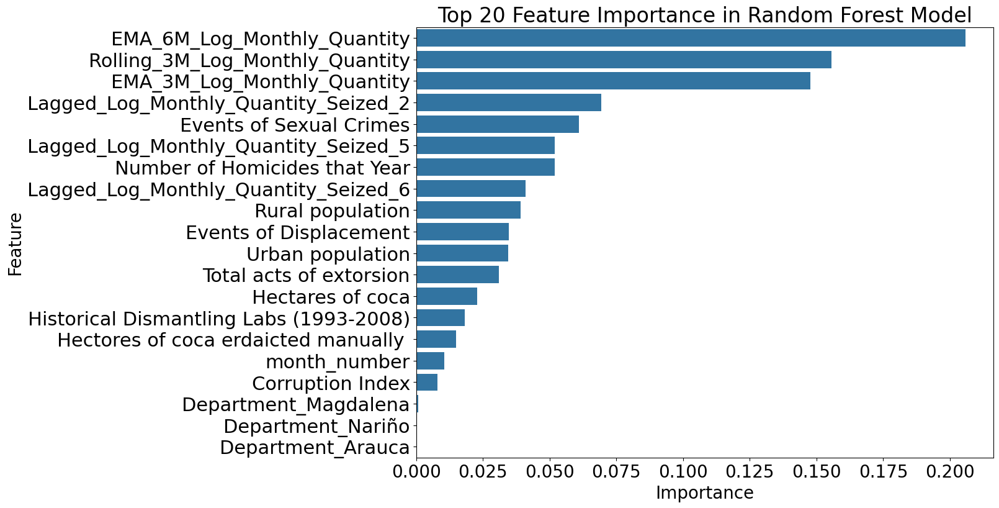

In [ ]:
soc_selected_features = [  'Number of Homicides that Year', 'Events of Sexual Crimes', 'Rural population', 'Urban population', 'Events of Displacement', 'Hectares of coca', 'Percent of Total Corruption Cases for That Year', 'Historical Dismantling Labs (1993-2008)', 'Hectores of coca erdaicted manually ', 'Total acts of extorsion']

selected_lag = ['Lagged_Log_Monthly_Quantity_Seized_2',
       'Lagged_Log_Monthly_Quantity_Seized_5', 'EMA_3M_Log_Monthly_Quantity', 'EMA_6M_Log_Monthly_Quantity',
       'Lagged_Log_Monthly_Quantity_Seized_6',
       'Rolling_3M_Log_Monthly_Quantity']
rf_dept_features = ['Department_Nariño', 'Department_Arauca', 'Department_Vaupés', 'Department_Magdalena']

rf_features = ['month_number', 'Log Monthly Quantity Seized (kg)'] + soc_selected_features + rf_dept_features + selected_lag

rf_train = train[rf_features]
rf_val = val[rf_features]
rf_test = test[rf_features]
rf_final_train = final_train[rf_features]

randomForest(rf_final_train, rf_test)

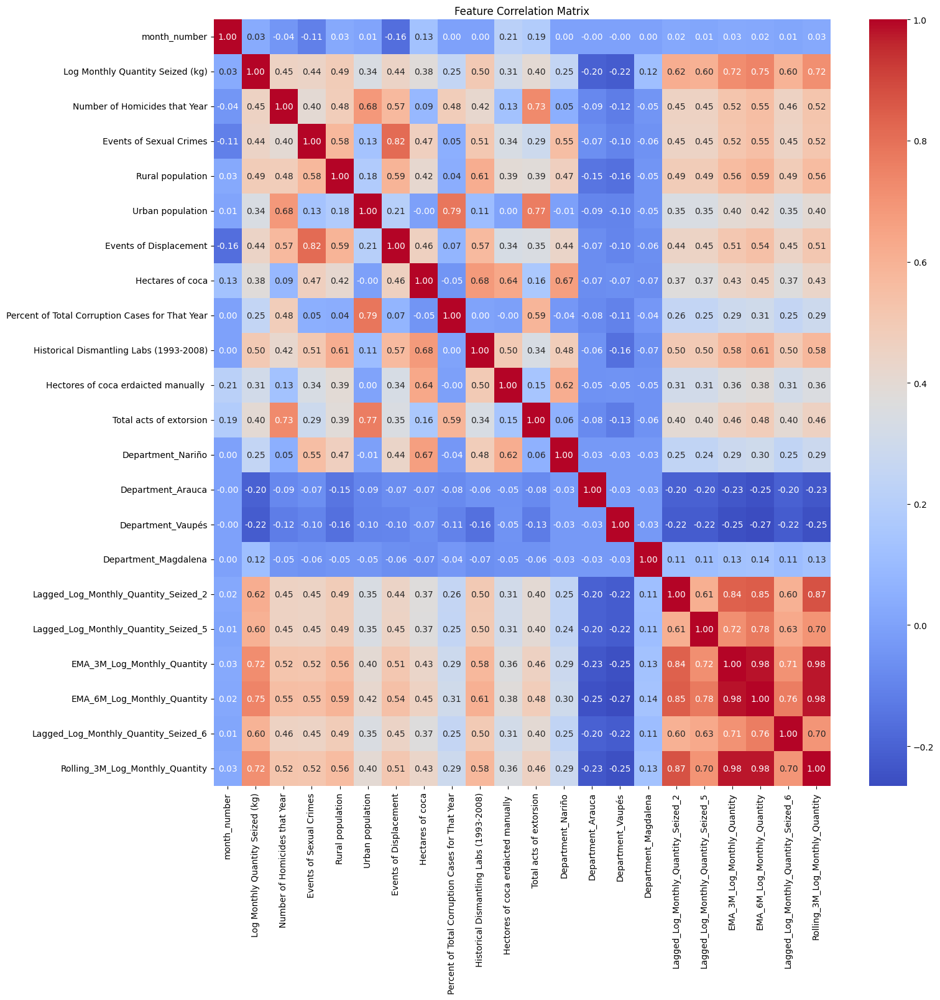

                                            Feature         VIF
19                      EMA_6M_Log_Monthly_Quantity  124.253649
18                      EMA_3M_Log_Monthly_Quantity   55.220171
21                  Rolling_3M_Log_Monthly_Quantity   42.704682
5                                  Urban population    5.525463
2                     Number of Homicides that Year    4.620813
6                            Events of Displacement    4.559497
16             Lagged_Log_Monthly_Quantity_Seized_2    4.394525
3                           Events of Sexual Crimes    4.133318
1                  Log Monthly Quantity Seized (kg)    4.031796
11                          Total acts of extorsion    3.773883
17             Lagged_Log_Monthly_Quantity_Seized_5    3.710346
7                                  Hectares of coca    3.411433
0                                      month_number    3.376380
9           Historical Dismantling Labs (1993-2008)    3.375986
20             Lagged_Log_Monthly_Quanti

In [ ]:
getCorrMatrix(rf_features, final_train, 16, 16)
vif_df = calculate_vif(final_train[rf_features])
print(vif_df)


In [ ]:
soc_selected_features = [  'Number of Homicides that Year', 'Events of Sexual Crimes', 'Rural population', 'Urban population', 'Events of Displacement', 'Hectares of coca', 'Percent of Total Corruption Cases for That Year', 'Historical Dismantling Labs (1993-2008)', 'Hectores of coca erdaicted manually ', 'Total acts of extorsion']

selected_lag = ['Lagged_Log_Monthly_Quantity_Seized_2',
       'Lagged_Log_Monthly_Quantity_Seized_5', 'EMA_3M_Log_Monthly_Quantity', 'EMA_6M_Log_Monthly_Quantity',
       'Lagged_Log_Monthly_Quantity_Seized_6',
       'Rolling_3M_Log_Monthly_Quantity']
rf_dept_features = ['Department_Nariño', 'Department_Arauca', 'Department_Vaupés', 'Department_Magdalena']

rf_features = ['month_number', 'Log Monthly Quantity Seized (kg)'] + soc_selected_features + rf_dept_features + selected_lag

rf_train = train[rf_features]
rf_val = val[rf_features]
rf_test = test[rf_features]
rf_final_train = final_train[rf_features]

randomForest(rf_final_train, rf_test)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
rf_feature_importances, rf_mse_df, vichada_predictions = randomForest(rf_final_train, rf_test)

NameError: name 'rf_final_train' is not defined

In [ ]:
  #@CITATION: Code adapted from ChatGPT
  def randomForest(train, test):
  # random forest
  X_train = train.drop(columns=['Log Monthly Quantity Seized (kg)'])
  y_train = train['Log Monthly Quantity Seized (kg)']
  X_test = test.drop(columns=['Log Monthly Quantity Seized (kg)'])
  y_test = test['Log Monthly Quantity Seized (kg)']
  model = RandomForestRegressor(n_estimators=500,
    max_depth=9,                      # Slightly deeper trees
    min_samples_split=5,             # Lower threshold for splits
    min_samples_leaf=15,              # Smaller leaf size
    max_features='sqrt', random_state=42)
  model.fit(X_train, y_train)

  # Get feature importances
  importance_df = pd.DataFrame({
      'Feature': X_train.columns,
      'Importance': model.feature_importances_
  })

  # Sort by importance
  importance_df = importance_df.sort_values(by='Importance', ascending=False)

  y_pred = model.predict(X_test)

  y_pred_train = model.predict(X_train)
  mse_train = mean_squared_error(y_train, y_pred_train)

  # evals
  mae = mean_absolute_error(y_test, y_pred)
  mse = mean_squared_error(y_test, y_pred)
  r2 = r2_score(y_test, y_pred)

  #print(f'Mean Absolute Error (MAE): {mae}')
  print("RANDOM FOREST: ")
  print(f'Training Mean Squared Error (MSE): {mse_train}')
  print(f'Testing Mean Squared Error (MSE): {mse}')
  print(f'R-squared: {r2}')

   # Residual Plot and Prediction vs Actual
  fig, axes = plt.subplots(1, 2, figsize=(18, 8))

  # Residual Plot
  residuals = y_test - y_pred
  sns.scatterplot(x=y_pred, y=residuals, ax=axes[0])
  axes[0].axhline(0, color='r', linestyle='--', lw=2)
  axes[0].set_xlabel("Predicted Values (Log Scale)", fontsize=22)
  axes[0].set_ylabel("Residuals (Log Scale)", fontsize=22)
  axes[0].tick_params(axis='x', labelsize=16)  # Font size for x-axis ticks
  axes[0].tick_params(axis='y', labelsize=16)  # Font size for y-axis ticks
  axes[0].set_title("Residual Plot", fontsize=24)

  # Prediction vs Actual
  sns.scatterplot(x=y_test, y=y_pred, ax=axes[1])
  axes[1].plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
  axes[1].set_xlabel("Actual Log Monthly Quantity Seized (kg)", fontsize=22)
  axes[1].set_ylabel("Predicted Log Monthly Quantity Seized (kg)", fontsize=22)
  axes[1].tick_params(axis='x', labelsize=16)  # Font size for x-axis ticks
  axes[1].tick_params(axis='y', labelsize=16)  # Font size for y-axis ticks
  axes[1].set_title("Predicted vs Actual", fontsize=24)

  plt.tight_layout()
  plt.show()

  # Distribution of Predictions and Error Distribution
  fig, axes = plt.subplots(1, 2, figsize=(18, 8))

  # Distribution of Predictions
  sns.histplot(y_pred, bins=30, kde=True, ax=axes[0])
  axes[0].set_xlabel("Predicted Log Monthly Quantity Seized (kg)", fontsize=22)
  axes[0].set_ylabel("Count", fontsize=22)
  axes[0].set_title("Distribution of Predicted Log Monthly Quantity Seized (kg)", fontsize=24)
  axes[0].tick_params(axis='x', labelsize=16)  # Font size for x-axis ticks
  axes[0].tick_params(axis='y', labelsize=16)  # Font size for y-axis ticks

  # Error Distribution
  sns.histplot(residuals, bins=30, kde=True, ax=axes[1])
  axes[1].set_xlabel("Residuals (Error)", fontsize=22)
  axes[1].set_ylabel("Count", fontsize=22)
  axes[1].set_title("Distribution of Prediction Errors (Residuals)", fontsize=22)
  axes[1].tick_params(axis='x', labelsize=16)  # Font size for x-axis ticks
  axes[1].tick_params(axis='y', labelsize=16)  # Font size for y-axis ticks

  plt.tight_layout()
  plt.show()

  # Top 20 Feature Importance
  feature_importances = pd.DataFrame({
      'Feature': X_train.columns,
      'Importance': model.feature_importances_
  }).sort_values(by='Importance', ascending=False).head(20)

  feature_importances = feature_importances.replace('Percent of Total Corruption Cases for That Year', 'Corruption Index')

  plt.figure(figsize=(12, 9))
  sns.barplot(x="Importance", y="Feature", data=feature_importances)
  plt.title("Top 20 Feature Importance in Random Forest Model", fontsize=24)
  plt.xlabel("Importance", fontsize=20)
  plt.ylabel("Feature", fontsize=20)
  plt.xticks(fontsize=20)
  plt.yticks(fontsize=20)
  plt.show()

  # Comparison of Actual vs Predicted
  comparison_df = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})
  comparison_df.sort_index(inplace=True)

  plt.figure(figsize=(14, 8))
  plt.plot(comparison_df.index, comparison_df['Actual'], label='Actual', color='blue', linewidth=2)
  plt.plot(comparison_df.index, comparison_df['Predicted'], label='Predicted', color='orange', linewidth=2)
  plt.xlabel("Index", fontsize=20)
  plt.ylabel("Log Monthly Quantity Seized (kg)", fontsize=20)
  plt.title("Actual vs Predicted Log Monthly Quantity Seized (kg)", fontsize=24)
  plt.xticks(fontsize=16)
  plt.yticks(fontsize=16)
  plt.legend(fontsize=15)
  plt.show()




    # Extract department columns from department_test
  department_columns = [col for col in department_test.columns if col.startswith('Department_')]
  dept_names = [col.replace('Department_', '') for col in department_columns]

  # Filter for month numbers 107–131
  filtered_indices = department_test[(department_test['month_number'] >= 107) & (department_test['month_number'] <= 131)].index
  filtered_months = department_test.loc[filtered_indices, 'month_number']

  # Plot Actual vs Predicted for each department
  for i, dept_col in enumerate(department_columns):
      # Get indices for this department within the filtered range
      dept_indices = department_test[(department_test[dept_col] == 1) &
                                  (department_test['month_number'] >= 107) &
                                  (department_test['month_number'] <= 131)].index

      # Filter actual and predicted values for this department
      actual = y_test.loc[dept_indices]
      predicted = y_pred[dept_indices]
      months = department_test.loc[dept_indices, 'month_number']  # Get corresponding months for x-axis

      # Skip departments with no data in the filtered range
      if len(actual) == 0:
          continue

      # Create plot
      plt.figure(figsize=(10, 6))
      plt.plot(months, actual, label='Actual', linewidth=2, color='blue')
      plt.plot(months, predicted, label='Predicted', linewidth=2, linestyle='--', color='orange')

      # Titles and labels
      plt.title(f"Actual vs Predicted - {dept_names[i]} - Random Forest", fontsize=22)
      plt.xlabel("Month Number", fontsize=20)
      plt.ylabel("Log Monthly Quantity Seized (kg)", fontsize=20)
      plt.xticks(fontsize=16)
      plt.yticks(fontsize=16)
      plt.legend(fontsize=16)
      plt.tight_layout()
      plt.show()

# Extract predictions for "Vichada" during months 108–131
  vichada_indices = department_test[
      (department_test['Department_Vichada'] == 1) &
      (department_test['month_number'] >= 108) &
      (department_test['month_number'] <= 131)
  ].index

  vichada_predictions = pd.DataFrame({
      'Month Number': department_test.loc[vichada_indices, 'month_number'],
      'Actual': y_test.loc[vichada_indices],
      'Predicted': y_pred[vichada_indices]
  })
  # Calculate MSE by Department (Filtered Months)
  mse_by_department = []

  for i, dept_col in enumerate(department_columns):
      # Get indices for this department within the filtered range
      dept_indices = department_test[(department_test[dept_col] == 1) &
                                  (department_test['month_number'] >= 107) &
                                  (department_test['month_number'] <= 131)].index

      # Filter actual and predicted values
      actual = y_test.loc[dept_indices]
      predicted = y_pred[dept_indices]

      # Skip departments with no data in the filtered range
      if len(actual) == 0:
          continue

      # Calculate MSE for this department
      mse = mean_squared_error(actual, predicted)
      mse_by_department.append({'Department': dept_names[i], 'MSE': mse})

  # Convert to DataFrame and sort by MSE
  mse_df = pd.DataFrame(mse_by_department).sort_values(by='MSE', ascending=True)
  mse_df = mse_df.replace('Archipiélago de San Andrés, Providencia y Santa Catalina', 'San_Andrés...')
  # Print the MSE table
  print(mse_df)

  # Optional: Bar plot for MSE
  plt.figure(figsize=(12, 8))
  plt.barh(mse_df['Department'], mse_df['MSE'])
  plt.xlabel('Log Mean Squared Error (MSE)', fontsize=20)
  plt.xticks(fontsize=18)
  plt.yticks(fontsize=18)
  plt.ylabel('Department', fontsize=20)
  plt.title('Test MSE by Department - Random Forest ', fontsize=20)
  plt.tight_layout()
  plt.show()

  return feature_importances, mse_df, vichada_predictions


###Random Forest Hyperparameter tuning

In [ ]:
from sklearn.model_selection import GridSearchCV
  #@CITATION: Code adapted from ChatGPT
def rf_gridsearch(train, test):
    # Split data into features and target
    X_train = train.drop(columns=['Log Monthly Quantity Seized (kg)'])
    y_train = train['Log Monthly Quantity Seized (kg)']
    X_test = test.drop(columns=['Log Monthly Quantity Seized (kg)'])
    y_test = test['Log Monthly Quantity Seized (kg)']

    # Initialize Random Forest Regressor
    rf_model = RandomForestRegressor(max_features='sqrt', random_state=42)

    # Define hyperparameter grid
    param_grid = {
        'n_estimators': [100, 300, 500],
        'max_depth': [1, 5, 9, 10, 11],      # Maximum depth of trees
        'min_samples_split': [5, 10, 11, 15],      # Minimum samples required to split a node
        'min_samples_leaf': [5, 10, 11, 15]}



    # Perform Grid Search with 5-fold cross-validation
    grid_search = GridSearchCV(
        estimator=rf_model,
        param_grid=param_grid,
        scoring='neg_mean_squared_error',  # Minimize MSE
        cv=5,
        verbose=1,
        n_jobs=-1  # Use all available cores
    )

    # Fit the model
    grid_search.fit(X_train, y_train)

    # Best hyperparameters
    print(f"Best Parameters: {grid_search.best_params_}")

    # Evaluate the best model
    best_model = grid_search.best_estimator_
    y_pred = best_model.predict(X_test)

    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    print(f"Testing MSE: {mse}")
    print(f"R-squared (R²): {r2}")

    # Create a DataFrame with all results
    results = pd.DataFrame(grid_search.cv_results_)

    # Select and simplify columns for clarity
    results = results[[
        'param_n_estimators',
        'param_max_depth',
        'param_min_samples_split',
        'param_min_samples_leaf',
        'mean_test_score',
        'std_test_score',
        'rank_test_score'
    ]]

    # Sort by rank
    results = results.sort_values(by='rank_test_score')

    # Convert negative MSE to positive for readability
    results['mean_test_score'] = -results['mean_test_score']

    # Display results
    print(results)

    # Save to CSV for external use
    results.to_csv('gridsearch_results.csv', index=False)

    return best_model, results

best_model, results = rf_gridsearch(rf_train, rf_val)

Fitting 5 folds for each of 240 candidates, totalling 1200 fits
Best Parameters: {'max_depth': 5, 'min_samples_leaf': 11, 'min_samples_split': 5, 'n_estimators': 100}
Testing MSE: 3.7943739815843367
R-squared (R²): 0.5355478462419081
     param_n_estimators  param_max_depth  param_min_samples_split  \
78                  100                5                       11   
75                  100                5                       10   
72                  100                5                        5   
81                  100                5                       15   
134                 500                9                        5   
..                  ...              ...                      ...   
37                  300                1                        5   
13                  300                1                        5   
19                  300                1                       11   
22                  300                1                       15   
25     

In [ ]:
pd.set_option('display.max_rows', None)  # Show all rows
pd.set_option('display.max_columns', None)  # Show all columns (optional)

In [ ]:
results.tail(100)

,param_n_estimators,param_max_depth,param_min_samples_split,param_min_samples_leaf,mean_test_score,std_test_score,rank_test_score
127,300,9,11,11,3.742784,0.628416,140
130,300,9,15,11,3.742784,0.628416,140
124,300,9,10,11,3.742784,0.628416,140
54,100,5,11,5,3.744730,0.617175,144
50,500,5,5,5,3.744739,0.602422,145
53,500,5,10,5,3.744739,0.602422,145
51,100,5,10,5,3.746913,0.627176,147
48,100,5,5,5,3.746913,0.627176,147
180,100,10,5,15,3.747387,0.655619,149
183,100,10,10,15,3.747387,0.655619,149


In [ ]:
from sklearn.model_selection import GridSearchCV
  #@CITATION: Code adapted from ChatGPT
def rf_gridsearch(train, test):
    # Split data into features and target
    X_train = train.drop(columns=['Log Monthly Quantity Seized (kg)'])
    y_train = train['Log Monthly Quantity Seized (kg)']
    X_test = test.drop(columns=['Log Monthly Quantity Seized (kg)'])
    y_test = test['Log Monthly Quantity Seized (kg)']

    # Initialize Random Forest Regressor
    rf_model = RandomForestRegressor(max_features='sqrt', random_state=42)

    # Define hyperparameter grid
    param_grid = {
        'n_estimators': [400, 500, 600],
        'max_depth': [9],      # Maximum depth of trees
        'min_samples_split': [5],      # Minimum samples required to split a node
        'min_samples_leaf': [15]}



    # Perform Grid Search with 5-fold cross-validation
    grid_search = GridSearchCV(
        estimator=rf_model,
        param_grid=param_grid,
        scoring='neg_mean_squared_error',  # Minimize MSE
        cv=5,
        verbose=1,
        n_jobs=-1  # Use all available cores
    )

    # Fit the model
    grid_search.fit(X_train, y_train)

    # Best hyperparameters
    print(f"Best Parameters: {grid_search.best_params_}")

    # Evaluate the best model
    best_model = grid_search.best_estimator_
    y_pred = best_model.predict(X_test)

    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    print(f"Testing MSE: {mse}")
    print(f"R-squared (R²): {r2}")

    # Create a DataFrame with all results
    results = pd.DataFrame(grid_search.cv_results_)

    # Select and simplify columns for clarity
    results = results[[
        'param_n_estimators',
        'param_max_depth',
        'param_min_samples_split',
        'param_min_samples_leaf',
        'mean_test_score',
        'std_test_score',
        'rank_test_score'
    ]]

    # Sort by rank
    results = results.sort_values(by='rank_test_score')

    # Convert negative MSE to positive for readability
    results['mean_test_score'] = -results['mean_test_score']

    # Display results
    print(results)

    # Save to CSV for external use
    results.to_csv('gridsearch_results.csv', index=False)

    return best_model, results

best_model, results2 = rf_gridsearch(rf_train, rf_val)

Fitting 5 folds for each of 3 candidates, totalling 15 fits
Best Parameters: {'max_depth': 9, 'min_samples_leaf': 15, 'min_samples_split': 5, 'n_estimators': 600}
Testing MSE: 3.789742760318055
R-squared (R²): 0.5361147330859815
   param_n_estimators  param_max_depth  param_min_samples_split  \
2                 600                9                        5   
1                 500                9                        5   
0                 400                9                        5   

   param_min_samples_leaf  mean_test_score  std_test_score  rank_test_score  
2                      15         3.702103        0.624809                1  
1                      15         3.703762        0.617535                2  
0                      15         3.707579        0.621653                3  


In [ ]:
results2.head(15)

,param_n_estimators,param_max_depth,param_min_samples_split,param_min_samples_leaf,mean_test_score,std_test_score,rank_test_score
2,600,9,5,15,3.702103,0.624809,1
1,500,9,5,15,3.703762,0.617535,2
0,400,9,5,15,3.707579,0.621653,3


###XGBoost

In [ ]:
from xgboost import XGBRegressor
from sklearn.feature_selection import RFE
  #@CITATION: Code adapted from ChatGPT
def xgb_recursive_feature_selection(train, test, n_features=20):
    # Split data into features and target
    X_train = train.drop(columns=['Log Monthly Quantity Seized (kg)'])
    y_train = train['Log Monthly Quantity Seized (kg)']
    X_test = test.drop(columns=['Log Monthly Quantity Seized (kg)'])
    y_test = test['Log Monthly Quantity Seized (kg)']

    # Initialize XGBoost Regressor
    # Initialize XGBoost Regressor
    xgb_model = XGBRegressor(
          objective='reg:squarederror',
    random_state=42,
    n_estimators=600,           # More trees for deeper exploration
    learning_rate=0.01,         # Smaller steps to prevent overfitting
    colsample_bytree=1.0,       # Use all features at each split
    colsample_bylevel=0.9,      # Consider more features at each level
    reg_lambda=0.5,             # Reduce L2 regularization
    min_child_weight=0.5,       # Allow smaller splits
    gamma=0.0
    )

    # Store feature names
    features = list(X_train.columns)

    # Iteratively drop features until desired number is reached
    while len(features) > n_features:
        # Train model
        xgb_model.fit(X_train[features], y_train)

        # Get feature importances
        importances = xgb_model.feature_importances_

        # Find least important feature
        least_important_idx = np.argmin(importances)
        least_important_feature = features[least_important_idx]
        print(f"Dropping Feature: {least_important_feature}")

        # Drop least important feature
        features.remove(least_important_feature)

    # Train final model on selected features
    xgb_model.fit(X_train[features], y_train)
    y_pred = xgb_model.predict(X_test[features])

    # Evaluate model performance
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    print(f"\nFinal Model with {len(features)} Features")
    print(f"Testing MSE: {mse}")
    print(f"R-squared (R²): {r2}")

    # Get final feature importance
    importances = xgb_model.feature_importances_
    importance_df = pd.DataFrame({
        'Feature': features,
        'Importance': importances
    })

    # Sort by importance
    importance_df = importance_df.sort_values(by='Importance', ascending=False)

    # Plot feature importance
    plt.figure(figsize=(12, 6))
    plt.barh(importance_df['Feature'], importance_df['Importance'], color='royalblue')
    plt.xlabel('Feature Importance (Gain)')
    plt.ylabel('Features')
    plt.title(f'Top {n_features} Features by Importance - XGBoost RFE (Manual)')
    plt.gca().invert_yaxis()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

Dropping Feature: Events of Confinement
Dropping Feature: Total acts against police
Dropping Feature: Area km2
Dropping Feature: Events of Mine Explosions
Dropping Feature: Events of Kiddnapping
Dropping Feature: Mean International Wealth Index

Final Model with 20 Features
Testing MSE: 4.674627065460136
R-squared (R²): 0.4278000484121305


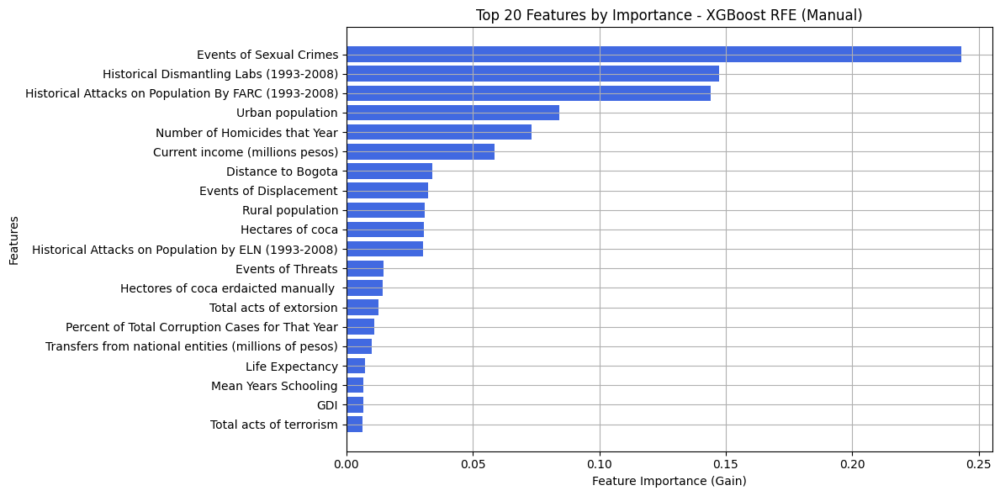

In [ ]:
#FIRST TRY JUST SOCIOECONOMIC FEATURES - get a sense of most important
lag_features = ['Lagged_Log_Monthly_Quantity_Seized_1', 'Lagged_Log_Monthly_Quantity_Seized_2', 'Lagged_Log_Monthly_Quantity_Seized_3', 'Lagged_Log_Monthly_Quantity_Seized_4', 'Lagged_Log_Monthly_Quantity_Seized_5', 'Lagged_Log_Monthly_Quantity_Seized_6', 'Rolling_3M_Log_Monthly_Quantity', 'Rolling_6M_Log_Monthly_Quantity', 'Rolling_3M_Std_Log_Monthly_Quantity', 'Rolling_6M_Std_Log_Monthly_Quantity', 'Rolling_3M_Min_Log_Monthly_Quantity', 'Rolling_6M_Min_Log_Monthly_Quantity', 'Rolling_3M_Max_Log_Monthly_Quantity', 'Rolling_6M_Max_Log_Monthly_Quantity', 'Rolling_3M_Range_Log_Monthly_Quantity', 'Rolling_6M_Range_Log_Monthly_Quantity', 'EMA_3M_Log_Monthly_Quantity', 'EMA_6M_Log_Monthly_Quantity', 'Momentum_3_6', 'Cumulative_Log_Monthly_Quantity_Seized_Per_Year', 'season_Spring', 'season_Summer', 'season_Winter', 'Growth_Rate_Lag_1_2', 'Growth_Rate_Lag_2_3', 'Growth_Rate_Lag_1_3']
all_features = [ 'Log Monthly Quantity Seized (kg)'] + socioeconomic_to_keep + bg_features_to_keep + cg_features_to_keep + v_features_to_keep


rf_train = train[all_features]
rf_val = val[all_features]
rf_test = test[all_features]
rf_final_train = final_train[all_features]
importance_df = xgb_recursive_feature_selection(rf_train, rf_val, n_features=20)



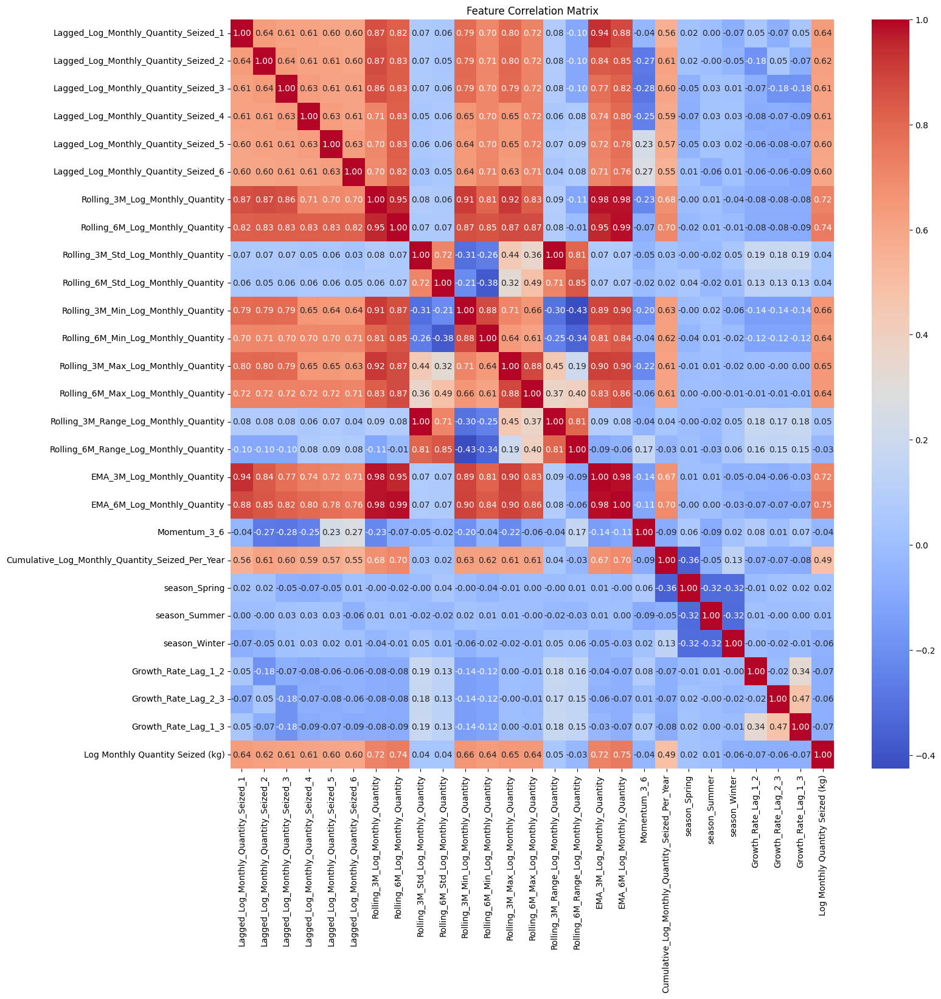

In [ ]:
getCorrMatrix(lag_features + ['Log Monthly Quantity Seized (kg)'], final_train, 16, 16)

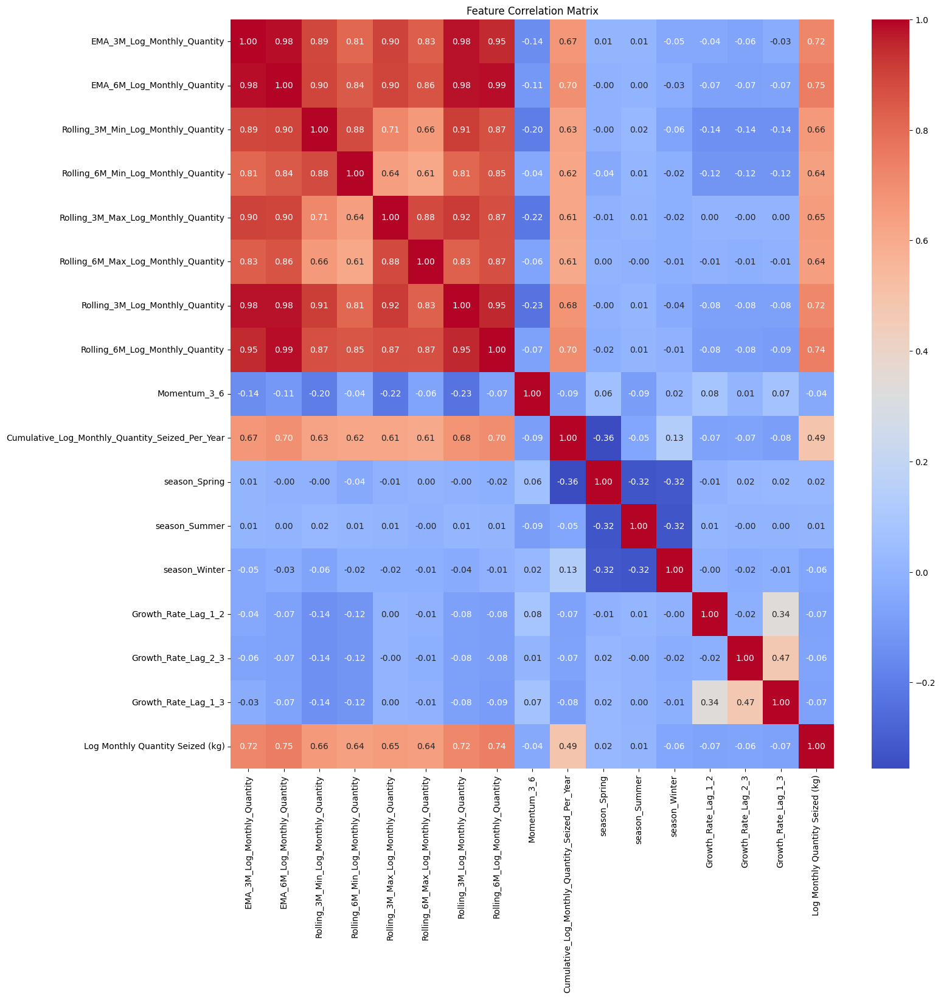

In [ ]:
getCorrMatrix(lag_features_to_keep + ['Log Monthly Quantity Seized (kg)'], final_train, 16, 16)


Final Model with 20 Features
Testing MSE: 4.537936532648874
R-squared (R²): 0.4445317181607259


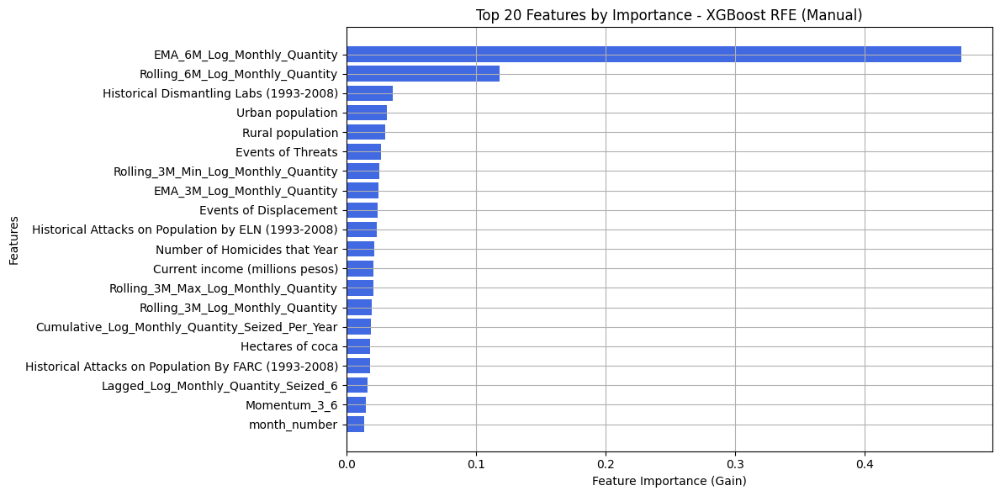

In [ ]:
soc_to_keep = ['Number of Homicides that Year',
 'Hectares of coca',
 'Current income (millions pesos)',
 'Rural population',
 'Urban population',
 'Historical Attacks on Population By FARC (1993-2008)',
 'Historical Attacks on Population by ELN (1993-2008)',
 'Historical Dismantling Labs (1993-2008)',  'Events of Displacement',  'Events of Threats']

lag_to_keep = ['Lagged_Log_Monthly_Quantity_Seized_6', 'Rolling_3M_Log_Monthly_Quantity', 'Rolling_6M_Log_Monthly_Quantity', 'Rolling_3M_Max_Log_Monthly_Quantity', 'Rolling_3M_Min_Log_Monthly_Quantity',
                'EMA_3M_Log_Monthly_Quantity', 'EMA_6M_Log_Monthly_Quantity', 'Momentum_3_6', 'Cumulative_Log_Monthly_Quantity_Seized_Per_Year']

all_features = ['month_number', 'Log Monthly Quantity Seized (kg)'] + soc_to_keep + lag_to_keep

xg_train = train[all_features]
xg_val = val[all_features]
xg_test = test[all_features]
xg_final_train = final_train[all_features]

importance_df = xgb_recursive_feature_selection(xg_train, xg_val, n_features=20)


Final Model with 18 Features
Testing MSE: 4.190518698334878
R-squared (R²): 0.48705756357929786


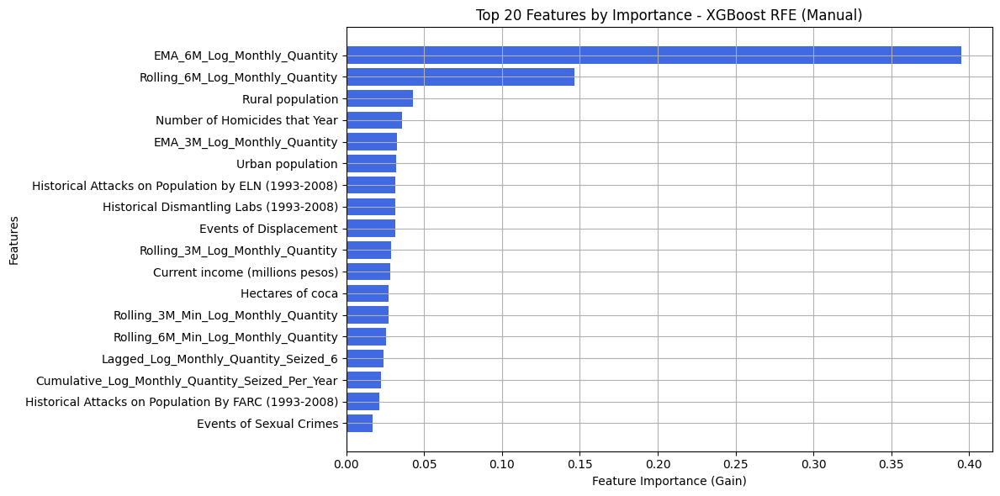

In [ ]:
selected_soc = ['Events of Sexual Crimes', 'Historical Dismantling Labs (1993-2008)', 'Historical Attacks on Population By FARC (1993-2008)', 'Historical Attacks on Population by ELN (1993-2008)', 'Urban population', 'Current income (millions pesos)', 'Number of Homicides that Year', 'Events of Displacement', 'Rural population', 'Hectares of coca']
lag_to_keep = [  'Rolling_3M_Min_Log_Monthly_Quantity',
 'Rolling_6M_Min_Log_Monthly_Quantity',
 'EMA_6M_Log_Monthly_Quantity', 'Cumulative_Log_Monthly_Quantity_Seized_Per_Year','Lagged_Log_Monthly_Quantity_Seized_6', 'Rolling_3M_Log_Monthly_Quantity',
 'Rolling_6M_Log_Monthly_Quantity', 'EMA_3M_Log_Monthly_Quantity',  ]
all_features = [ 'Log Monthly Quantity Seized (kg)'] + selected_soc + lag_to_keep


xg_train = train[all_features]
xg_val = val[all_features]
xg_test = test[all_features]
xg_final_train = final_train[all_features]
importance_df = xgb_recursive_feature_selection(xg_train, xg_val, n_features=20)

Dropping Feature: Department_Antioquia
Dropping Feature: Department_Archipiélago de San Andrés, Providencia y Santa Catalina
Dropping Feature: Department_Bogotá D.C.
Dropping Feature: Department_Atlántico
Dropping Feature: Department_Chocó
Dropping Feature: Department_Guainía
Dropping Feature: Department_Nariño
Dropping Feature: Department_Caquetá
Dropping Feature: Department_Valle del Cauca
Dropping Feature: Department_Vaupés
Dropping Feature: Department_Putumayo
Dropping Feature: Department_Tolima
Dropping Feature: Department_Norte de Santander
Dropping Feature: Department_Guaviare
Dropping Feature: Department_Vichada
Dropping Feature: Department_Risaralda
Dropping Feature: Department_Arauca
Dropping Feature: Department_Santander
Dropping Feature: Department_Cauca
Dropping Feature: Events of Sexual Crimes
Dropping Feature: Historical Attacks on Population By FARC (1993-2008)
Dropping Feature: Department_Córdoba
Dropping Feature: Department_Casanare
Dropping Feature: Historical Disman

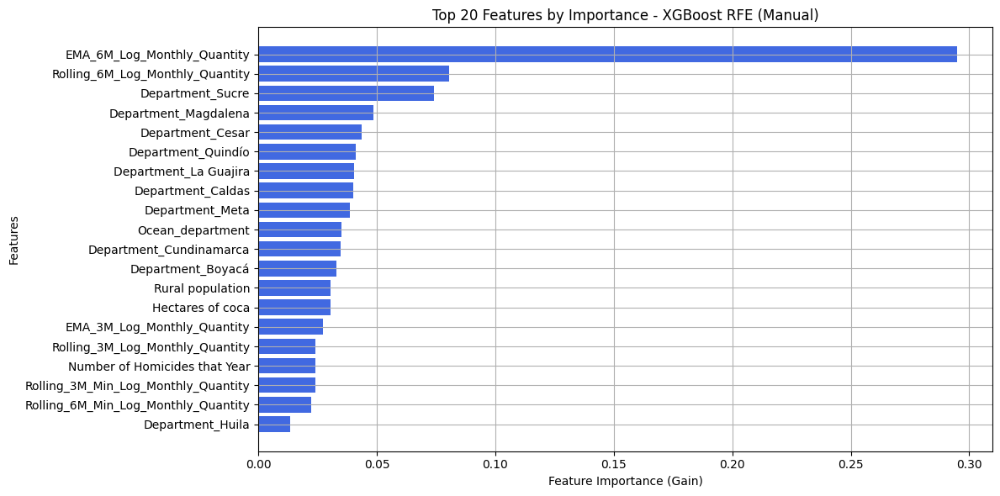

In [ ]:
selected_soc = ['Events of Sexual Crimes', 'Historical Dismantling Labs (1993-2008)', 'Historical Attacks on Population By FARC (1993-2008)', 'Historical Attacks on Population by ELN (1993-2008)', 'Urban population', 'Current income (millions pesos)', 'Number of Homicides that Year', 'Events of Displacement', 'Rural population', 'Hectares of coca']
lag_to_keep = [  'Rolling_3M_Min_Log_Monthly_Quantity',
 'Rolling_6M_Min_Log_Monthly_Quantity',
 'EMA_6M_Log_Monthly_Quantity', 'Cumulative_Log_Monthly_Quantity_Seized_Per_Year','Lagged_Log_Monthly_Quantity_Seized_6', 'Rolling_3M_Log_Monthly_Quantity',
 'Rolling_6M_Log_Monthly_Quantity', 'EMA_3M_Log_Monthly_Quantity',  ]
all_features = [ 'Log Monthly Quantity Seized (kg)'] + selected_soc + lag_to_keep + deptfeatures


xg_train = train[all_features]
xg_val = val[all_features]
xg_test = test[all_features]
xg_final_train = final_train[all_features]
importance_df = xgb_recursive_feature_selection(xg_train, xg_val, n_features=20)

XGBoost
Training MSE: 3.092347087443982
Testing Mean Squared Error (MSE): 3.8326965635938293
R-squared (R²): 0.5308569523452427


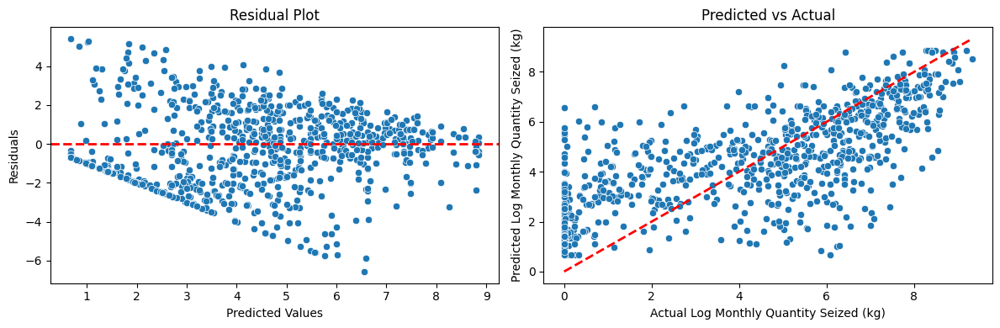

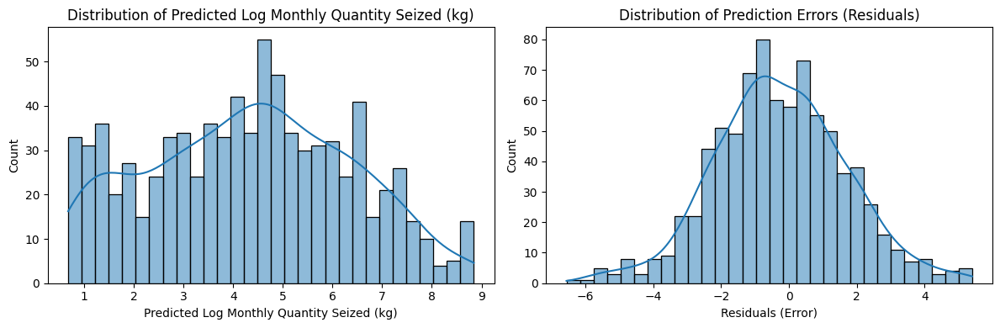

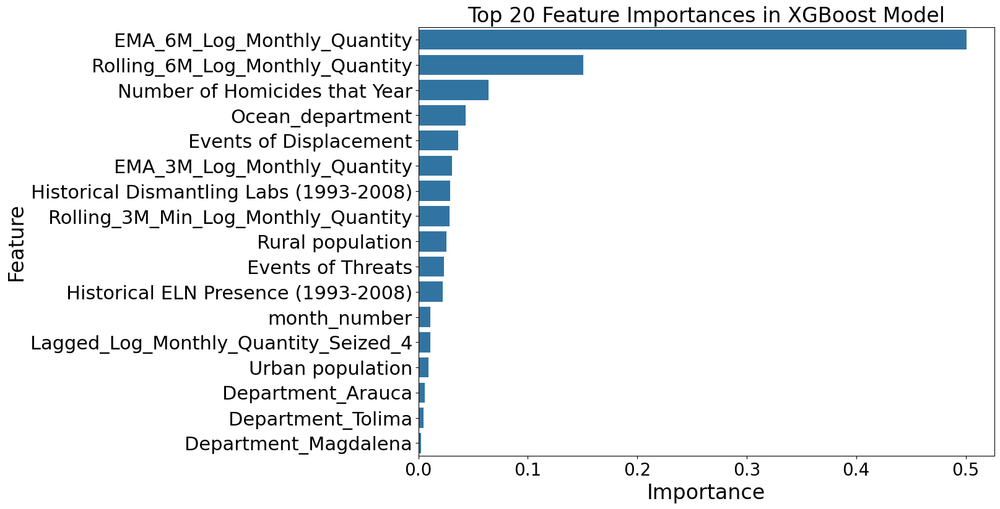

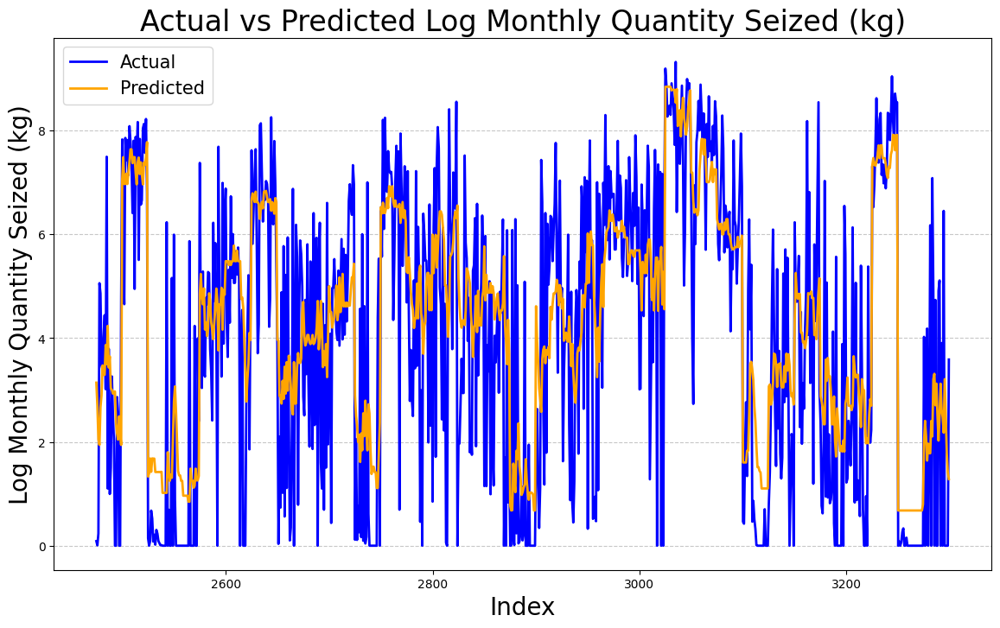

KeyError: "None of [Index([25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42,\n       43, 44, 45, 46, 47, 48, 49],\n      dtype='int64')] are in the [index]"

In [ ]:
xg_dept_features = [ 'Department_Magdalena',  'Department_Tolima', 'Department_Arauca']

all_features = ['month_number', 'Log Monthly Quantity Seized (kg)'] + [ 'Historical Dismantling Labs (1993-2008)', 'Number of Homicides that Year', 'Rural population', 'Ocean_department',
 'Urban population', 'Events of Displacement',  'Events of Threats',   'Historical Attacks on Population by ELN (1993-2008)'] + [
                 'EMA_6M_Log_Monthly_Quantity', 'Rolling_6M_Log_Monthly_Quantity', 'EMA_3M_Log_Monthly_Quantity',  'Rolling_3M_Min_Log_Monthly_Quantity', 'Lagged_Log_Monthly_Quantity_Seized_4'] + xg_dept_features

xg_train = train[all_features]
xg_val = val[all_features]
xg_test = test[all_features]
xg_final_train = final_train[all_features]
XGBoost(xg_train, xg_val)


In [ ]:
xg_dept_features = [ 'Department_Magdalena',  'Department_Tolima', 'Department_Arauca']

all_features = ['month_number', 'Log Monthly Quantity Seized (kg)'] + [ 'Historical Dismantling Labs (1993-2008)', 'Number of Homicides that Year', 'Rural population', 'Ocean_department',
 'Urban population', 'Events of Displacement',  'Events of Threats',   'Historical Attacks on Population by ELN (1993-2008)'] + [
                 'EMA_6M_Log_Monthly_Quantity', 'Rolling_6M_Log_Monthly_Quantity', 'EMA_3M_Log_Monthly_Quantity',  'Rolling_3M_Min_Log_Monthly_Quantity', 'Lagged_Log_Monthly_Quantity_Seized_4'] + xg_dept_features

xg_train = train[all_features]
xg_val = val[all_features]
xg_test = test[all_features]
xg_final_train = final_train[all_features]
xgboost_feature_importances, xgboost_mse_df = XGBoost(xg_final_train, xg_test)


Output hidden; open in https://colab.research.google.com to view.

In [ ]:
  #@CITATION: Code adapted from ChatGPT
  def XGBoost(train, test):
    # Prepare train and test data
    X_train = train.drop(columns=['Log Monthly Quantity Seized (kg)'])
    y_train = train['Log Monthly Quantity Seized (kg)']
    X_test = test.drop(columns=['Log Monthly Quantity Seized (kg)'])
    y_test = test['Log Monthly Quantity Seized (kg)']

    # Model setup
    xgb_model = xgb.XGBRegressor(
        objective='reg:squarederror', random_state=42,
        n_estimators=700, learning_rate=0.01,
        max_depth=2, min_child_weight=11
    )

    # Fit the model
    xgb_model.fit(X_train, y_train)

    # Predictions
    y_train_pred = xgb_model.predict(X_train)
    y_pred = xgb_model.predict(X_test)

    # Evaluate performance
    mse_train = mean_squared_error(y_train, y_train_pred)
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    print("XGBoost")
    print(f"Training MSE: {mse_train}")
    print(f"Testing MSE: {mse}")
    print(f"R-squared (R²): {r2}")

    # Residual Plot
    residuals = y_test - y_pred
    fig, axes = plt.subplots(1, 2, figsize=(18, 8))

    sns.scatterplot(x=y_pred, y=residuals, ax=axes[0])
    axes[0].axhline(0, color='r', linestyle='--', lw=2)
    axes[0].set_xlabel("Predicted Values (Log Scale)", fontsize=20)
    axes[0].set_ylabel("Residuals (Log Scale)", fontsize=20)
    axes[0].tick_params(axis='x', labelsize=18)
    axes[0].tick_params(axis='y', labelsize=18)
    axes[0].set_title("Residual Plot for XGBoost", fontsize=24)

    # Prediction vs Actual
    sns.scatterplot(x=y_test, y=y_pred, ax=axes[1])
    axes[1].plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
    axes[1].set_xlabel("Actual Log Monthly Quantity Seized (kg)", fontsize=20)
    axes[1].set_ylabel("Predicted Log Monthly Quantity Seized (kg)", fontsize=20)
    axes[1].tick_params(axis='x', labelsize=18)
    axes[1].tick_params(axis='y', labelsize=18)
    axes[1].set_title("Predicted vs Actual Plot for XGBoost", fontsize=24)

    plt.tight_layout()
    plt.show()

    # Feature Importances
    importances = xgb_model.feature_importances_
    feature_importances = pd.DataFrame({
        'Feature': X_train.columns,
        'Importance': importances
    }).sort_values(by='Importance', ascending=False).head(20)
    feature_importances = feature_importances.replace('Historical Attacks on Population by ELN (1993-2008)', 'Historical ELN Presence (1993-2008)')

    plt.figure(figsize=(11, 9))
    sns.barplot(x="Importance", y="Feature", data=feature_importances)
    plt.title("Top 20 Feature Importances in XGBoost Model", fontsize=22)
    plt.xlabel("Importance", fontsize=20)
    plt.ylabel("Feature", fontsize=20)
    plt.xticks(fontsize=18)
    plt.yticks(fontsize=18)
    plt.show()

    # Actual vs Predicted
    comparison_df = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})
    plt.figure(figsize=(12, 8))
    plt.plot(comparison_df.index, comparison_df['Actual'], label='Actual', color='blue', linewidth=2)
    plt.plot(comparison_df.index, comparison_df['Predicted'], label='Predicted', color='orange', linewidth=2)
    plt.title("Actual vs Predicted Log Monthly Quantity Seized (kg) for XGBoost", fontsize=22)
    plt.xlabel("Index", fontsize=20)
    plt.ylabel("Log Monthly Quantity Seized (kg)", fontsize=20)
    plt.legend(fontsize=16)
    plt.xticks(fontsize=18)
    plt.yticks(fontsize=18)
    plt.show()

      # Extract department columns from department_test
    department_columns = [col for col in department_test.columns if col.startswith('Department_')]
    dept_names = [col.replace('Department_', '') for col in department_columns]

    # Filter for month numbers 107–131
    filtered_indices = department_test[(department_test['month_number'] >= 107) & (department_test['month_number'] <= 131)].index
    filtered_months = department_test.loc[filtered_indices, 'month_number']

    # Plot Actual vs Predicted for each department
    for i, dept_col in enumerate(department_columns):
        # Get indices for this department within the filtered range
        dept_indices = department_test[(department_test[dept_col] == 1) &
                                    (department_test['month_number'] >= 107) &
                                    (department_test['month_number'] <= 131)].index

        # Filter actual and predicted values for this department
        actual = y_test.loc[dept_indices]
        predicted = y_pred[dept_indices]
        months = department_test.loc[dept_indices, 'month_number']  # Get corresponding months for x-axis

        # Skip departments with no data in the filtered range
        if len(actual) == 0:
            continue

        # Create plot
        plt.figure(figsize=(10, 6))
        plt.plot(months, actual, label='Actual', linewidth=2, color='blue')
        plt.plot(months, predicted, label='Predicted', linewidth=2, linestyle='--', color='orange')

        # Titles and labels
        plt.title(f"Actual vs Predicted - {dept_names[i]} - XGBoost", fontsize=22)
        plt.xlabel("Month Number", fontsize=20)
        plt.ylabel("Log Monthly Quantity Seized (kg)", fontsize=20)
        plt.xticks(fontsize=16)
        plt.yticks(fontsize=16)
        plt.legend(fontsize=16)
        plt.tight_layout()
        plt.show()

    # Calculate MSE by Department (Filtered Months)
    mse_by_department = []

    for i, dept_col in enumerate(department_columns):
        # Get indices for this department within the filtered range
        dept_indices = department_test[(department_test[dept_col] == 1) &
                                    (department_test['month_number'] >= 107) &
                                    (department_test['month_number'] <= 131)].index

        # Filter actual and predicted values
        actual = y_test.loc[dept_indices]
        predicted = y_pred[dept_indices]

        # Skip departments with no data in the filtered range
        if len(actual) == 0:
            continue

        # Calculate MSE for this department
        mse = mean_squared_error(actual, predicted)
        mse_by_department.append({'Department': dept_names[i], 'MSE': mse})

    # Convert to DataFrame and sort by MSE
    mse_df = pd.DataFrame(mse_by_department).sort_values(by='MSE', ascending=True)
    mse_df = mse_df.replace('Archipiélago de San Andrés, Providencia y Santa Catalina', 'San_Andrés...')
    # Print the MSE table
    print(mse_df)

    # Optional: Bar plot for MSE
    plt.figure(figsize=(12, 8))
    plt.barh(mse_df['Department'], mse_df['MSE'])
    plt.xlabel('Log Mean Squared Error (MSE)', fontsize=20)
    plt.xticks(fontsize=18)
    plt.yticks(fontsize=18)
    plt.ylabel('Department', fontsize=20)
    plt.title('Test MSE by Department - XGBoost ', fontsize=20)
    plt.tight_layout()
    plt.show()

    return feature_importances, mse_df

In [ ]:
deptfeatures

['Log Monthly Quantity Seized (kg)',
 'month_number',
 'Border_Department',
 'Ocean_department',
 'Department_Antioquia',
 'Department_Arauca',
 'Department_Archipiélago de San Andrés, Providencia y Santa Catalina',
 'Department_Atlántico',
 'Department_Bogotá D.C.',
 'Department_Bolívar',
 'Department_Boyacá',
 'Department_Caldas',
 'Department_Caquetá',
 'Department_Casanare',
 'Department_Cauca',
 'Department_Cesar',
 'Department_Chocó',
 'Department_Cundinamarca',
 'Department_Córdoba',
 'Department_Guainía',
 'Department_Guaviare',
 'Department_Huila',
 'Department_La Guajira',
 'Department_Magdalena',
 'Department_Meta',
 'Department_Nariño',
 'Department_Norte de Santander',
 'Department_Putumayo',
 'Department_Quindío',
 'Department_Risaralda',
 'Department_Santander',
 'Department_Sucre',
 'Department_Tolima',
 'Department_Valle del Cauca',
 'Department_Vaupés',
 'Department_Vichada']

In [ ]:
  #@CITATION: Code adapted from ChatGPT
  def xgb_gridsearch(train, test):
    # Split features and target
    X_train = train.drop(columns=['Log Monthly Quantity Seized (kg)'])
    y_train = train['Log Monthly Quantity Seized (kg)']
    X_test = test.drop(columns=['Log Monthly Quantity Seized (kg)'])
    y_test = test['Log Monthly Quantity Seized (kg)']

    # Define hyperparameter grid
    param_grid = {
        'n_estimators': [300, 500, 600, 700, 800],
        'learning_rate': [0.001, 0.01, 0.1],
        'max_depth': [1, 2, 3, 5],
        'min_child_weight': [5, 10, 11]
    }

    # Track best model and score
    best_model = None
    best_params = None
    best_score = float('inf')

    # Store results for all combinations
    results = []

    # Perform manual grid search
    for n in param_grid['n_estimators']:
        for lr in param_grid['learning_rate']:
            for depth in param_grid['max_depth']:
                for child in param_grid['min_child_weight']:
                    # Train the model
                    model = xgb.XGBRegressor(
                        n_estimators=n,
                        learning_rate=lr,
                        max_depth=depth,
                        min_child_weight=child,
                        objective='reg:squarederror',
                        random_state=42,
                        n_jobs=-1
                    )
                    model.fit(X_train, y_train)
                    preds = model.predict(X_test)
                    mse = mean_squared_error(y_test, preds)

                    # Save results for this combination
                    results.append({
                        'n_estimators': n,
                        'learning_rate': lr,
                        'max_depth': depth,
                        'min_child_weight': child,
                        'mse': mse
                    })

                    # Update best model
                    if mse < best_score:
                        best_model = model
                        best_score = mse
                        best_params = {
                            'n_estimators': n,
                            'learning_rate': lr,
                            'max_depth': depth,
                            'min_child_weight': child
                        }

    # Create DataFrame of results
    results_df = pd.DataFrame(results)

    # Print best parameters and score
    print(f"Best Parameters: {best_params}")
    print(f"Best MSE: {best_score}")

    # Evaluate final model
    y_pred = best_model.predict(X_test)
    r2 = r2_score(y_test, y_pred)
    print(f"R-squared (R²): {r2}")

    # Sort results by MSE
    results_df = results_df.sort_values(by='mse')

    # Print the results DataFrame
    print(results_df)

    # Save results to a CSV file for further inspection
    results_df.to_csv('xgb_gridsearch_results.csv', index=False)

    return best_model, best_params, results_df

xg_dept_features = [ 'Department_Magdalena',  'Department_Tolima', 'Department_Arauca']

all_features = ['month_number', 'Log Monthly Quantity Seized (kg)'] + [ 'Historical Dismantling Labs (1993-2008)', 'Number of Homicides that Year', 'Rural population', 'Ocean_department',
 'Urban population', 'Events of Displacement',  'Events of Threats',   'Historical Attacks on Population by ELN (1993-2008)'] + [
                 'EMA_6M_Log_Monthly_Quantity', 'Rolling_6M_Log_Monthly_Quantity', 'EMA_3M_Log_Monthly_Quantity',  'Rolling_3M_Min_Log_Monthly_Quantity', 'Lagged_Log_Monthly_Quantity_Seized_4'] + xg_dept_features

xg_train = train[all_features]
xg_val = val[all_features]
xg_test = test[all_features]
xg_final_train = final_train[all_features]

best_model, best_params, results_df = xgb_gridsearch(xg_train, xg_val)
results_df.head()

Best Parameters: {'n_estimators': 700, 'learning_rate': 0.01, 'max_depth': 2, 'min_child_weight': 11}
Best MSE: 3.831629325178457
R-squared (R²): 0.5309875881716
     n_estimators  learning_rate  max_depth  min_child_weight       mse
125           700          0.010          2                11  3.831629
124           700          0.010          2                10  3.832697
161           800          0.010          2                11  3.834749
160           800          0.010          2                10  3.836545
123           700          0.010          2                 5  3.836910
..            ...            ...        ...               ...       ...
4             300          0.001          2                10  6.416393
3             300          0.001          2                 5  6.416393
2             300          0.001          1                11  6.826858
1             300          0.001          1                10  6.826858
0             300          0.001          1   

,n_estimators,learning_rate,max_depth,min_child_weight,mse
125,700,0.01,2,11,3.831629
124,700,0.01,2,10,3.832697
161,800,0.01,2,11,3.834749
160,800,0.01,2,10,3.836545
123,700,0.01,2,5,3.836910


In [ ]:
results_df.sort_values(by='mse').tail(200)

,n_estimators,learning_rate,max_depth,min_child_weight,mse
125,700,0.010,2,11,3.831629
124,700,0.010,2,10,3.832697
161,800,0.010,2,11,3.834749
160,800,0.010,2,10,3.836545
123,700,0.010,2,5,3.836910
159,800,0.010,2,5,3.842137
89,600,0.010,2,11,3.843772
88,600,0.010,2,10,3.843785
52,500,0.010,2,10,3.850365
87,600,0.010,2,5,3.850528


###Feature importance across models

In [ ]:
rf_feature_importances.head()

,Feature,Importance
18,EMA_6M_Log_Monthly_Quantity,0.210958
20,Rolling_3M_Log_Monthly_Quantity,0.157138
17,EMA_3M_Log_Monthly_Quantity,0.148619
15,Lagged_Log_Monthly_Quantity_Seized_2,0.069348
2,Events of Sexual Crimes,0.058408


In [ ]:
xgboost_feature_importances.head()

,Feature,Importance
9,EMA_6M_Log_Monthly_Quantity,0.509438
10,Rolling_6M_Log_Monthly_Quantity,0.162319
2,Number of Homicides that Year,0.059542
1,Historical Dismantling Labs (1993-2008),0.041545
4,Ocean_department,0.039522


In [ ]:
linereg_feature_importance.head()

,Feature,Importance
9,EMA_6M_Log_Monthly_Quantity,1.438459
12,Department_Arauca,0.996739
17,Ocean_department,0.611142
14,Department_Boyacá,0.585423
19,Department_Caquetá,0.549449


In [ ]:
# Function to calculate rankings
  #@CITATION: Code adapted from ChatGPT
def get_rankings(importances, model_name):
    # Rank features based on importance (higher importance = lower rank)
    importances['Rank'] = importances['Importance'].rank(ascending=False, method='min')
    return importances[['Feature', 'Rank']].rename(columns={'Rank': model_name})

# Calculate rankings for each model
rf_ranks = get_rankings(rf_feature_importances, 'RF_Rank')
xgb_ranks = get_rankings(xgboost_feature_importances, 'XGBoost_Rank')
linreg_ranks = get_rankings(linereg_feature_importance, 'LinReg_Rank')

# Merge all rankings based on the union of features
all_features = set(rf_ranks['Feature']).union(
    set(xgb_ranks['Feature']),
    set(linreg_ranks['Feature'])
)

# Create a master DataFrame with all features
all_ranks = pd.DataFrame({'Feature': list(all_features)})

# Merge rankings into the master DataFrame
all_ranks = all_ranks.merge(rf_ranks, on='Feature', how='left')
all_ranks = all_ranks.merge(xgb_ranks, on='Feature', how='left')
all_ranks = all_ranks.merge(linreg_ranks, on='Feature', how='left')

max_rank = 21
all_ranks.fillna(max_rank, inplace=True)

all_ranks['Total_Rank'] = all_ranks[['RF_Rank', 'XGBoost_Rank', 'LinReg_Rank']].sum(axis=1)



all_ranks_sorted = all_ranks.sort_values(by='Total_Rank', ascending=True)
all_ranks_sorted.head(50)

,Feature,RF_Rank,XGBoost_Rank,LinReg_Rank,Total_Rank
14,EMA_6M_Log_Monthly_Quantity,1.0,1.0,1.0,3.0
4,Historical Dismantling Labs (1993-2008),14.0,4.0,7.0,25.0
7,Number of Homicides that Year,6.0,3.0,18.0,27.0
9,Ocean_department,21.0,5.0,3.0,29.0
32,Urban population,10.0,11.0,9.0,30.0
12,EMA_3M_Log_Monthly_Quantity,3.0,9.0,21.0,33.0
27,Rural population,9.0,6.0,19.0,34.0
28,Department_Arauca,20.0,15.0,2.0,37.0
24,Events of Displacement,11.0,8.0,21.0,40.0
1,Rolling_6M_Log_Monthly_Quantity,21.0,2.0,21.0,44.0


<ipython-input-72-948791146956>:31: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  numeric_df = feature_rankings_df.replace('N/A', np.nan)


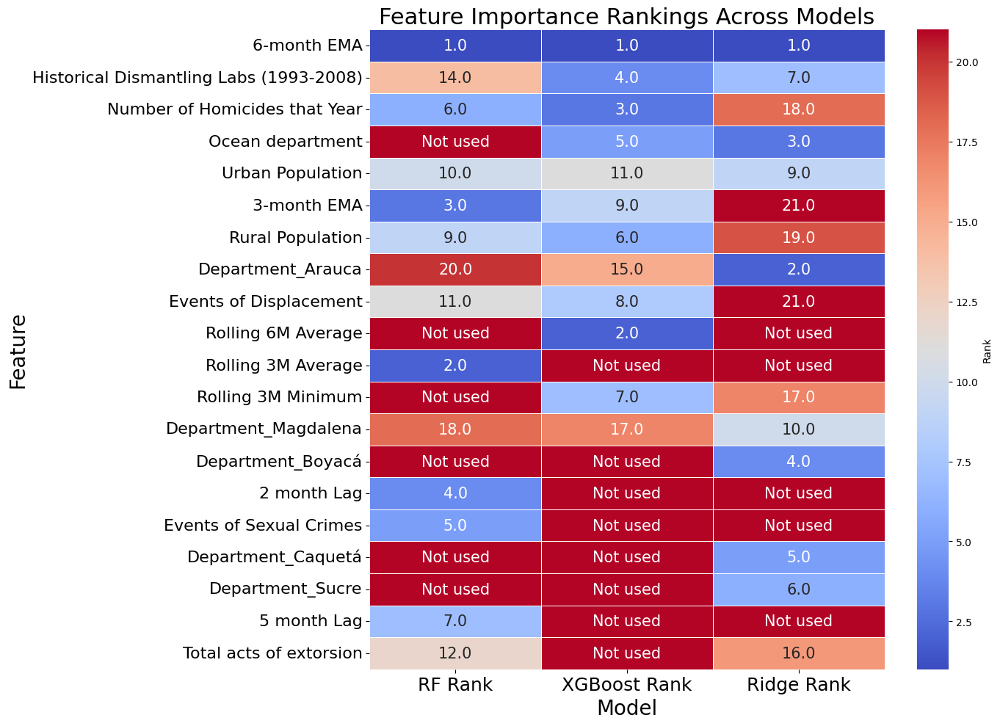

In [ ]:
#Taking top 20 feature and making a heatmap
  #@CITATION: Code adapted from ChatGPT
feature_rankings_df = pd.DataFrame({
    'Feature': [
        '6-month EMA',
        'Historical Dismantling Labs (1993-2008)',
        'Number of Homicides that Year',
        'Ocean department',
        'Urban Population',
        '3-month EMA',
        'Rural Population',
        'Department_Arauca',
        'Events of Displacement',
        'Rolling 6M Average',
        'Rolling 3M Average',
        'Rolling 3M Minimum',
        'Department_Magdalena',
        'Department_Boyacá',
        '2 month Lag',
        'Events of Sexual Crimes',
        'Department_Caquetá',
        'Department_Sucre',
        '5 month Lag',
        'Total acts of extorsion'
    ],
    'RF Rank': [1, 14, 6, 'N/A', 10, 3, 9, 20, 11, 'N/A', 2, 'N/A', 18, 'N/A', 4, 5, 'N/A', 'N/A', 7, 12],
    'XGBoost Rank': [1, 4, 3, 5, 11, 9, 6, 15, 8, 2, 'N/A', 7, 17, 'N/A', 'N/A', 'N/A', 'N/A', 'N/A', 'N/A', 'N/A'],
    'Ridge Rank': [1, 7, 18, 3, 9, 21, 19, 2, 21, 'N/A', 'N/A', 17, 10, 4, 'N/A', 'N/A', 5, 6, 'N/A', 16]
})

# Replace 'N/A' with NaN for processing
numeric_df = feature_rankings_df.replace('N/A', np.nan)

# Fill NaN with the max rank + 1 for heatmap coloring
max_rank = len(feature_rankings_df) + 1
heatmap_df = numeric_df.fillna(max_rank)

# Replace NaNs in the annotation labels with "Not used"
annot_df = numeric_df.fillna('Not used')

# Generate heatmap
plt.figure(figsize=(14, 10))
ax = sns.heatmap(
    heatmap_df.set_index('Feature'),  # Use features as the index
    annot=annot_df.set_index('Feature'),  # Show "Not used" labels
    cmap='coolwarm', fmt='',  # No decimal formatting
    linewidths=0.5, cbar_kws={'label': 'Rank'},
    annot_kws={"size": 15}
)

# Titles and labels
plt.title('Feature Importance Rankings Across Models', fontsize=22)
plt.xlabel('Model', fontsize=20)
plt.ylabel('Feature', fontsize=20)
plt.xticks(fontsize=18)
plt.yticks(fontsize=16)

# Adjust layout
plt.tight_layout()
plt.show()

###Department MSes across departments

In [ ]:
xgboost_mse_df.head()

,Department,MSE
30,Vaupés,0.358315
21,Nariño,0.534516
2,San Andrés...,0.677646
19,Magdalena,0.727927
5,Bolívar,0.809633


In [ ]:
linreg_mse_df.head()

,Department,MSE
30,Vaupés,0.387615
21,Nariño,0.595153
19,Magdalena,0.731089
22,Norte de Santander,0.902018
5,Bolívar,0.976907


In [ ]:
rf_mse_df.head()

,Department,MSE
30,Vaupés,0.034977
2,San_Andrés...,0.436594
21,Nariño,0.600150
15,Guainía,0.916759
8,Caquetá,1.015252


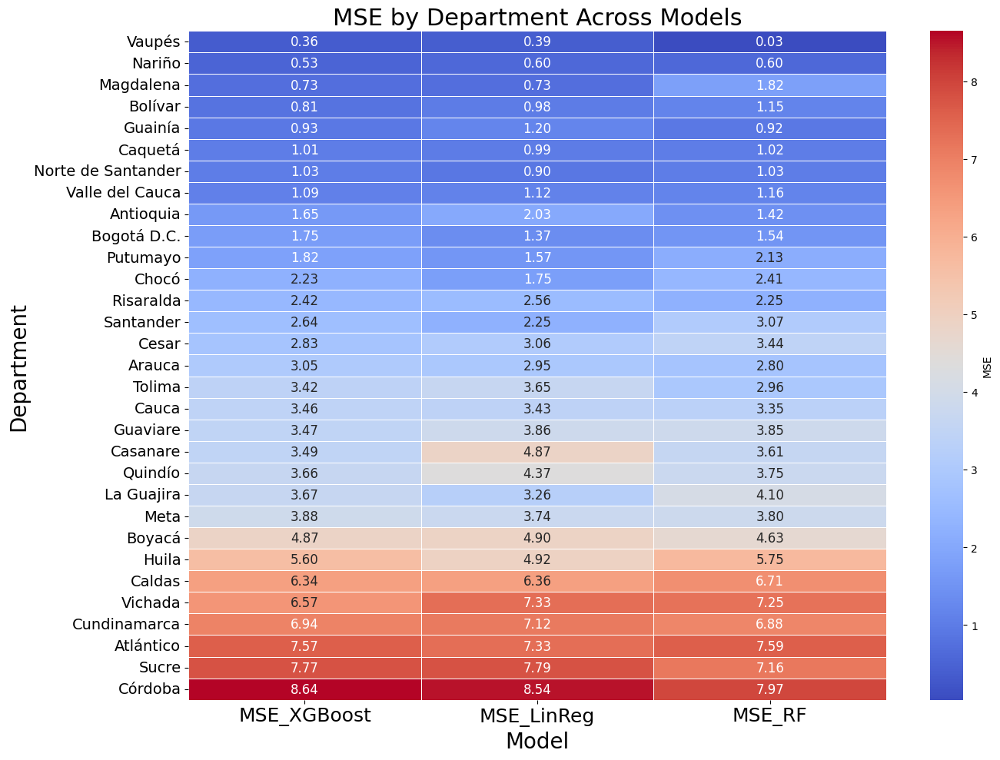

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
  #@CITATION: Code adapted from ChatGPT
# Step 1: Merge MSE DataFrames
# Assuming each has 'Department' and 'MSE' columns
mse_df = pd.merge(xgboost_mse_df, linreg_mse_df, on='Department', suffixes=('_XGBoost', '_LinReg'))
mse_df = pd.merge(mse_df, rf_mse_df, on='Department')
mse_df.rename(columns={'MSE': 'MSE_RF'}, inplace=True)

# Step 2: Set 'Department' as index for heatmap
mse_df.set_index('Department', inplace=True)

# Step 3: Generate heatmap
plt.figure(figsize=(14, 10))
sns.heatmap(
    mse_df,                        # Data
    annot=True,                    # Show MSE values inside cells
    cmap='coolwarm',                 # Colormap for MSE (yellow to green to blue)
    fmt=".2f",                     # Format numbers to 2 decimal places
    linewidths=0.5,                # Grid lines between cells
    cbar_kws={'label': 'MSE'},     # Color bar label
    annot_kws={"size": 12}         # Font size for annotations
)

# Titles and Labels
plt.title('MSE by Department Across Models', fontsize=22)
plt.xlabel('Model', fontsize=20)
plt.ylabel('Department', fontsize=20)
plt.xticks(fontsize=18)
plt.yticks(fontsize=14)

# Adjust layout
plt.tight_layout()
plt.show()


###Trying different log transformation

Summary Statistics for Adjusted Log Monthly Quantity Seized (kg):
Max: 9.978722382404289
Min: -4.605170185988091
Mean: 3.0183691559986383
Std Dev: 4.023509083697743
Percentage of Zeros Adjusted Log Quantity: 0.00%


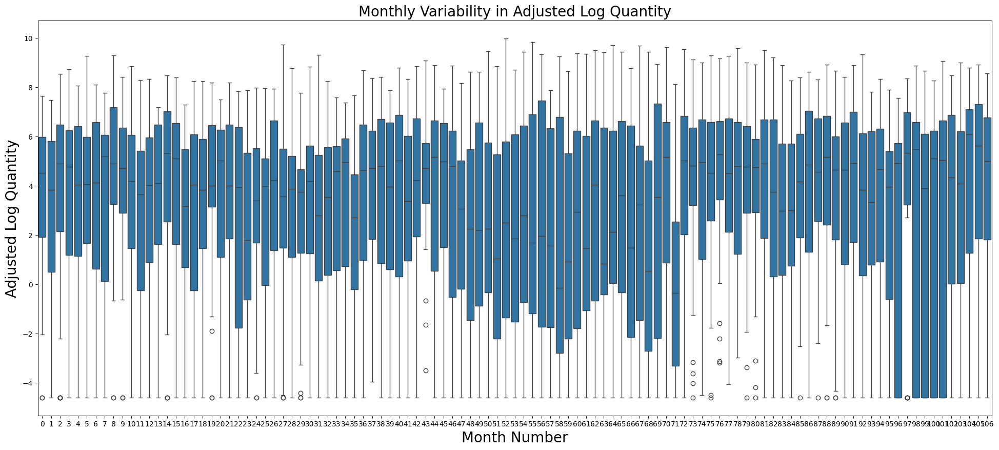

In [ ]:
final_train = pd.read_csv("/content/drive/MyDrive/Fall '24/COS 397 ML IW/Data Preprocessing/Final Data 12 5 (includes all) /Not standardized/final_train_not_std_no_engineering.csv")
train = pd.read_csv("/content/drive/MyDrive/Fall '24/COS 397 ML IW/Data Preprocessing/Final Data 12 5 (includes all) /Not standardized/train_encoded_not_std_no_engineering.csv")
val = pd.read_csv("/content/drive/MyDrive/Fall '24/COS 397 ML IW/Data Preprocessing/Final Data 12 5 (includes all) /Not standardized/val_encoded_not_std_no_engineering.csv")
test = pd.read_csv("/content/drive/MyDrive/Fall '24/COS 397 ML IW/Data Preprocessing/Final Data 12 5 (includes all) /Not standardized/test_encoded_not_std_no_engineering.csv")


final_train['Adjusted Log Quantity'] = np.log(final_train['Monthly Quantity Seized (kg)'] + 0.01)
test['Adjusted Log Quantity'] = np.log(test['Monthly Quantity Seized (kg)'] + 0.01)
print("Summary Statistics for Adjusted Log Monthly Quantity Seized (kg):")
print(f"Max: {final_train['Adjusted Log Quantity'].max()}")
print(f"Min: {final_train['Adjusted Log Quantity'].min()}")
print(f"Mean: {final_train['Adjusted Log Quantity'].mean()}")
print(f"Std Dev: {final_train['Adjusted Log Quantity'].std()}")

zero_count = (final_train['Adjusted Log Quantity'] == 0).sum()
total_count = len(final_train)
print(f"Percentage of Zeros Adjusted Log Quantity: {zero_count / total_count * 100:.2f}%")

plt.figure(figsize=(24, 10))
sns.boxplot(x='month_number', y='Adjusted Log Quantity', data=final_train)
plt.title("Monthly Variability in Adjusted Log Quantity", fontsize=20)
plt.xlabel("Month Number", fontsize=20)
plt.ylabel("Adjusted Log Quantity", fontsize=20)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.grid(False)
plt.show()

In [ ]:
final_train.head()

,month_number,Department,Monthly Quantity Seized (kg),Log Monthly Quantity Seized (kg),Percent Population in Urban Areas,HDI,GDI,Mean International Wealth Index,Infant Deaths per 1000 Live Births,Mean Years Schooling,...,Events of Forced Disappearances,Events of Displacement,Events of Homicide,Events of Personal Physical Injuries,Events of Personal Pyschological Injuries,Events of Mine Explosions,Events of Loss of Estate,Events of Kiddnapping,Events of Torture,Adjusted Log Quantity
0,0,Amazonas,0.149,0.138892,0.376,0.676,0.95,58.3,24.4,7.017,...,5.0,167.0,10.0,0.0,0.0,0.0,1.0,0.0,0.0,-1.838851
1,1,Amazonas,0.000,0.000000,0.376,0.676,0.95,58.3,24.4,7.017,...,5.0,167.0,10.0,0.0,0.0,0.0,1.0,0.0,0.0,-4.605170
2,2,Amazonas,0.100,0.095310,0.376,0.676,0.95,58.3,24.4,7.017,...,5.0,167.0,10.0,0.0,0.0,0.0,1.0,0.0,0.0,-2.207275
3,3,Amazonas,65.161,4.192091,0.376,0.676,0.95,58.3,24.4,7.017,...,5.0,167.0,10.0,0.0,0.0,0.0,1.0,0.0,0.0,4.177015
4,4,Amazonas,6.344,1.993884,0.376,0.676,0.95,58.3,24.4,7.017,...,5.0,167.0,10.0,0.0,0.0,0.0,1.0,0.0,0.0,1.849085


In [ ]:
#sort by department then year instead of year then department
combined = pd.concat([final_train, test])
combined_df = combined.drop(columns=['Log Monthly Quantity Seized (kg)', 'Monthly Quantity Seized (kg)'])
combined_df = combined_df.rename(columns={'Adjusted Log Quantity': 'Log Monthly Quantity Seized (kg)'}) #renaming so i can copy and paste code
combined_df.head()

,month_number,Department,Percent Population in Urban Areas,HDI,GDI,Mean International Wealth Index,Infant Deaths per 1000 Live Births,Mean Years Schooling,Log Gross National Income Per Capita in 1000 USD,Life Expectancy,...,Events of Forced Disappearances,Events of Displacement,Events of Homicide,Events of Personal Physical Injuries,Events of Personal Pyschological Injuries,Events of Mine Explosions,Events of Loss of Estate,Events of Kiddnapping,Events of Torture,Log Monthly Quantity Seized (kg)
0,0,Amazonas,0.376,0.676,0.95,58.3,24.4,7.017,8.734,73.49,...,5.0,167.0,10.0,0.0,0.0,0.0,1.0,0.0,0.0,-1.838851
1,1,Amazonas,0.376,0.676,0.95,58.3,24.4,7.017,8.734,73.49,...,5.0,167.0,10.0,0.0,0.0,0.0,1.0,0.0,0.0,-4.605170
2,2,Amazonas,0.376,0.676,0.95,58.3,24.4,7.017,8.734,73.49,...,5.0,167.0,10.0,0.0,0.0,0.0,1.0,0.0,0.0,-2.207275
3,3,Amazonas,0.376,0.676,0.95,58.3,24.4,7.017,8.734,73.49,...,5.0,167.0,10.0,0.0,0.0,0.0,1.0,0.0,0.0,4.177015
4,4,Amazonas,0.376,0.676,0.95,58.3,24.4,7.017,8.734,73.49,...,5.0,167.0,10.0,0.0,0.0,0.0,1.0,0.0,0.0,1.849085


In [ ]:
#LAG FEATURE ENGINEERING

  #@CITATION: Code adapted from ChatGPT
combined_df = combined_df.sort_values(by=['Department', 'month_number'])
#combined_df = combined_df.drop(columns=['Monthly Quantity Seized (kg)'])


#LAGS
combined_df['Lagged_Log_Monthly_Quantity_Seized_1'] = combined_df.groupby('Department')['Log Monthly Quantity Seized (kg)'].shift(1)
combined_df['Lagged_Log_Monthly_Quantity_Seized_2'] = combined_df.groupby('Department')['Log Monthly Quantity Seized (kg)'].shift(2)
combined_df['Lagged_Log_Monthly_Quantity_Seized_3'] = combined_df.groupby('Department')['Log Monthly Quantity Seized (kg)'].shift(3)
combined_df['Lagged_Log_Monthly_Quantity_Seized_4'] = combined_df.groupby('Department')['Log Monthly Quantity Seized (kg)'].shift(4)
combined_df['Lagged_Log_Monthly_Quantity_Seized_5'] = combined_df.groupby('Department')['Log Monthly Quantity Seized (kg)'].shift(5)
combined_df['Lagged_Log_Monthly_Quantity_Seized_6'] = combined_df.groupby('Department')['Log Monthly Quantity Seized (kg)'].shift(6)


#ROLLING AVERAGES
combined_df['Rolling_3M_Log_Monthly_Quantity'] = combined_df.groupby('Department')['Log Monthly Quantity Seized (kg)'].transform(lambda x: x.rolling(3, closed='left').mean())
combined_df['Rolling_6M_Log_Monthly_Quantity'] = combined_df.groupby('Department')['Log Monthly Quantity Seized (kg)'].transform(lambda x: x.rolling(6, closed='left').mean())


# ROLLING STD DEV
combined_df['Rolling_3M_Std_Log_Monthly_Quantity'] = combined_df.groupby('Department')['Log Monthly Quantity Seized (kg)'].transform(lambda x: x.rolling(3, closed='left').std())
combined_df['Rolling_6M_Std_Log_Monthly_Quantity'] = combined_df.groupby('Department')['Log Monthly Quantity Seized (kg)'].transform(lambda x: x.rolling(6, closed='left').std())

#ROLLING MIN
combined_df['Rolling_3M_Min_Log_Monthly_Quantity'] = combined_df.groupby('Department')['Log Monthly Quantity Seized (kg)'].transform(
    lambda x: x.rolling(3, closed='left').min())
combined_df['Rolling_6M_Min_Log_Monthly_Quantity'] = combined_df.groupby('Department')['Log Monthly Quantity Seized (kg)'].transform(
    lambda x: x.rolling(6, closed='left').min())

#ROLLING MAX
combined_df['Rolling_3M_Max_Log_Monthly_Quantity'] = combined_df.groupby('Department')['Log Monthly Quantity Seized (kg)'].transform(
    lambda x: x.rolling(3, closed='left').max())
combined_df['Rolling_6M_Max_Log_Monthly_Quantity'] = combined_df.groupby('Department')['Log Monthly Quantity Seized (kg)'].transform(
    lambda x: x.rolling(6, closed='left').max())
#ROLLING RANGE
combined_df['Rolling_3M_Range_Log_Monthly_Quantity'] = (
    combined_df['Rolling_3M_Max_Log_Monthly_Quantity'] - combined_df['Rolling_3M_Min_Log_Monthly_Quantity'])
combined_df['Rolling_6M_Range_Log_Monthly_Quantity'] = (
    combined_df['Rolling_6M_Max_Log_Monthly_Quantity'] - combined_df['Rolling_3M_Min_Log_Monthly_Quantity'])

#EMA
combined_df['EMA_3M_Log_Monthly_Quantity'] = (
    combined_df
    .groupby('Department')['Log Monthly Quantity Seized (kg)']
    .transform(lambda x: x.shift(1).ewm(span=3, adjust=False).mean())
)
combined_df['EMA_6M_Log_Monthly_Quantity'] = (
    combined_df
    .groupby('Department')['Log Monthly Quantity Seized (kg)']
    .transform(lambda x: x.shift(1).ewm(span=6, adjust=False).mean())
)


#MOMENTUM
combined_df['Momentum_3_6'] = (
    combined_df['Rolling_6M_Log_Monthly_Quantity'].shift(1) - combined_df['Rolling_3M_Log_Monthly_Quantity'].shift(1) )



#Cumulative sum per year
combined_df['Year'] = 2012 + (combined_df['month_number'] // 12)
combined_df['Cumulative_Log_Monthly_Quantity_Seized_Per_Year'] = (
    combined_df.groupby(['Department', 'Year'])['Log Monthly Quantity Seized (kg)']
    .cumsum()
    .shift(1)
)
combined_df.drop(columns=['Year'], inplace=True)

#Cumulative rolling sum




#season
combined_df['month'] = combined_df['month_number'] % 12
def get_season(month):
    if month in [11, 0, 1]:      # December, January, February
        return 'Winter'
    elif month in [2, 3, 4]:     # March, April, May
        return 'Spring'
    elif month in [5, 6, 7]:     # June, July, August
        return 'Summer'
    elif month in [8, 9, 10]:    # September, October, November
        return 'Fall'
combined_df['season'] = combined_df['month'].apply(get_season)
combined_df.drop(columns=['month'], inplace=True)
combined_df = pd.get_dummies(combined_df, columns=['season'], drop_first=True)
dept_columns = [col for col in combined_df.columns if col.startswith('season_')]
for col in dept_columns:
  combined_df[col] = combined_df[col].apply(lambda x: 1 if x == True else 0)




# drop Nan
combined_lagged = combined_df.dropna(subset=['Lagged_Log_Monthly_Quantity_Seized_1',
       'Lagged_Log_Monthly_Quantity_Seized_2',
       'Lagged_Log_Monthly_Quantity_Seized_3',
       'Lagged_Log_Monthly_Quantity_Seized_4',
       'Lagged_Log_Monthly_Quantity_Seized_5',
       'Lagged_Log_Monthly_Quantity_Seized_6',
       'Rolling_3M_Log_Monthly_Quantity','Rolling_6M_Log_Monthly_Quantity',
       'Rolling_3M_Std_Log_Monthly_Quantity', 'Rolling_6M_Std_Log_Monthly_Quantity',
       'Rolling_3M_Min_Log_Monthly_Quantity', 'Rolling_6M_Min_Log_Monthly_Quantity',
       'Rolling_3M_Max_Log_Monthly_Quantity', 'Rolling_6M_Max_Log_Monthly_Quantity',
       'Rolling_3M_Range_Log_Monthly_Quantity', 'Rolling_6M_Range_Log_Monthly_Quantity',
        'EMA_3M_Log_Monthly_Quantity', 'EMA_6M_Log_Monthly_Quantity',
       'Momentum_3_6',
       'Cumulative_Log_Monthly_Quantity_Seized_Per_Year',
        'season_Spring', 'season_Summer','season_Winter'
        ]).reset_index(drop=True)


#Growth rates
combined_lagged['Lagged_Log_Monthly_Quantity_Seized_1'] = combined_lagged['Lagged_Log_Monthly_Quantity_Seized_1'].replace(0, 1e-10)
combined_lagged['Lagged_Log_Monthly_Quantity_Seized_2'] = combined_lagged['Lagged_Log_Monthly_Quantity_Seized_2'].replace(0, 1e-10)
combined_lagged['Lagged_Log_Monthly_Quantity_Seized_3'] = combined_lagged['Lagged_Log_Monthly_Quantity_Seized_3'].replace(0, 1e-10)
combined_lagged['Lagged_Log_Monthly_Quantity_Seized_4'] = combined_lagged['Lagged_Log_Monthly_Quantity_Seized_4'].replace(0, 1e-10)
combined_lagged['Lagged_Log_Monthly_Quantity_Seized_5'] = combined_lagged['Lagged_Log_Monthly_Quantity_Seized_5'].replace(0, 1e-10)
combined_lagged['Lagged_Log_Monthly_Quantity_Seized_6'] = combined_lagged['Lagged_Log_Monthly_Quantity_Seized_6'].replace(0, 1e-10)

combined_lagged['Growth_Rate_Lag_1_2'] = (
    combined_lagged['Lagged_Log_Monthly_Quantity_Seized_1'] - combined_lagged['Lagged_Log_Monthly_Quantity_Seized_2']
) / combined_lagged['Lagged_Log_Monthly_Quantity_Seized_2']

combined_lagged['Lagged_Log_Monthly_Quantity_Seized_3'] = combined_lagged['Lagged_Log_Monthly_Quantity_Seized_3'].replace(0, 1e-10)
combined_lagged['Growth_Rate_Lag_2_3'] = (
    combined_lagged['Lagged_Log_Monthly_Quantity_Seized_2'] - combined_lagged['Lagged_Log_Monthly_Quantity_Seized_3']
) / combined_lagged['Lagged_Log_Monthly_Quantity_Seized_3']
combined_lagged['Growth_Rate_Lag_1_3'] = (
    combined_lagged['Lagged_Log_Monthly_Quantity_Seized_1'] - combined_lagged['Lagged_Log_Monthly_Quantity_Seized_3']
) / combined_lagged['Lagged_Log_Monthly_Quantity_Seized_3']




#one hot encode departments
combined_lagged_encoded = pd.get_dummies(combined_lagged, columns=['Department'], drop_first = True) # not drop firsting!
dept_columns = [col for col in combined_lagged_encoded.columns if col.startswith('Department_')]
for col in dept_columns:
  combined_lagged_encoded[col] = combined_lagged_encoded[col].apply(lambda x: 1 if x == True else 0)


combined_lagged_encoded.head()

#split train val test (60, 20, 20)
train = combined_lagged_encoded[combined_lagged_encoded['month_number'] < 82]
val = combined_lagged_encoded[(combined_lagged_encoded['month_number'] >= 82) & (combined_lagged_encoded['month_number'] < 107)]
test = combined_lagged_encoded[combined_lagged_encoded['month_number'] >= 107].reset_index(drop=True)
final_train = pd.concat([train, val], axis=0).reset_index(drop=True)
train.head()

,month_number,Percent Population in Urban Areas,HDI,GDI,Mean International Wealth Index,Infant Deaths per 1000 Live Births,Mean Years Schooling,Log Gross National Income Per Capita in 1000 USD,Life Expectancy,Population Density_x,...,Department_Norte de Santander,Department_Putumayo,Department_Quindío,Department_Risaralda,Department_Santander,Department_Sucre,Department_Tolima,Department_Valle del Cauca,Department_Vaupés,Department_Vichada
0,7,0.376,0.676,0.95,58.3,24.4,7.017,8.734,73.49,35.654753,...,0,0,0,0,0,0,0,0,0,0
1,8,0.376,0.676,0.95,58.3,24.4,7.017,8.734,73.49,50.000747,...,0,0,0,0,0,0,0,0,0,0
2,9,0.376,0.676,0.95,58.3,24.4,7.017,8.734,73.49,11.557515,...,0,0,0,0,0,0,0,0,0,0
3,10,0.376,0.676,0.95,58.3,24.4,7.017,8.734,73.49,68.641549,...,0,0,0,0,0,0,0,0,0,0
4,11,0.376,0.676,0.95,58.3,24.4,7.017,8.734,73.49,207.971428,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
deptfeatures = ['Log Monthly Quantity Seized (kg)', 'month_number',
                             'Border_Department',
       'Ocean_department', 'Department_Antioquia', 'Department_Arauca',
       'Department_Archipiélago de San Andrés, Providencia y Santa Catalina',
       'Department_Atlántico', 'Department_Bogotá D.C.', 'Department_Bolívar',
       'Department_Boyacá', 'Department_Caldas', 'Department_Caquetá',
       'Department_Casanare', 'Department_Cauca', 'Department_Cesar',
       'Department_Chocó', 'Department_Cundinamarca', 'Department_Córdoba',
       'Department_Guainía', 'Department_Guaviare', 'Department_Huila',
       'Department_La Guajira', 'Department_Magdalena', 'Department_Meta',
       'Department_Nariño', 'Department_Norte de Santander',
       'Department_Putumayo', 'Department_Quindío', 'Department_Risaralda',
       'Department_Santander', 'Department_Sucre', 'Department_Tolima',
       'Department_Valle del Cauca', 'Department_Vaupés',
       'Department_Vichada']
socioeconomic_features = ['Percent Population in Urban Areas', 'HDI', 'GDI', 'Mean International Wealth Index',
 'Infant Deaths per 1000 Live Births', 'Mean Years Schooling', 'Log Gross National Income Per Capita in 1000 USD',
 'Life Expectancy', 'Population Density_x', 'Number of Corruption Cases', 'Percent of Total Corruption Cases for That Year',
 'Number of Homicides that Year', 'Gini Coefficient', '% Poorest Household (IWI under 30)']
cede_features = ['Current income (millions pesos)', 'Tax income (millions pesos)', 'Transfers from national entities (millions of pesos)', 'Current expensives linked to institutional performance', 'Operating Expenses', 'Area km2', 'Rural population', 'Urban population', 'Total population', 'Distance to Bogota', 'Population Density_y', 'Urban to Rural Population Ratio', 'Percent Urban Population', 'Percent Rural Population', 'Historical Attacks on Population By FARC (1993-2008)', 'Historical Attacks on Population by ELN (1993-2008)', 'Historical Attacks on Population by AUC (1993-2008)', 'Historical Antinarcotics Operations (1993-2008)', 'Historical Dismantling Labs (1993-2008)', 'Total acts of terrorism', 'Total acts against police', 'Total subversive actions', 'Total acts of extorsion', 'Hectares of coca', 'Hectores of coca erdaicted manually ', 'Presence of coca cultivation (dummy)', 'Civilians hurt by mines', 'Civilians killed by mines', 'Public force members hurt by mines', 'Public force members killed by mines', 'Events of Abandoned property', 'Events of Acts of Terrorism', 'Events of Threats', 'Events of Confinement', 'Events of Sexual Crimes', 'Events of Forced Disappearances', 'Events of Displacement', 'Events of Homicide', 'Events of Personal Physical Injuries', 'Events of Personal Pyschological Injuries', 'Events of Mine Explosions', 'Events of Loss of Estate', 'Events of Kiddnapping', 'Events of Torture']
lag_features = ['Lagged_Log_Monthly_Quantity_Seized_1', 'Lagged_Log_Monthly_Quantity_Seized_2', 'Lagged_Log_Monthly_Quantity_Seized_3', 'Lagged_Log_Monthly_Quantity_Seized_4', 'Lagged_Log_Monthly_Quantity_Seized_5', 'Lagged_Log_Monthly_Quantity_Seized_6', 'Rolling_3M_Log_Monthly_Quantity', 'Rolling_6M_Log_Monthly_Quantity', 'Rolling_3M_Std_Log_Monthly_Quantity', 'Rolling_6M_Std_Log_Monthly_Quantity', 'Rolling_3M_Min_Log_Monthly_Quantity', 'Rolling_6M_Min_Log_Monthly_Quantity', 'Rolling_3M_Max_Log_Monthly_Quantity', 'Rolling_6M_Max_Log_Monthly_Quantity', 'Rolling_3M_Range_Log_Monthly_Quantity', 'Rolling_6M_Range_Log_Monthly_Quantity', 'EMA_3M_Log_Monthly_Quantity', 'EMA_6M_Log_Monthly_Quantity', 'Momentum_3_6', 'Cumulative_Log_Monthly_Quantity_Seized_Per_Year', 'season_Spring', 'season_Summer', 'season_Winter', 'Growth_Rate_Lag_1_2', 'Growth_Rate_Lag_2_3', 'Growth_Rate_Lag_1_3']


columns = socioeconomic_features + cede_features + lag_features

from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

X_train = final_train[columns]
X_test = test[columns]


from sklearn.preprocessing import StandardScaler
scaler.fit(X_train)

X_train_standardized = scaler.transform(X_train)
X_test_standardized = scaler.transform(X_test)



X_train_standardized= pd.DataFrame(X_train_standardized, columns=columns)
X_test_standardized= pd.DataFrame(X_test_standardized, columns=columns)


final_train2 = pd.concat(
    [final_train[deptfeatures], X_train_standardized], axis=1)
final_train = final_train2
train = final_train[final_train['month_number'] < 82]
val = final_train[(final_train['month_number'] >= 82) & (final_train['month_number'] < 107)]


test = pd.concat(
    [test[deptfeatures], X_test_standardized], axis=1)

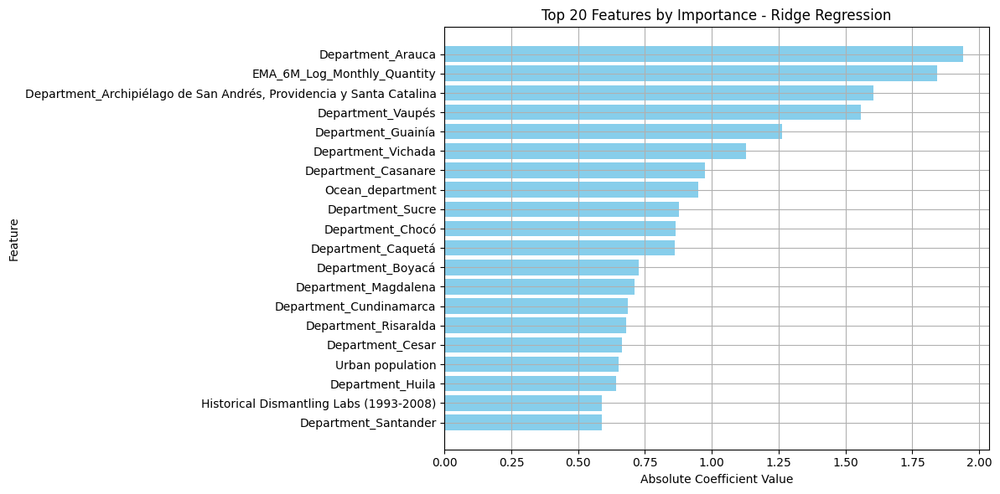

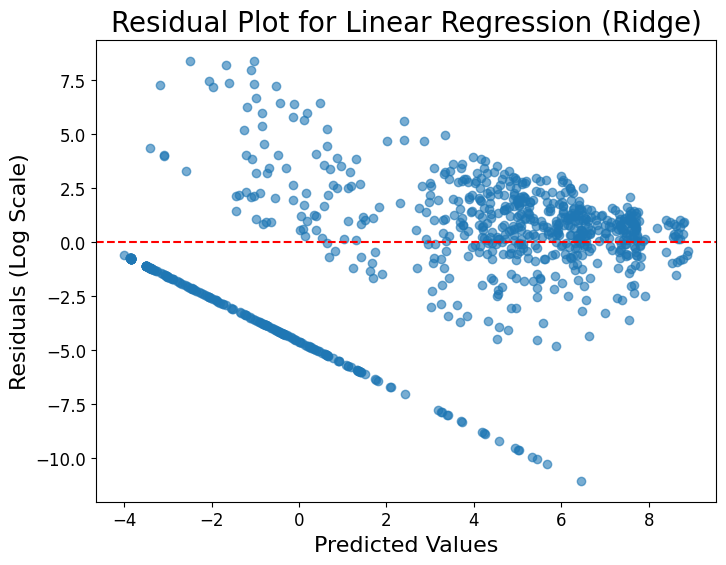

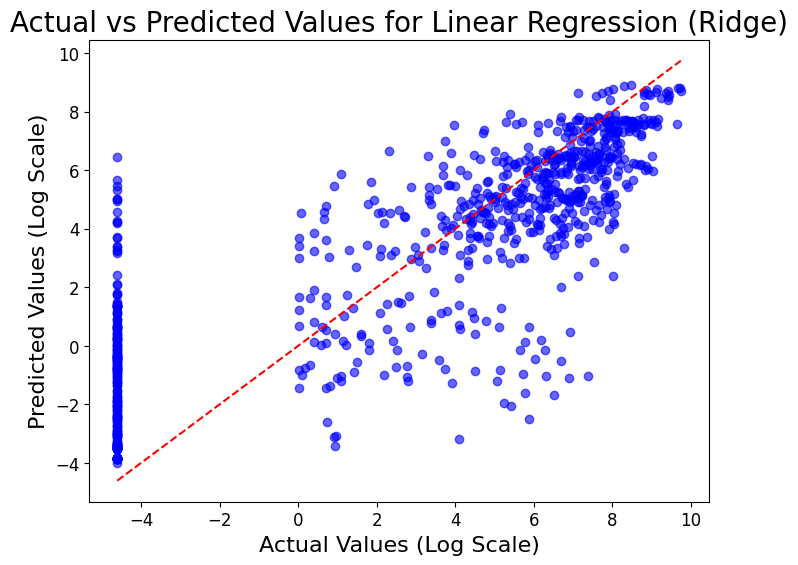

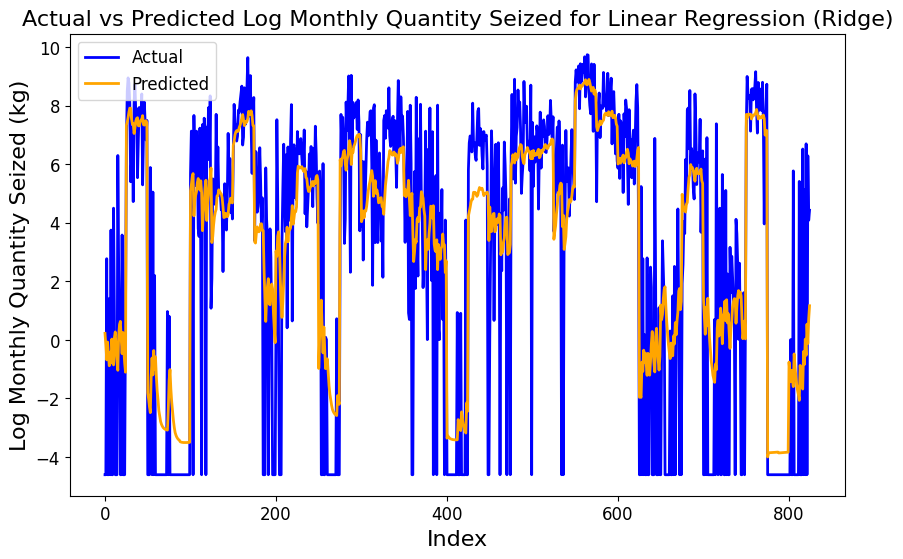

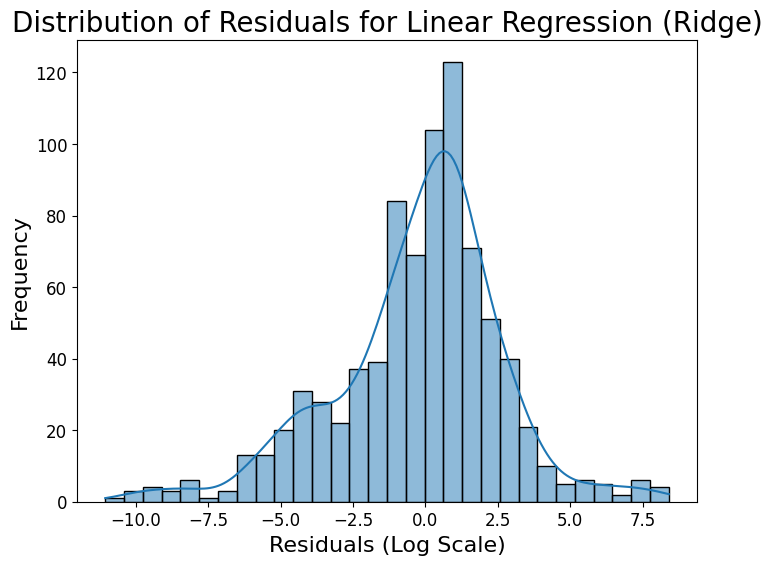

Ridge Regression
Testing MSE: 8.396991886588568
R-squared (R²): 0.6656849585974276


In [ ]:
from sklearn.linear_model import Ridge

selected_lag_features = ['EMA_3M_Log_Monthly_Quantity',
 'EMA_6M_Log_Monthly_Quantity','Rolling_6M_Log_Monthly_Quantity', 'Rolling_3M_Min_Log_Monthly_Quantity',
 'Rolling_3M_Max_Log_Monthly_Quantity']
deptfeatures = [ 'Border_Department',
       'Ocean_department', 'Department_Antioquia', 'Department_Arauca',
       'Department_Archipiélago de San Andrés, Providencia y Santa Catalina',
       'Department_Atlántico', 'Department_Bogotá D.C.', 'Department_Bolívar',
       'Department_Boyacá', 'Department_Caldas', 'Department_Caquetá',
       'Department_Casanare', 'Department_Cauca', 'Department_Cesar',
       'Department_Chocó', 'Department_Cundinamarca', 'Department_Córdoba',
       'Department_Guainía', 'Department_Guaviare', 'Department_Huila',
       'Department_La Guajira', 'Department_Magdalena', 'Department_Meta',
       'Department_Nariño', 'Department_Norte de Santander',
       'Department_Putumayo', 'Department_Quindío', 'Department_Risaralda',
       'Department_Santander', 'Department_Sucre', 'Department_Tolima',
       'Department_Valle del Cauca', 'Department_Vaupés',
       'Department_Vichada']

linReg_selected_features = ['month_number', 'Log Monthly Quantity Seized (kg)', 'Urban population', 'Current income (millions pesos)', 'Historical Dismantling Labs (1993-2008)',  'Rural population',
                            'Life Expectancy', 'GDI', 'Events of Confinement',  'Number of Homicides that Year','Events of Threats','Total acts of extorsion'] + selected_lag_features + deptfeatures
linReg_train = train[linReg_selected_features]
linReg_val = val[linReg_selected_features]
linReg_test = test[linReg_selected_features]
linReg_final_train = final_train[linReg_selected_features]
linReg_withRidge_Final(linReg_final_train, linReg_test)

XGBoost
Training MSE: 6.022563299187516
Testing Mean Squared Error (MSE): 9.218488495536814
R-squared (R²): 0.6329781659100069


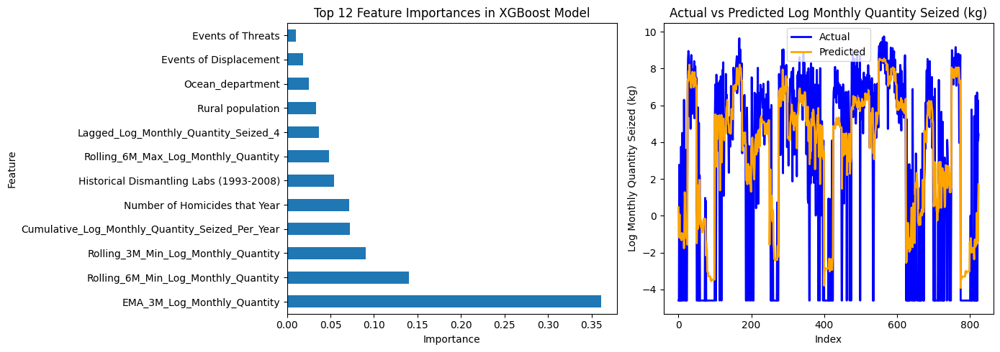

In [ ]:
all_features = ['month_number', 'Log Monthly Quantity Seized (kg)'] + ['Historical Dismantling Labs (1993-2008)', 'Number of Homicides that Year', 'Rural population',
 'Urban population', 'Events of Displacement',  'Events of Threats',  'Current income (millions pesos)',  'Historical Attacks on Population by ELN (1993-2008)'] + [
                 'EMA_3M_Log_Monthly_Quantity',   'Cumulative_Log_Monthly_Quantity_Seized_Per_Year', 'Rolling_6M_Max_Log_Monthly_Quantity', 'Rolling_6M_Min_Log_Monthly_Quantity', 'Rolling_3M_Min_Log_Monthly_Quantity', 'Lagged_Log_Monthly_Quantity_Seized_4'] + deptfeatures

xg_train = train[all_features]
xg_val = val[all_features]
xg_test = test[all_features]
xg_final_train = final_train[all_features]
XGBoost(xg_final_train, xg_test)
